# Loading data

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
import xgboost as xgb
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.svm import SVR, SVC
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

In [15]:
df = pd.read_csv('/kaggle/input/master-thesis/data.csv', sep=';')

In [16]:
df.head()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume,quality
0,106.476184,80.617,7.124,3.16,74.83,886.900000,904.000000,116.9,104.300000,145.6,922.3,8.82,18.73,1.0
1,105.505000,81.362,6.968,3.16,74.81,919.409791,935.900000,113.9,104.900000,145.6,930.5,8.59,18.73,1.0
2,105.505000,80.411,6.864,4.08,74.81,908.600000,902.344823,120.5,106.503496,147.0,933.1,8.80,18.98,1.0
3,106.474827,81.162,6.864,3.16,74.82,879.410871,902.033653,127.3,104.900000,145.6,922.3,8.85,18.73,1.0
4,106.466140,81.471,6.864,3.22,74.83,885.644260,902.821269,120.5,106.700000,145.6,917.5,8.80,18.75,1.0


In [17]:
df.columns

Index(['Melt temperature', 'Mold temperature', 'time_to_fill',
       'ZDx - Plasticizing time', 'ZUx - Cycle time', 'SKx - Closing force',
       'SKs - Clamping force peak value',
       'Ms - Torque peak value current cycle',
       'Mm - Torque mean value current cycle',
       'APSs - Specific back pressure peak value',
       'APVs - Specific injection pressure peak value',
       'CPn - Screw position at the end of hold pressure', 'SVo - Shot volume',
       'quality'],
      dtype='object')

### Lets check simple statistics

In [18]:
df.describe()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume,quality
count,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000
mean,106.892040,81.326023,7.459043,3.234173,75.218794,901.974834,919.351778,116.716747,104.163904,146.230048,900.972846,8.808863,18.756285,2.461751
std,5.615773,0.428813,1.688106,0.343230,0.432761,11.098192,10.780023,5.029085,4.802195,0.804894,25.519215,0.097238,0.095528,1.123611
min,81.747000,78.409000,6.084000,2.780000,74.780000,876.700000,894.800000,94.200000,76.500000,144.800000,780.500000,8.330000,18.510000,1.000000
25%,105.914500,81.123500,6.292000,3.000000,74.820000,893.600000,914.400000,114.200000,103.550000,145.600000,886.650000,8.770000,18.710000,1.000000
50%,106.089000,81.327000,6.968000,3.192600,74.830000,902.400000,918.800000,116.900000,105.200000,146.100000,906.800000,8.820000,18.750000,2.000000
75%,106.263000,81.441000,7.124000,3.290000,75.650000,909.400000,926.300000,120.200000,106.531415,146.700000,918.900000,8.850000,18.790000,4.000000
max,155.032000,82.159000,11.232000,6.610000,75.790000,930.600000,946.500000,130.300000,114.900000,150.500000,943.000000,9.060000,19.230000,4.000000


# Clearing the data

## First of all lets check our data for null values

In [19]:
df1 = df.dropna()

In [20]:
df1.describe()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume,quality
count,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000
mean,106.892040,81.326023,7.459043,3.234173,75.218794,901.974834,919.351778,116.716747,104.163904,146.230048,900.972846,8.808863,18.756285,2.461751
std,5.615773,0.428813,1.688106,0.343230,0.432761,11.098192,10.780023,5.029085,4.802195,0.804894,25.519215,0.097238,0.095528,1.123611
min,81.747000,78.409000,6.084000,2.780000,74.780000,876.700000,894.800000,94.200000,76.500000,144.800000,780.500000,8.330000,18.510000,1.000000
25%,105.914500,81.123500,6.292000,3.000000,74.820000,893.600000,914.400000,114.200000,103.550000,145.600000,886.650000,8.770000,18.710000,1.000000
50%,106.089000,81.327000,6.968000,3.192600,74.830000,902.400000,918.800000,116.900000,105.200000,146.100000,906.800000,8.820000,18.750000,2.000000
75%,106.263000,81.441000,7.124000,3.290000,75.650000,909.400000,926.300000,120.200000,106.531415,146.700000,918.900000,8.850000,18.790000,4.000000
max,155.032000,82.159000,11.232000,6.610000,75.790000,930.600000,946.500000,130.300000,114.900000,150.500000,943.000000,9.060000,19.230000,4.000000


#### after deleting null values rows, we have same amount of rows, which means our data is clear for nulls

## Lets remove duplicates from our data

In [21]:
df1 = df1.drop_duplicates()

In [22]:
df1.count()

Melt temperature                                    1451
Mold temperature                                    1451
time_to_fill                                        1451
ZDx - Plasticizing time                             1451
ZUx - Cycle time                                    1451
SKx - Closing force                                 1451
SKs - Clamping force peak value                     1451
Ms - Torque peak value current cycle                1451
Mm - Torque mean value current cycle                1451
APSs - Specific back pressure peak value            1451
APVs - Specific injection pressure peak value       1451
CPn - Screw position at the end of hold pressure    1451
SVo - Shot volume                                   1451
quality                                             1451
dtype: int64

#### How we can see there were no duplicates!

## Data visualization

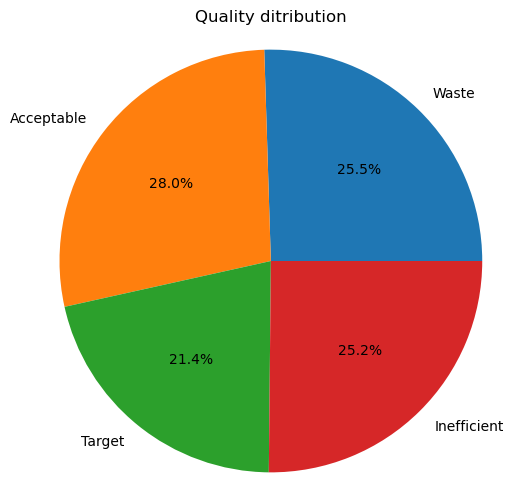

In [23]:
q_counts = df1['quality'].value_counts().sort_index()
pie = plt.figure(figsize=(6, 6))  # Set the figure size
plt.pie(q_counts, labels=['Waste', 'Acceptable', 'Target', 'Inefficient'], autopct='%1.1f%%')  # Create the pie chart
plt.axis('equal')  # Ensure the pie is drawn as a circle
plt.title('Quality ditribution')  
pie.figure.savefig("/kaggle/working/pie_quality_distribution.png")

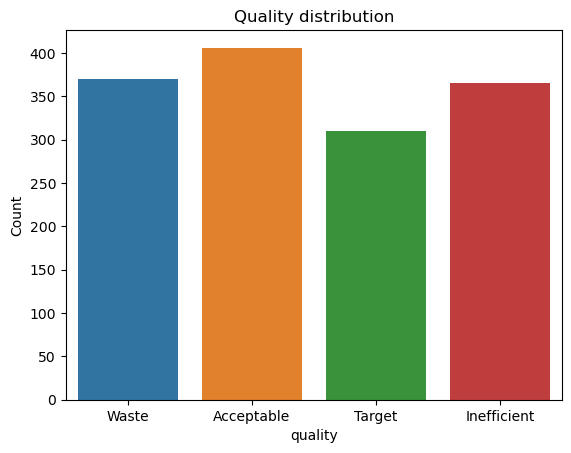

In [24]:
# Example 4: Bar plot
bar_pl = sns.countplot(x='quality', data=df1)
plt.ylabel('Count')
y_pos = np.arange(4) 
plt.xticks(y_pos, ["Waste", "Acceptable", "Target", "Inefficient"]) 
plt.title('Quality distribution')
plt.show()
bar_pl.figure.savefig("/kaggle/working//bar_quality_distribution.png")


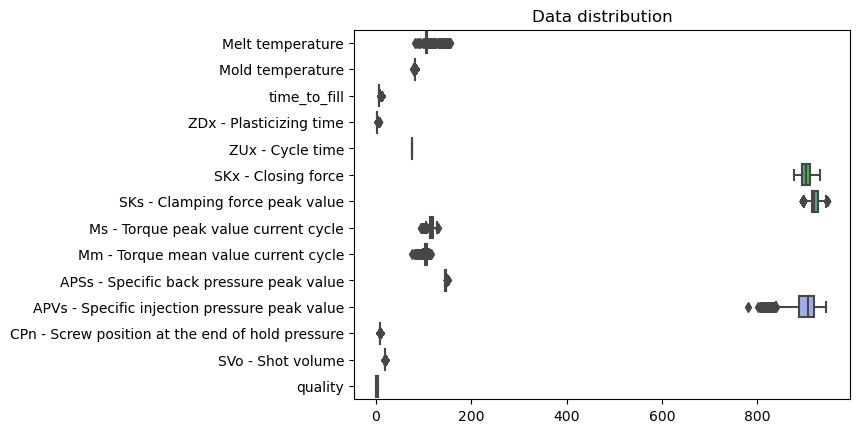

In [25]:
# Create the box plot using Seaborn
box_pl = sns.boxplot(data=df1, orient='h')
plt.title('Data distribution')
plt.show()
#box_pl.figure.savefig("images/box_data_distribution.png")

In [26]:
# for i in df1.columns.array:
#     fig = plt.figure()
#     plt.title(i)
#     plt.scatter(x = df1[i], y = df1['quality'])
#     #fig.savefig("Trajectory:_" + i + '_to_' + 'quality')
#     plt.show()

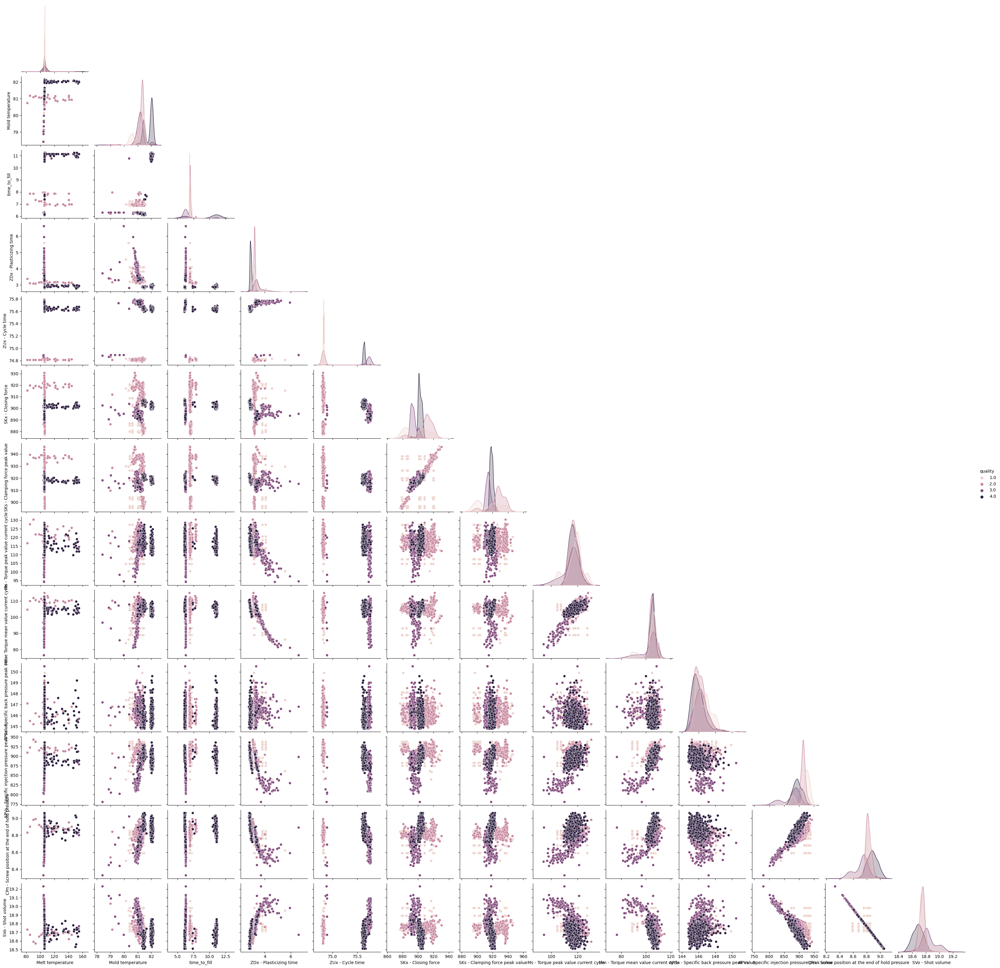

In [27]:
trajs=sns.pairplot(df1,hue=df1.columns[-1],corner=True)

In [28]:
#trajs.figure.savefig("images/trajectories.png")

# Lets devide data into TRAIN and TEST 

In [29]:
training_data, testing_data = train_test_split(df1, test_size=0.2, random_state=25)
X_train = training_data.iloc[:, 0:-1]
y_train = pd.DataFrame(training_data.iloc[:, -1])
X_test = testing_data.iloc[:, 0:-1]
y_test = pd.DataFrame(testing_data.iloc[:, -1])
X = df1.iloc[:, 0:-1]
y = pd.DataFrame(df1.iloc[:, -1])

In [30]:
X_train.reset_index(drop=True ,inplace=True)
y_train.reset_index(drop=True ,inplace=True)
X_test.reset_index(drop=True ,inplace=True)
y_test.reset_index(drop=True ,inplace=True)

In [31]:
y_train = np.ravel(y_train)
y_test = np.ravel(y_test)
y = np.ravel(y)

# Correlations

## Pearson correlation coefficient

Lets count all the correlations

In [32]:
X_corr = X.corr(method='pearson')
X_corr = X_corr.round(3)
strong_correlations_X= X_corr[X_corr.abs() > 0.7]
strong_correlations_X = strong_correlations_X[strong_correlations_X.abs() < 1]

## Lets build heatmaps


### For strong correlations

<Axes: >

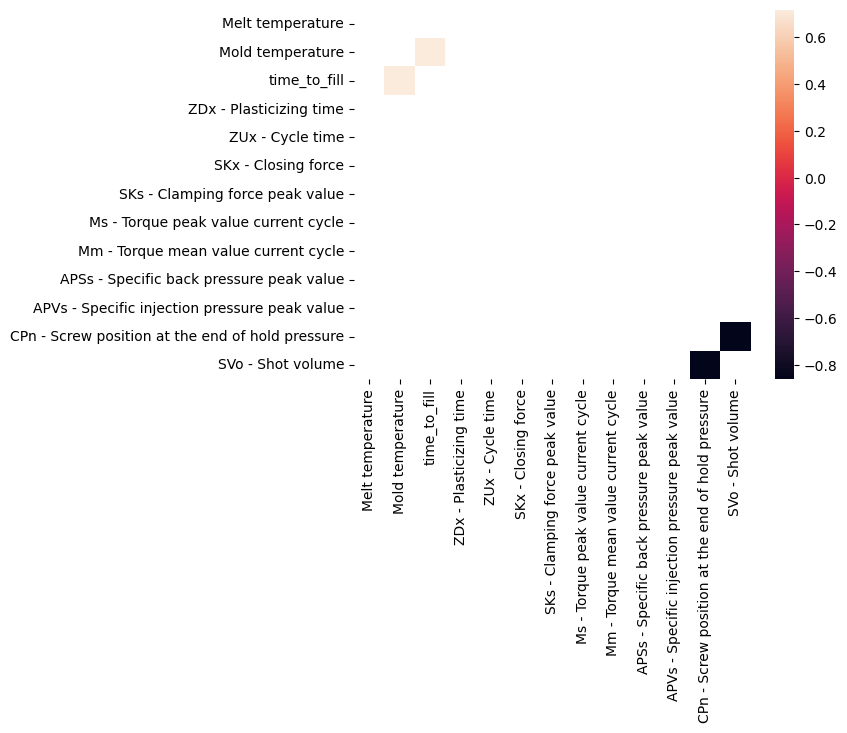

In [33]:
sns.heatmap(strong_correlations_X)

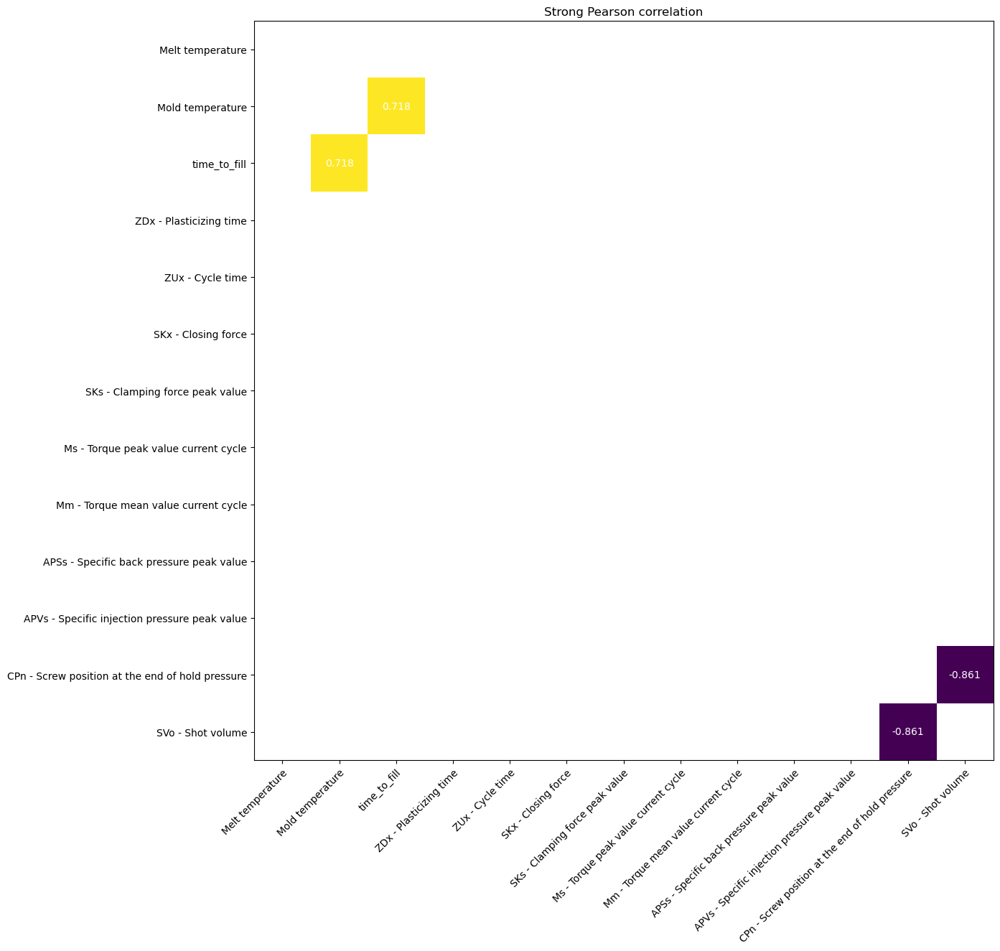

In [34]:
fig, ax = plt.subplots(figsize=(14,14))
im = ax.imshow(strong_correlations_X)
# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(X_corr.columns)), labels=X_corr.columns)
ax.set_yticks(np.arange(len(X_corr.columns)), labels=X_corr.columns)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(strong_correlations_X.columns)):
    for j in range(len(strong_correlations_X.columns)):
        text = ax.text(j, i, strong_correlations_X.values[i, j],
                       ha="center", va="center", color="w")

ax.set_title("Strong Pearson correlation")
fig.tight_layout()
#fig.savefig('images/strong_correlations')
plt.show()

### All corelations

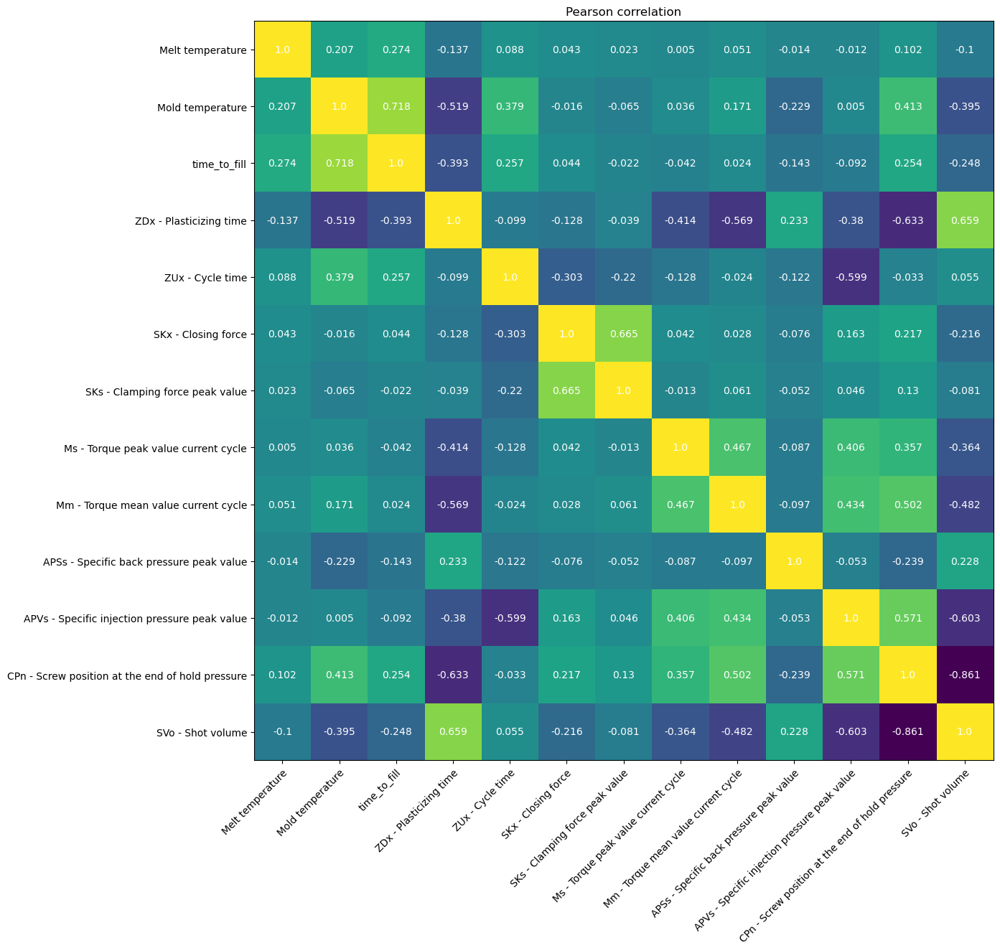

In [35]:
fig, ax = plt.subplots(figsize=(14,14))
im = ax.imshow(X_corr.values)
# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(X_corr.columns)), labels=X_corr.columns)
ax.set_yticks(np.arange(len(X_corr.columns)), labels=X_corr.columns)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(X_corr.columns)):
    for j in range(len(X_corr.columns)):
        text = ax.text(j, i, X_corr.values[i, j],
                       ha="center", va="center", color="w")

ax.set_title("Pearson correlation")
fig.tight_layout()
#fig.savefig('images/correlations')
plt.show()

In [36]:
X.columns

Index(['Melt temperature', 'Mold temperature', 'time_to_fill',
       'ZDx - Plasticizing time', 'ZUx - Cycle time', 'SKx - Closing force',
       'SKs - Clamping force peak value',
       'Ms - Torque peak value current cycle',
       'Mm - Torque mean value current cycle',
       'APSs - Specific back pressure peak value',
       'APVs - Specific injection pressure peak value',
       'CPn - Screw position at the end of hold pressure',
       'SVo - Shot volume'],
      dtype='object')

### Lets create dataset without strong correlations and useless features according by RF

In [37]:
X_train_no_str_corr = X_train.copy()
X_test_no_str_corr = X_test.copy()
X_train_no_str_corr = X_train_no_str_corr.drop(['SVo - Shot volume',
                                    'Mold temperature'],axis=1)
X_test_no_str_corr = X_test_no_str_corr.drop(['SVo - Shot volume',
                                    'Mold temperature'],axis=1)

In [38]:
X_train_no_not_important = X_train.copy()
X_test_no_not_important = X_test.copy()
X_train_no_not_important = X_train_no_not_important.drop(['Ms - Torque peak value current cycle', 
                                    'APSs - Specific back pressure peak value'],axis=1)
X_test_no_not_important = X_test_no_not_important.drop(['Ms - Torque peak value current cycle', 
                                    'APSs - Specific back pressure peak value'],axis=1)

In [39]:
X_train_clean = X_train.copy()
X_train_clean = X_train_clean.drop(['SVo - Shot volume',
                                    'Mold temperature',
                                    'Ms - Torque peak value current cycle', 
                                    'APSs - Specific back pressure peak value'],axis=1)
X_test_clean = X_test.copy()
X_test_clean = X_test_clean.drop(['SVo - Shot volume',
                                    'Mold temperature',
                                    'Ms - Torque peak value current cycle', 
                                    'APSs - Specific back pressure peak value'],axis=1)

In [40]:
from sklearn.feature_selection import VarianceThreshold
v_threshold = VarianceThreshold(threshold=(.8 * (1 - .8)))
v_threshold.fit(X)
v_threshold.get_support()

array([ True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True, False, False])

In [41]:
#X = X.drop(['CPn - Screw position at the end of hold pressure','ZDx - Plasticizing time'],axis=1)
#X_train = X_train.drop(['CPn - Screw position at the end of hold pressure','ZDx - Plasticizing time'],axis=1)
#X_test = X_test.drop(['CPn - Screw position at the end of hold pressure','ZDx - Plasticizing time'],axis=1)

### Normalization Using sklearn

In [42]:
norm = MinMaxScaler().fit(X_train)
X_train_norm = norm.transform(X_train)
X_test_norm = norm.transform(X_test)

norm = MinMaxScaler().fit(X_train_no_str_corr)
X_train_no_str_corr_norm = norm.transform(X_train_no_str_corr)
X_test_no_str_corr_norm = norm.transform(X_test_no_str_corr)

norm = MinMaxScaler().fit(X_train_no_not_important)
X_train_no_not_important_norm = norm.transform(X_train_no_not_important)
X_test_no_not_important_norm = norm.transform(X_test_no_not_important)

norm = MinMaxScaler().fit(X_train_clean)
X_train_clean_norm = norm.transform(X_train_clean)
X_test_clean_norm = norm.transform(X_test_clean)

In [43]:
X_train_norm = pd.DataFrame(X_train_norm, columns=list(X_train.columns[:]))
X_test_norm = pd.DataFrame(X_test_norm, columns=list(X_test.columns[:]))

X_train_no_str_corr_norm = pd.DataFrame(X_train_no_str_corr_norm, columns=list(X_train_no_str_corr.columns[:]))
X_test_no_str_corr_norm = pd.DataFrame(X_test_no_str_corr_norm, columns=list(X_test_no_str_corr.columns[:]))

X_train_no_not_important_norm = pd.DataFrame(X_train_no_not_important_norm, columns=list(X_train_no_not_important.columns[:]))
X_test_no_not_important_norm = pd.DataFrame(X_test_no_not_important_norm, columns=list(X_test_no_not_important.columns[:]))

X_train_clean_norm = pd.DataFrame(X_train_clean_norm, columns=list(X_train_clean.columns[:]))
X_test_clean_norm = pd.DataFrame(X_test_clean_norm, columns=list(X_test_clean.columns[:]))

In [44]:
X_train_norm.head()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume
0,0.332264,0.953600,0.979798,0.036649,0.83,0.458256,0.468085,0.678670,0.718750,0.254902,0.651692,0.753425,0.236111
1,0.334543,0.777067,0.171717,0.117801,0.02,0.667904,0.624758,0.795014,0.716146,0.235294,0.875077,0.630137,0.375000
2,0.335157,0.796800,0.171717,0.130890,0.02,0.567718,0.588008,0.570637,0.700521,0.352941,0.787692,0.657534,0.347222
3,0.333970,0.786933,0.171717,0.125654,0.03,0.684601,0.663443,0.520776,0.692708,0.156863,0.783385,0.698630,0.305556
4,0.329699,0.758400,0.040404,0.130890,0.94,0.243043,0.388781,0.562327,0.755208,0.254902,0.726154,0.616438,0.375000


### Standardization Using sklearn

In [45]:
X_train_stand = X_train.copy()
X_test_stand = X_test.copy()

# numerical features
num_cols = list(X_train.columns[:])

# apply standardization on numerical features
for i in num_cols:
    scale = StandardScaler().fit(X_train_stand[[i]])
    X_train_stand[i] = scale.transform(X_train_stand[[i]])
    X_test_stand[i] = scale.transform(X_test_stand[[i]])

In [46]:
X_train_clean_stand = X_train_clean.copy()
X_test_clean_stand = X_test_clean.copy()

# numerical features
num_cols = list(X_train_clean.columns[:])

# apply standardization on numerical features
for i in num_cols:
    scale = StandardScaler().fit(X_train_clean_stand[[i]])
    X_train_clean_stand[i] = scale.transform(X_train_clean_stand[[i]])
    X_test_clean_stand[i] = scale.transform(X_test_clean_stand[[i]])

In [47]:
X_train_no_str_corr_stand = X_train_no_str_corr.copy()
X_test_no_str_corr_stand = X_test_no_str_corr.copy()

# numerical features
num_cols = list(X_train_no_str_corr.columns[:])

# apply standardization on numerical features
for i in num_cols:
    scale = StandardScaler().fit(X_train_no_str_corr_stand[[i]])
    X_train_no_str_corr_stand[i] = scale.transform(X_train_no_str_corr_stand[[i]])
    X_test_no_str_corr_stand[i] = scale.transform(X_test_no_str_corr_stand[[i]])

In [48]:
X_train_no_not_important_stand = X_train_no_not_important.copy()
X_test_no_not_important_stand = X_test_no_not_important.copy()

# numerical features
num_cols = list(X_train_no_not_important.columns[:])

# apply standardization on numerical features
for i in num_cols:
    scale = StandardScaler().fit(X_train_no_not_important_stand[[i]])
    X_train_no_not_important_stand[i] = scale.transform(X_train_no_not_important_stand[[i]])
    X_test_no_not_important_stand[i] = scale.transform(X_test_no_not_important_stand[[i]])

In [49]:
X_train_stand.head()

,Melt temperature,Mold temperature,time_to_fill,ZDx - Plasticizing time,ZUx - Cycle time,SKx - Closing force,SKs - Clamping force peak value,Ms - Torque peak value current cycle,Mm - Torque mean value current cycle,APSs - Specific back pressure peak value,APVs - Specific injection pressure peak value,CPn - Screw position at the end of hold pressure,SVo - Shot volume
0,-0.146125,1.553125,2.190307,-0.907218,0.917477,-0.036210,-0.034587,0.399312,-0.009517,-0.135781,-0.542520,0.726294,-0.784103
1,-0.117783,-0.012901,-0.283773,0.020429,-0.954128,0.976905,0.714522,1.233158,-0.030458,-0.262191,0.862160,-0.188033,0.246326
2,-0.110146,0.162154,-0.283773,0.170049,-0.954128,0.492761,0.538805,-0.374974,-0.156107,0.496266,0.312670,0.015151,0.040240
3,-0.124911,0.074626,-0.283773,0.110201,-0.931022,1.057595,0.899487,-0.732337,-0.218931,-0.767829,0.285583,0.319927,-0.268889
4,-0.178031,-0.178493,-0.685811,0.170049,1.171646,-1.076220,-0.413766,-0.434535,0.283663,-0.135781,-0.074294,-0.289624,0.246326


In [50]:
datasets = {
    'Standardized data' : [X_train_stand, X_test_stand],
    'Normalized data' : [X_train_norm, X_test_norm],
    'Standardized Data without strong correlations' : [X_train_no_str_corr_stand, X_test_no_str_corr_stand],
    'Normalized Data without strong correlations' : [X_train_no_str_corr_norm, X_test_no_str_corr_norm],
    'Standardized Data without not important features' : [X_train_no_not_important_stand, X_test_no_not_important_stand],
    'Normalized Data without not important features' : [X_train_no_not_important_norm, X_test_no_not_important_norm],
    'Fully Clean Standardized data' : [X_train_clean_stand, X_test_clean_stand],
    'Fully Clean Normalized data' : [X_train_clean_norm, X_test_clean_norm]
}

## Lets compare Unscaled, Normalized and Standartized data

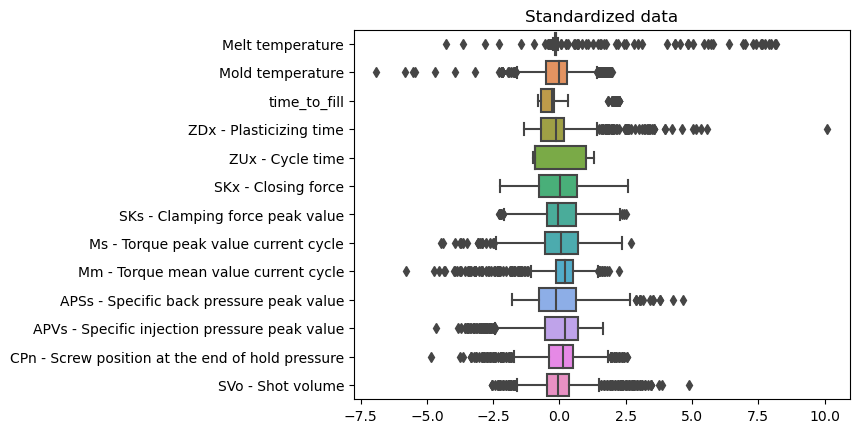

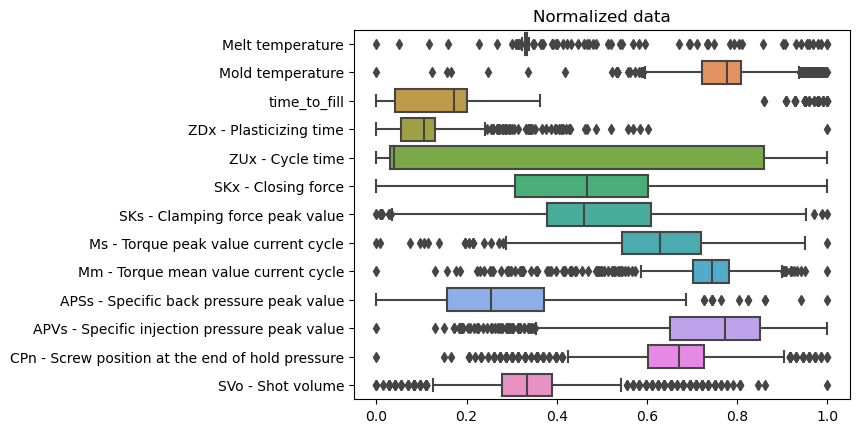

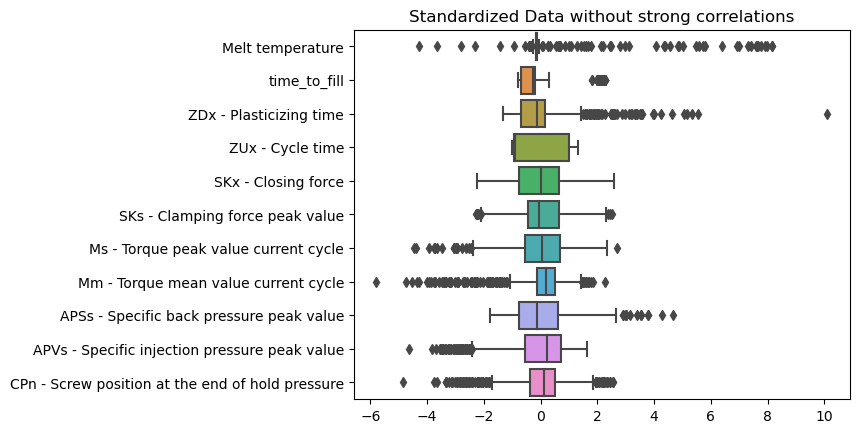

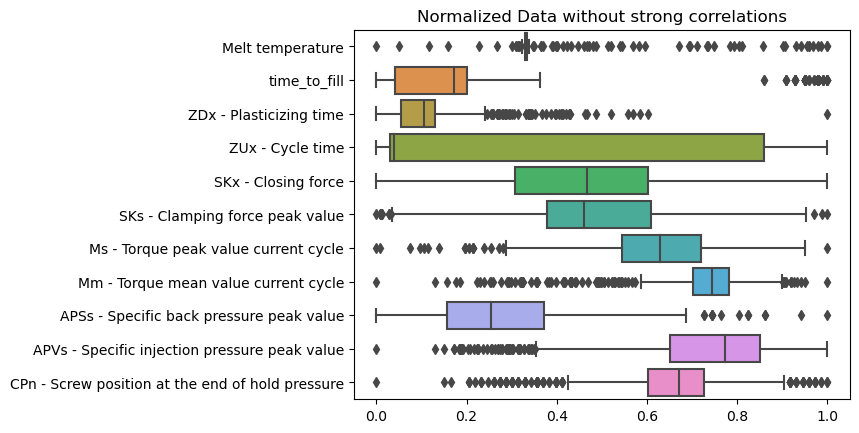

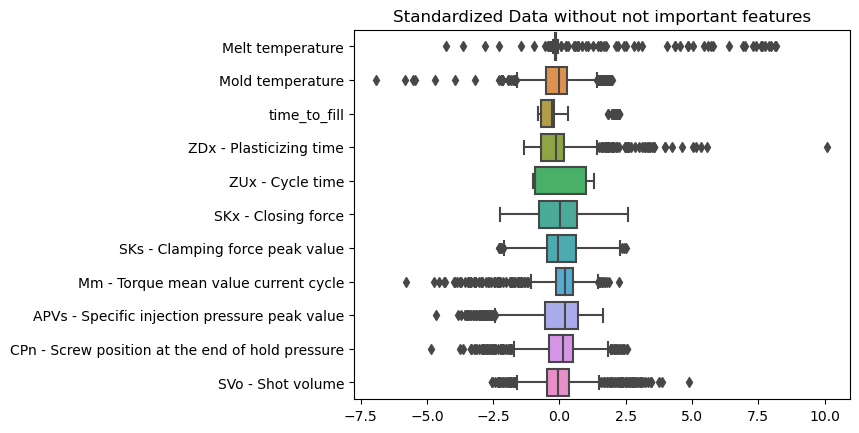

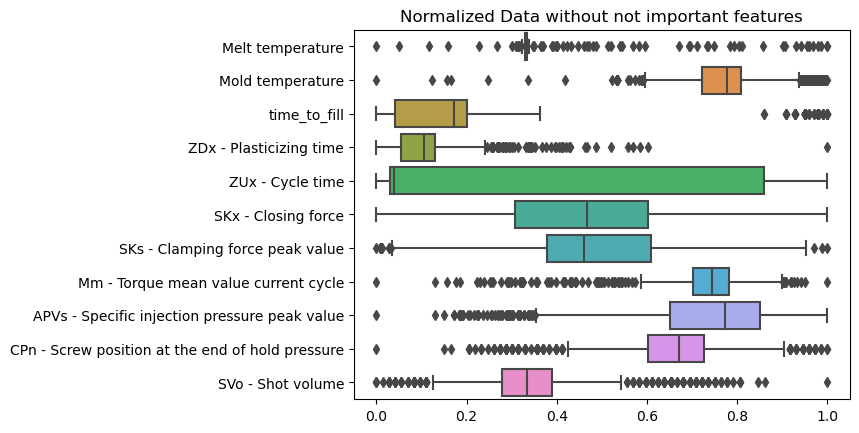

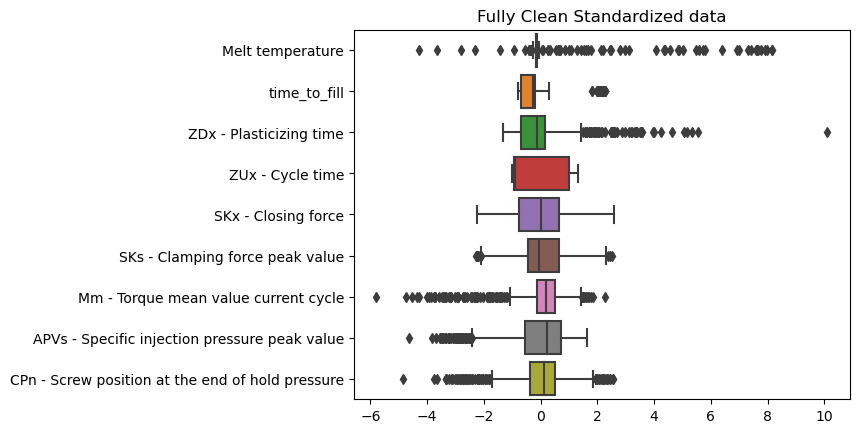

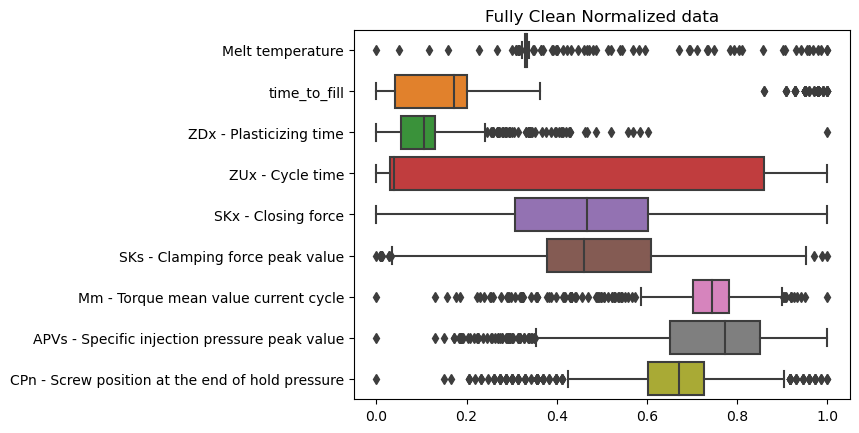

In [51]:
for key, values in datasets.items():
    box_pl = sns.boxplot(data=values[0], orient='h')
    box_pl.set_title(key)
    name = str(key) + ".png"
    #box_pl.figure.savefig(name)
    plt.show()

# Is regression models applicable?

## Linear regression

In [52]:
# Hyper parameter tuning:
# - model: model for which we want to tune parameters
# - params: dictionary for parameters which we want to tune
# - x: train features set
# - y: train target set
# return the list of best parameters
def hyper_param_tuning(model, params, x,y):
    #cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=1)
    clf = GridSearchCV(model, param_grid = params, cv = 5, verbose=True, n_jobs=-1)
    clf.fit(x, y)
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    params = clf.cv_results_['params']
    print("Best: %f using %s" % (clf.best_score_, clf.best_params_))
    # for mean, stdev, param in zip(means, stds, params):
    #     print("%f (%f) with: %r" % (mean, stdev, param))
    return clf.best_params_, clf.best_estimator_

def plot_confusion_matrix(y_test, y_pred):
    cm = confusion_matrix(y_test , y_pred)
    cm_df = pd.DataFrame(cm,
                     index = ['Waste','Acceptable','Target','Inefficient'], 
                     columns = ['Waste','Acceptable','Target','Inefficient'])
    plt.figure(figsize=(5,4))
    sns.heatmap(cm_df, annot=True)
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Values')
    plt.xlabel('Predicted Values')
    plt.show()

# Score of the model:
# - model: model for which we want to estimate
# - x_test: test features set
# - y_test: test target set
# return the default score of the model and classification report
def score_of_model(y_test, y_pred):
    print("Classification report: ")
    clas_rep = classification_report(y_test,y_pred)
    print(clas_rep)
    print("Accuracy score: ")
    accuracy = accuracy_score(y_test,np.around( y_pred))
    print(accuracy)
    print("Confusion Matrix: ")
    plot_confusion_matrix(y_test,y_pred)
    return accuracy, clas_rep

In [53]:
# lets create array for comparing results of models
result = np.array([])

Standardized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291

Accuracy score: 
0.8487972508591065
Confusion Matrix: 


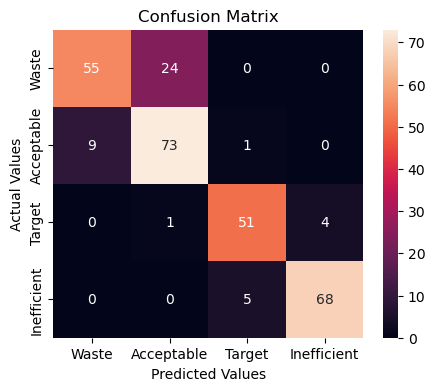

----------------------------------
Normalized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291

Accuracy score: 
0.8487972508591065
Confusion Matrix: 


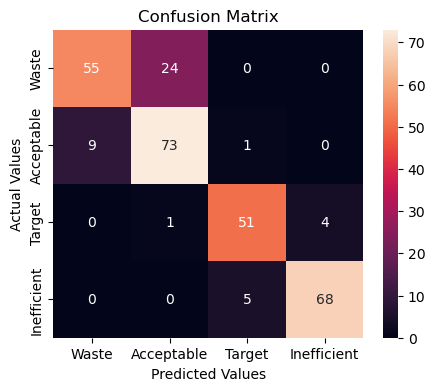

----------------------------------
Standardized Data without strong correlations
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.63      0.73        79
         2.0       0.71      0.89      0.79        83
         3.0       0.91      0.91      0.91        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.84       291
   macro avg       0.86      0.85      0.84       291
weighted avg       0.85      0.84      0.84       291

Accuracy score: 
0.8384879725085911
Confusion Matrix: 


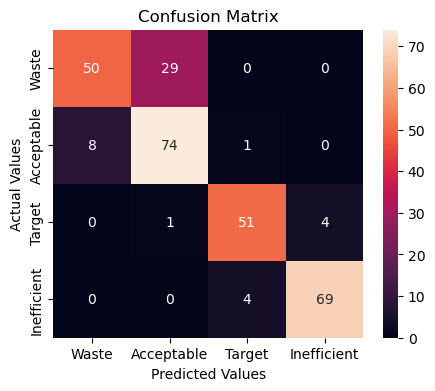

----------------------------------
Normalized Data without strong correlations
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.63      0.73        79
         2.0       0.71      0.89      0.79        83
         3.0       0.91      0.91      0.91        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.84       291
   macro avg       0.86      0.85      0.84       291
weighted avg       0.85      0.84      0.84       291

Accuracy score: 
0.8384879725085911
Confusion Matrix: 


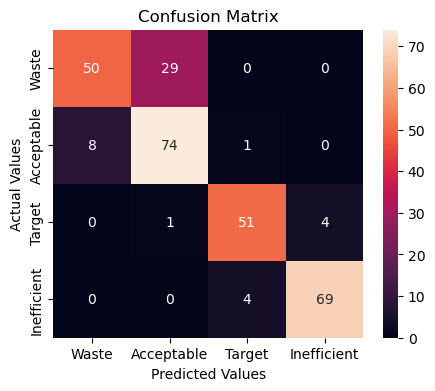

----------------------------------
Standardized Data without not important features
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.73      0.80        79
         2.0       0.77      0.89      0.83        83
         3.0       0.91      0.93      0.92        56
         4.0       0.96      0.95      0.95        73

    accuracy                           0.87       291
   macro avg       0.88      0.87      0.87       291
weighted avg       0.87      0.87      0.87       291

Accuracy score: 
0.8694158075601375
Confusion Matrix: 


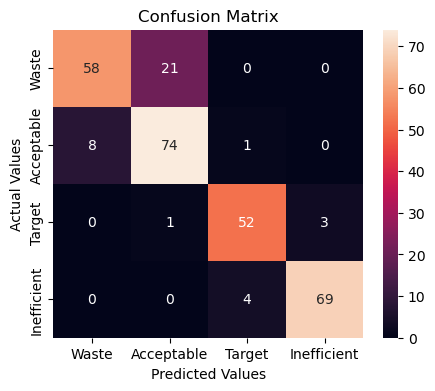

----------------------------------
Normalized Data without not important features
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.73      0.80        79
         2.0       0.77      0.89      0.83        83
         3.0       0.91      0.93      0.92        56
         4.0       0.96      0.95      0.95        73

    accuracy                           0.87       291
   macro avg       0.88      0.87      0.87       291
weighted avg       0.87      0.87      0.87       291

Accuracy score: 
0.8694158075601375
Confusion Matrix: 


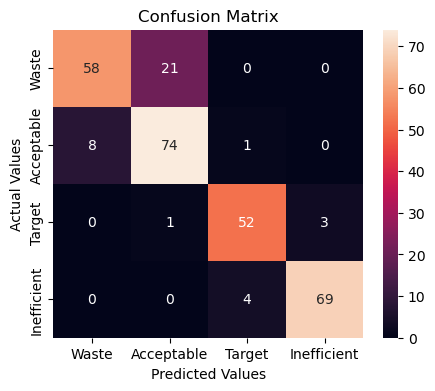

----------------------------------
Fully Clean Standardized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.67      0.76        79
         2.0       0.74      0.90      0.81        83
         3.0       0.91      0.93      0.92        56
         4.0       0.96      0.95      0.95        73

    accuracy                           0.86       291
   macro avg       0.87      0.86      0.86       291
weighted avg       0.87      0.86      0.85       291

Accuracy score: 
0.8556701030927835
Confusion Matrix: 


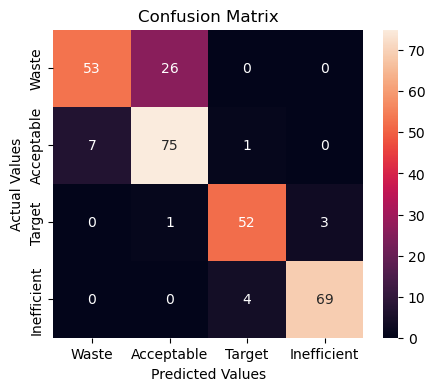

----------------------------------
Fully Clean Normalized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.67      0.76        79
         2.0       0.74      0.90      0.81        83
         3.0       0.91      0.93      0.92        56
         4.0       0.96      0.95      0.95        73

    accuracy                           0.86       291
   macro avg       0.87      0.86      0.86       291
weighted avg       0.87      0.86      0.85       291

Accuracy score: 
0.8556701030927835
Confusion Matrix: 


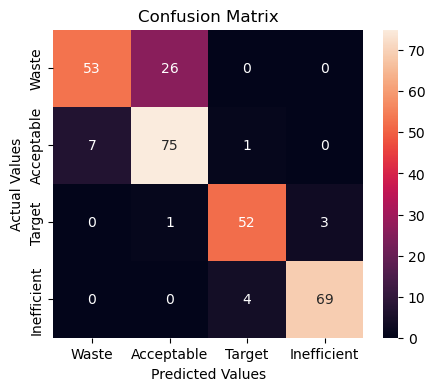

----------------------------------


In [54]:
for key, X_data in datasets.items():
    print(key)
    linear_reg = LinearRegression().fit(X_data[0],y_train)
    y_pred = np.around(linear_reg.predict(X_data[1]))
    score, _ = score_of_model(y_pred=y_pred, y_test=y_test)
    result = np.append(result, [str(linear_reg.__class__.__name__), str(key), score])
    print("----------------------------------")

## Polynomial Regression

In [55]:
def poly_reg_model(degree, X_train, y_train, X_test):
    poly = PolynomialFeatures(degree=degree, include_bias=False)
    poly_features = poly.fit_transform(np.array(X_train))
    poly_features_test = poly.fit_transform(np.array(X_test))
    poly_reg_model = LinearRegression().fit(poly_features, y_train)
    return pd.DataFrame(np.around(poly_reg_model.predict(poly_features_test))).apply(lambda x: [1 if y <= 1 else y for y in x]).apply(lambda x: [4 if y >= 4 else y for y in x]), poly_reg_model
    

Degree 2.000000
Standardized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.93      0.78      0.85        79
         2.0       0.83      0.92      0.87        83
         3.0       0.90      0.93      0.91        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.89       291
   macro avg       0.90      0.90      0.90       291
weighted avg       0.90      0.89      0.89       291

Accuracy score: 
0.8934707903780069
Confusion Matrix: 


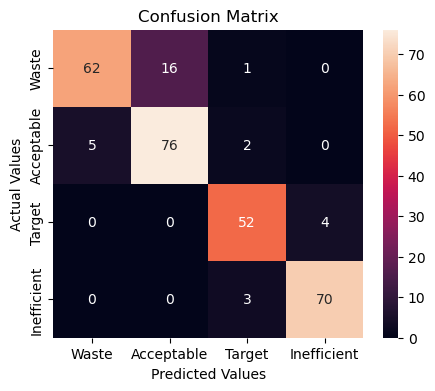

---------------------------
Normalized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.93      0.78      0.85        79
         2.0       0.83      0.92      0.87        83
         3.0       0.90      0.93      0.91        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.89       291
   macro avg       0.90      0.90      0.90       291
weighted avg       0.90      0.89      0.89       291

Accuracy score: 
0.8934707903780069
Confusion Matrix: 


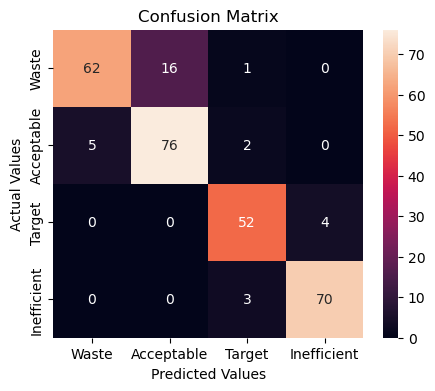

---------------------------
Standardized Data without strong correlations
Classification report: 
              precision    recall  f1-score   support

         1.0       0.92      0.77      0.84        79
         2.0       0.82      0.93      0.87        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.90       291
   macro avg       0.90      0.90      0.90       291
weighted avg       0.90      0.90      0.90       291

Accuracy score: 
0.8969072164948454
Confusion Matrix: 


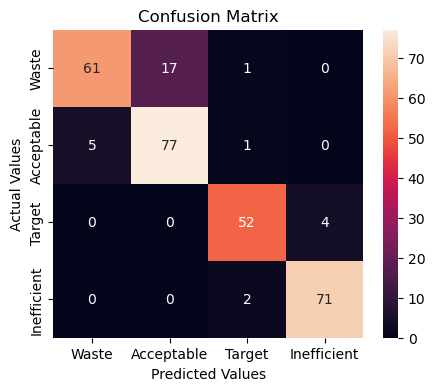

---------------------------
Normalized Data without strong correlations
Classification report: 
              precision    recall  f1-score   support

         1.0       0.92      0.77      0.84        79
         2.0       0.82      0.93      0.87        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.90       291
   macro avg       0.90      0.90      0.90       291
weighted avg       0.90      0.90      0.90       291

Accuracy score: 
0.8969072164948454
Confusion Matrix: 


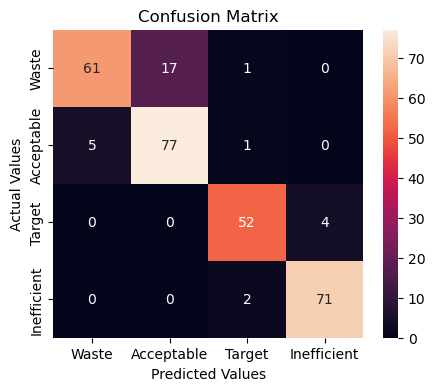

---------------------------
Standardized Data without not important features
Classification report: 
              precision    recall  f1-score   support

         1.0       0.94      0.77      0.85        79
         2.0       0.82      0.94      0.88        83
         3.0       0.91      0.89      0.90        56
         4.0       0.92      0.96      0.94        73

    accuracy                           0.89       291
   macro avg       0.90      0.89      0.89       291
weighted avg       0.89      0.89      0.89       291

Accuracy score: 
0.8900343642611683
Confusion Matrix: 


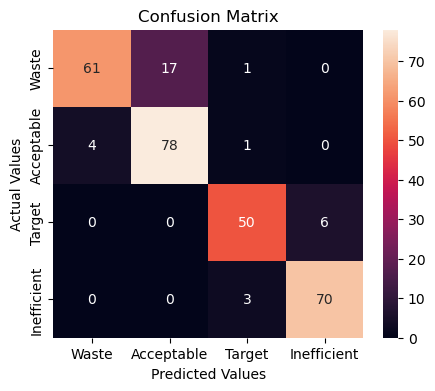

---------------------------
Normalized Data without not important features
Classification report: 
              precision    recall  f1-score   support

         1.0       0.94      0.77      0.85        79
         2.0       0.82      0.94      0.88        83
         3.0       0.91      0.89      0.90        56
         4.0       0.92      0.96      0.94        73

    accuracy                           0.89       291
   macro avg       0.90      0.89      0.89       291
weighted avg       0.89      0.89      0.89       291

Accuracy score: 
0.8900343642611683
Confusion Matrix: 


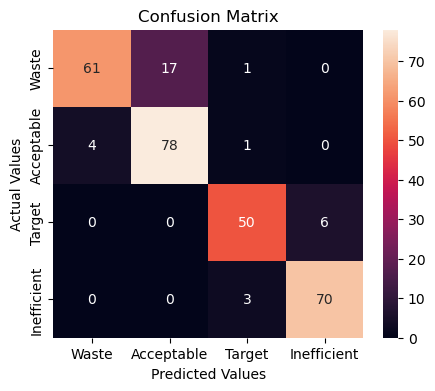

---------------------------
Fully Clean Standardized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.92      0.72      0.81        79
         2.0       0.79      0.93      0.85        83
         3.0       0.91      0.91      0.91        56
         4.0       0.93      0.96      0.95        73

    accuracy                           0.88       291
   macro avg       0.89      0.88      0.88       291
weighted avg       0.88      0.88      0.87       291

Accuracy score: 
0.8762886597938144
Confusion Matrix: 


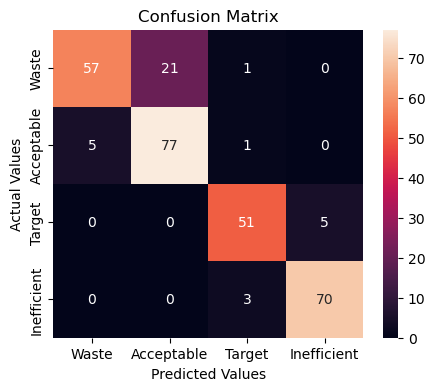

---------------------------
Fully Clean Normalized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.92      0.72      0.81        79
         2.0       0.79      0.93      0.85        83
         3.0       0.91      0.91      0.91        56
         4.0       0.93      0.96      0.95        73

    accuracy                           0.88       291
   macro avg       0.89      0.88      0.88       291
weighted avg       0.88      0.88      0.87       291

Accuracy score: 
0.8762886597938144
Confusion Matrix: 


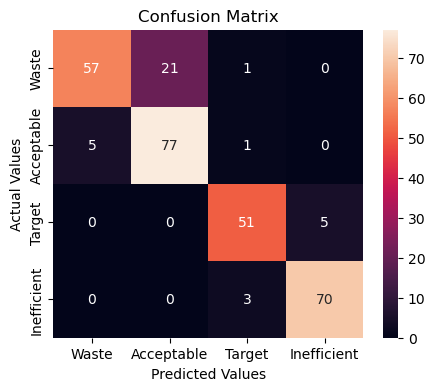

---------------------------
#####################################################
Degree 3.000000
Standardized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.87      0.66      0.75        79
         2.0       0.82      0.90      0.86        83
         3.0       0.75      0.86      0.80        56
         4.0       0.83      0.85      0.84        73

    accuracy                           0.81       291
   macro avg       0.81      0.82      0.81       291
weighted avg       0.82      0.81      0.81       291

Accuracy score: 
0.8144329896907216
Confusion Matrix: 


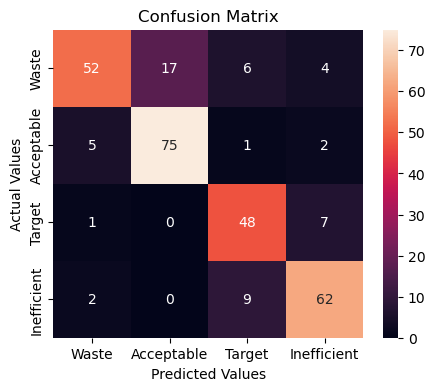

---------------------------
Normalized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.87      0.66      0.75        79
         2.0       0.82      0.90      0.86        83
         3.0       0.75      0.86      0.80        56
         4.0       0.83      0.85      0.84        73

    accuracy                           0.81       291
   macro avg       0.81      0.82      0.81       291
weighted avg       0.82      0.81      0.81       291

Accuracy score: 
0.8144329896907216
Confusion Matrix: 


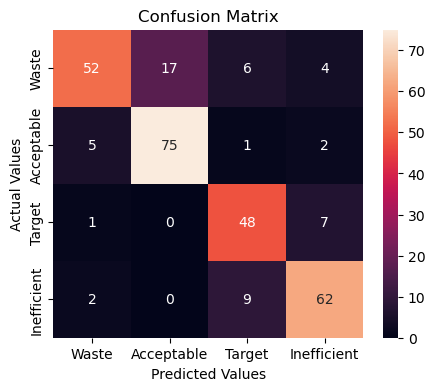

---------------------------
Standardized Data without strong correlations
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.75      0.80        79
         2.0       0.78      0.88      0.82        83
         3.0       0.86      0.86      0.86        56
         4.0       0.90      0.89      0.90        73

    accuracy                           0.84       291
   macro avg       0.85      0.84      0.84       291
weighted avg       0.85      0.84      0.84       291

Accuracy score: 
0.8419243986254296
Confusion Matrix: 


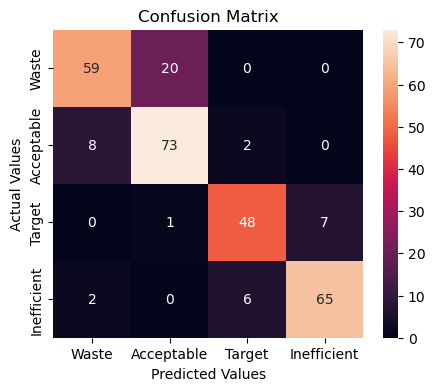

---------------------------
Normalized Data without strong correlations
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.75      0.80        79
         2.0       0.78      0.88      0.82        83
         3.0       0.86      0.86      0.86        56
         4.0       0.90      0.89      0.90        73

    accuracy                           0.84       291
   macro avg       0.85      0.84      0.84       291
weighted avg       0.85      0.84      0.84       291

Accuracy score: 
0.8419243986254296
Confusion Matrix: 


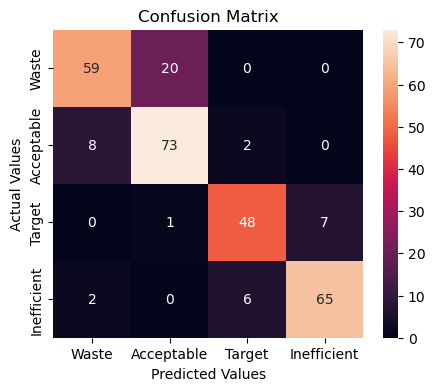

---------------------------
Standardized Data without not important features
Classification report: 
              precision    recall  f1-score   support

         1.0       0.91      0.78      0.84        79
         2.0       0.83      0.92      0.87        83
         3.0       0.91      0.89      0.90        56
         4.0       0.91      0.95      0.93        73

    accuracy                           0.88       291
   macro avg       0.89      0.88      0.88       291
weighted avg       0.89      0.88      0.88       291

Accuracy score: 
0.8831615120274914
Confusion Matrix: 


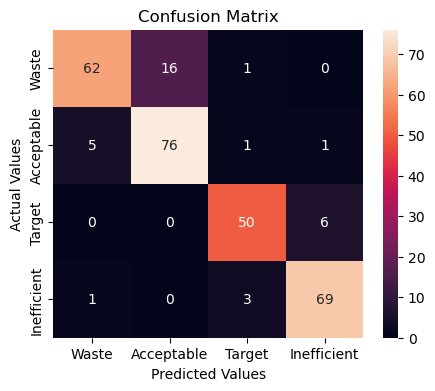

---------------------------
Normalized Data without not important features
Classification report: 
              precision    recall  f1-score   support

         1.0       0.91      0.78      0.84        79
         2.0       0.83      0.92      0.87        83
         3.0       0.91      0.89      0.90        56
         4.0       0.91      0.95      0.93        73

    accuracy                           0.88       291
   macro avg       0.89      0.88      0.88       291
weighted avg       0.89      0.88      0.88       291

Accuracy score: 
0.8831615120274914
Confusion Matrix: 


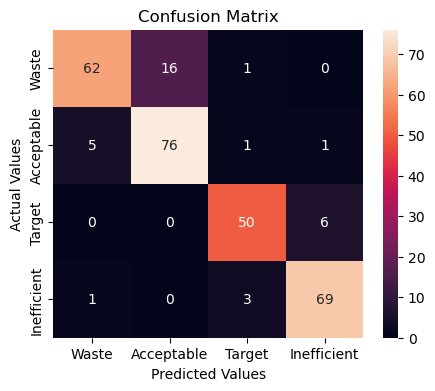

---------------------------
Fully Clean Standardized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.92      0.85      0.88        79
         2.0       0.87      0.93      0.90        83
         3.0       0.89      0.89      0.89        56
         4.0       0.92      0.92      0.92        73

    accuracy                           0.90       291
   macro avg       0.90      0.90      0.90       291
weighted avg       0.90      0.90      0.90       291

Accuracy score: 
0.8969072164948454
Confusion Matrix: 


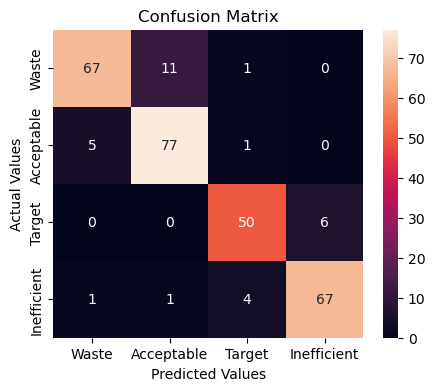

---------------------------
Fully Clean Normalized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.92      0.85      0.88        79
         2.0       0.87      0.93      0.90        83
         3.0       0.89      0.89      0.89        56
         4.0       0.92      0.92      0.92        73

    accuracy                           0.90       291
   macro avg       0.90      0.90      0.90       291
weighted avg       0.90      0.90      0.90       291

Accuracy score: 
0.8969072164948454
Confusion Matrix: 


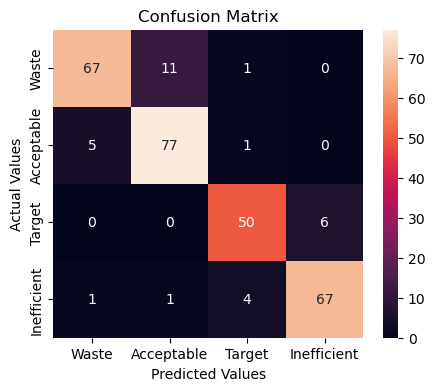

---------------------------
#####################################################


In [56]:
for i in range(2,4):
    print("Degree %f" % i)
    for key, X_data in datasets.items():
        print(key)
        y_pred, model = poly_reg_model(i, X_data[0], y_train, X_data[1])
        score, _ = score_of_model(y_pred=y_pred, y_test=y_test)
        result = np.append(result, [str(model.__class__.__name__), str(key), score])
        print("---------------------------")
    print("#####################################################")


## Ridge Regression

In [57]:
def ridge_regression(X_train, y_train, X_test):
    ridge_model = Ridge(alpha=1.0)
    ridge_model.fit(X_train, y_train)
    ridge_model_pred = np.around(ridge_model.predict(X_test))
    return ridge_model_pred, ridge_model

Standardized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291

Accuracy score: 
0.8487972508591065
Confusion Matrix: 


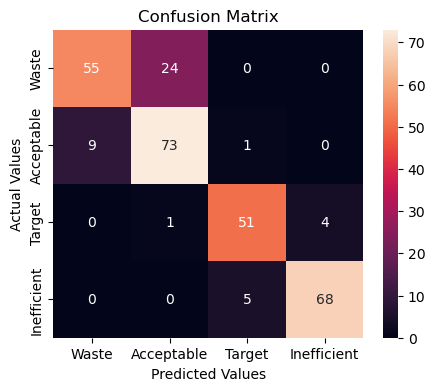

--------------------
Normalized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.87      0.70      0.77        79
         2.0       0.75      0.89      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.86      0.86       291
weighted avg       0.86      0.85      0.85       291

Accuracy score: 
0.852233676975945
Confusion Matrix: 


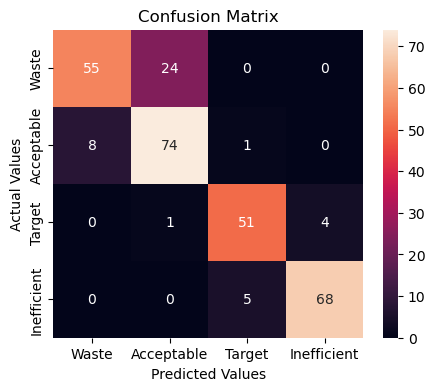

--------------------
Standardized Data without strong correlations
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.63      0.73        79
         2.0       0.71      0.89      0.79        83
         3.0       0.91      0.91      0.91        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.84       291
   macro avg       0.86      0.85      0.84       291
weighted avg       0.85      0.84      0.84       291

Accuracy score: 
0.8384879725085911
Confusion Matrix: 


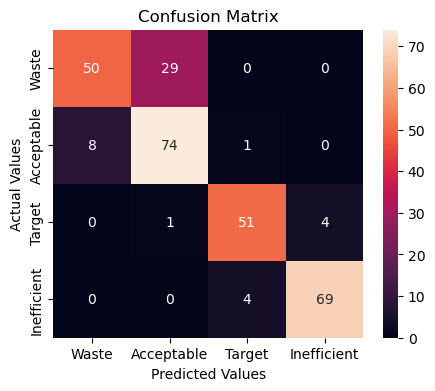

--------------------
Normalized Data without strong correlations
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.63      0.74        79
         2.0       0.71      0.90      0.80        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.84       291
   macro avg       0.86      0.84      0.84       291
weighted avg       0.85      0.84      0.84       291

Accuracy score: 
0.8384879725085911
Confusion Matrix: 


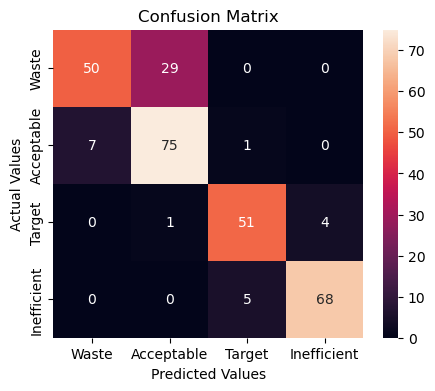

--------------------
Standardized Data without not important features
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.73      0.80        79
         2.0       0.77      0.89      0.83        83
         3.0       0.91      0.93      0.92        56
         4.0       0.96      0.95      0.95        73

    accuracy                           0.87       291
   macro avg       0.88      0.87      0.87       291
weighted avg       0.87      0.87      0.87       291

Accuracy score: 
0.8694158075601375
Confusion Matrix: 


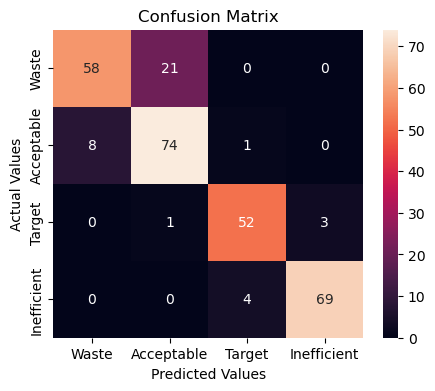

--------------------
Normalized Data without not important features
Classification report: 
              precision    recall  f1-score   support

         1.0       0.89      0.71      0.79        79
         2.0       0.76      0.90      0.82        83
         3.0       0.88      0.93      0.90        56
         4.0       0.96      0.92      0.94        73

    accuracy                           0.86       291
   macro avg       0.87      0.86      0.86       291
weighted avg       0.87      0.86      0.86       291

Accuracy score: 
0.8591065292096219
Confusion Matrix: 


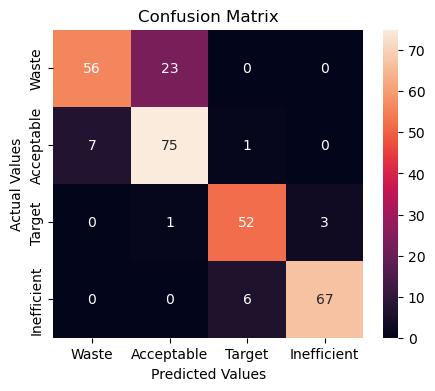

--------------------
Fully Clean Standardized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.67      0.76        79
         2.0       0.74      0.90      0.81        83
         3.0       0.91      0.93      0.92        56
         4.0       0.96      0.95      0.95        73

    accuracy                           0.86       291
   macro avg       0.87      0.86      0.86       291
weighted avg       0.87      0.86      0.85       291

Accuracy score: 
0.8556701030927835
Confusion Matrix: 


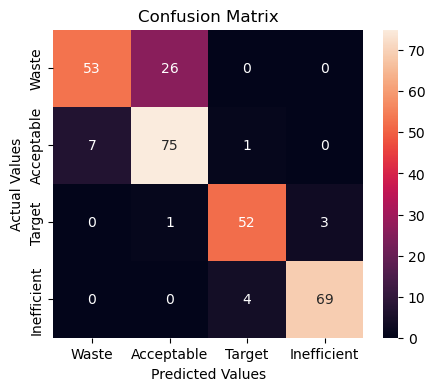

--------------------
Fully Clean Normalized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.66      0.75        79
         2.0       0.73      0.90      0.81        83
         3.0       0.88      0.93      0.90        56
         4.0       0.96      0.92      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.86      0.85      0.84       291

Accuracy score: 
0.845360824742268
Confusion Matrix: 


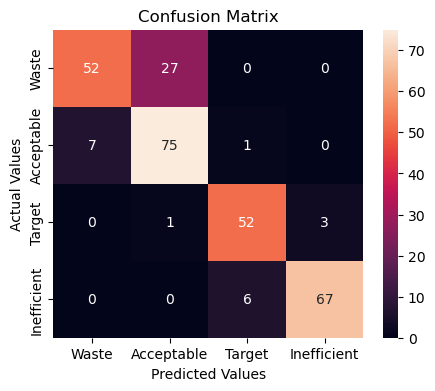

--------------------


In [58]:
for key, X_data in datasets.items():
    print(key)
    y_pred, model = ridge_regression(X_data[0], y_train, X_data[1])
    score, _ = score_of_model(y_test, y_pred)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])
    print("--------------------")

## Lasso regression

In [59]:
def lasso_regression(X_train, y_train, X_test):
    lasso_model = Lasso(alpha=0.0001)
    lasso_model.fit(X_train, y_train)
    lasso_model_pred = np.around(lasso_model.predict(X_test))
    return lasso_model_pred, lasso_model

Standardized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291

Accuracy score: 
0.8487972508591065
Confusion Matrix: 


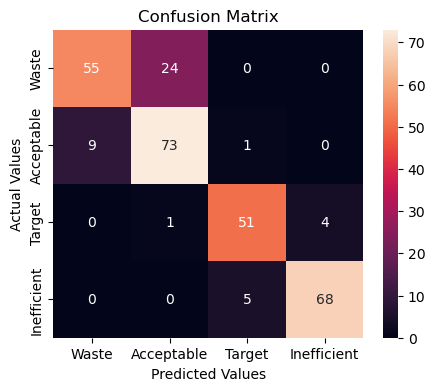

--------------------
Normalized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.70      0.77        79
         2.0       0.74      0.88      0.81        83
         3.0       0.89      0.91      0.90        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.85       291
   macro avg       0.86      0.85      0.85       291
weighted avg       0.85      0.85      0.85       291

Accuracy score: 
0.8487972508591065
Confusion Matrix: 


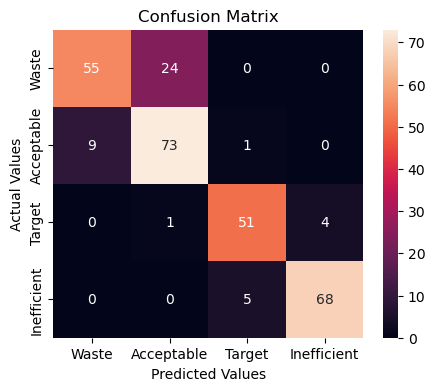

--------------------
Standardized Data without strong correlations
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.63      0.73        79
         2.0       0.71      0.89      0.79        83
         3.0       0.91      0.91      0.91        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.84       291
   macro avg       0.86      0.85      0.84       291
weighted avg       0.85      0.84      0.84       291

Accuracy score: 
0.8384879725085911
Confusion Matrix: 


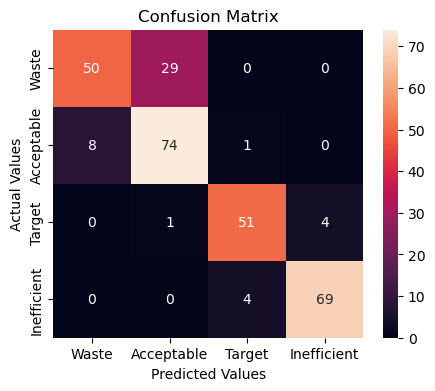

--------------------
Normalized Data without strong correlations
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.63      0.73        79
         2.0       0.71      0.89      0.79        83
         3.0       0.91      0.91      0.91        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.84       291
   macro avg       0.86      0.85      0.84       291
weighted avg       0.85      0.84      0.84       291

Accuracy score: 
0.8384879725085911
Confusion Matrix: 


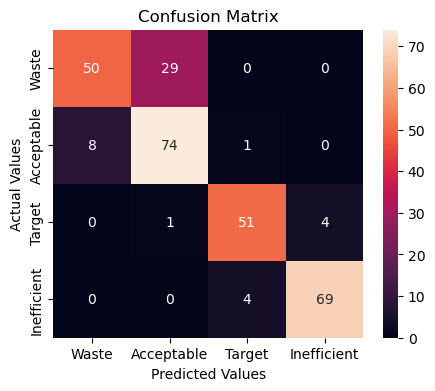

--------------------
Standardized Data without not important features
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.73      0.80        79
         2.0       0.77      0.89      0.83        83
         3.0       0.91      0.93      0.92        56
         4.0       0.96      0.95      0.95        73

    accuracy                           0.87       291
   macro avg       0.88      0.87      0.87       291
weighted avg       0.87      0.87      0.87       291

Accuracy score: 
0.8694158075601375
Confusion Matrix: 


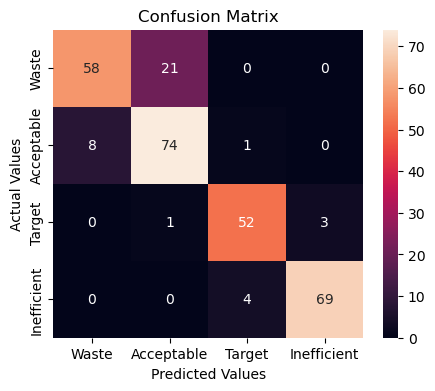

--------------------
Normalized Data without not important features
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.73      0.80        79
         2.0       0.77      0.89      0.83        83
         3.0       0.91      0.93      0.92        56
         4.0       0.96      0.95      0.95        73

    accuracy                           0.87       291
   macro avg       0.88      0.87      0.87       291
weighted avg       0.87      0.87      0.87       291

Accuracy score: 
0.8694158075601375
Confusion Matrix: 


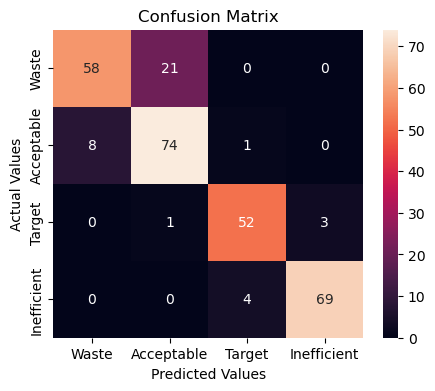

--------------------
Fully Clean Standardized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.67      0.76        79
         2.0       0.74      0.90      0.81        83
         3.0       0.91      0.93      0.92        56
         4.0       0.96      0.95      0.95        73

    accuracy                           0.86       291
   macro avg       0.87      0.86      0.86       291
weighted avg       0.87      0.86      0.85       291

Accuracy score: 
0.8556701030927835
Confusion Matrix: 


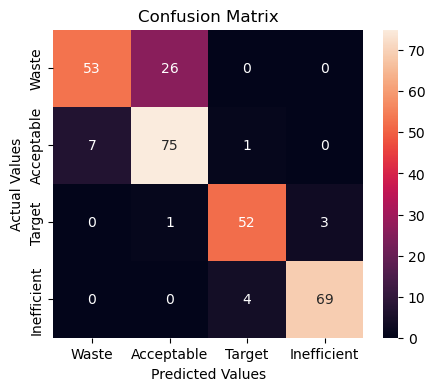

--------------------
Fully Clean Normalized data
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.67      0.76        79
         2.0       0.74      0.90      0.81        83
         3.0       0.91      0.93      0.92        56
         4.0       0.96      0.95      0.95        73

    accuracy                           0.86       291
   macro avg       0.87      0.86      0.86       291
weighted avg       0.87      0.86      0.85       291

Accuracy score: 
0.8556701030927835
Confusion Matrix: 


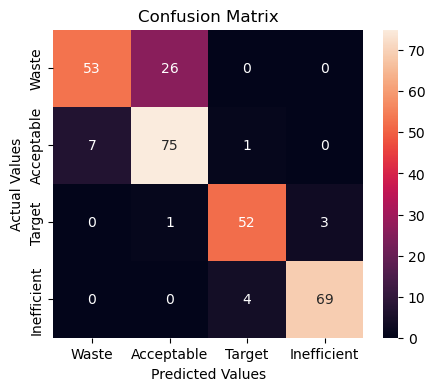

--------------------


In [60]:
for key, X_data in datasets.items():
    print(key)
    y_pred, model = lasso_regression(X_data[0], y_train, X_data[1])
    score, _ = score_of_model(y_test, y_pred)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])
    print("--------------------")

## Regression trees

In [61]:
def decision_tree_regressor(x_train, y_train):
    criterion = ['poisson', 'absolute_error','friedman_mse','squared_error']
    max_depth = [2,4,6,8,10,12]
    parameters = dict(criterion=criterion, max_depth=max_depth)
    best_params, best_model = hyper_param_tuning(DecisionTreeRegressor(), parameters, x_train, y_train)
    return best_model


Standardized data
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best: 0.935147 using {'criterion': 'poisson', 'max_depth': 6}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.89      0.92        79
         2.0       0.90      0.95      0.92        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.93       291
   macro avg       0.94      0.93      0.94       291
weighted avg       0.94      0.93      0.93       291

Accuracy score: 
0.9347079037800687
Confusion Matrix: 


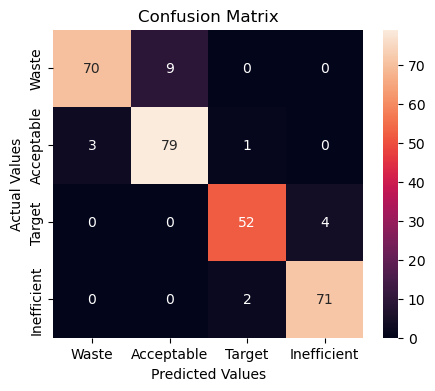

Normalized data
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best: 0.936220 using {'criterion': 'poisson', 'max_depth': 6}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.90      0.93        79
         2.0       0.90      0.95      0.92        83
         3.0       0.93      0.91      0.92        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.93       291
   macro avg       0.93      0.93      0.93       291
weighted avg       0.93      0.93      0.93       291

Accuracy score: 
0.9312714776632303
Confusion Matrix: 


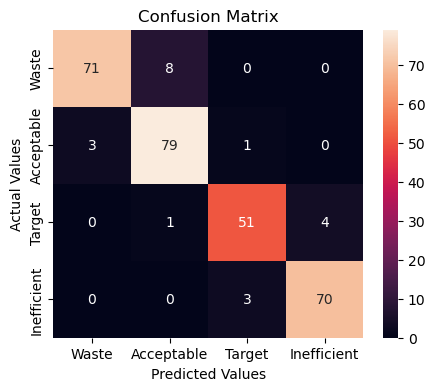

Standardized Data without strong correlations
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best: 0.933408 using {'criterion': 'poisson', 'max_depth': 6}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.90      0.93        79
         2.0       0.91      0.95      0.93        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.93       291
   macro avg       0.94      0.93      0.93       291
weighted avg       0.94      0.93      0.93       291

Accuracy score: 
0.9347079037800687
Confusion Matrix: 


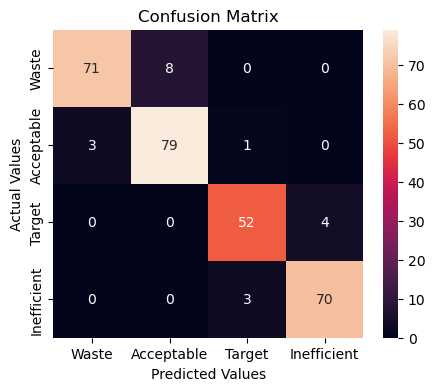

Normalized Data without strong correlations
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best: 0.933314 using {'criterion': 'poisson', 'max_depth': 6}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.89      0.92        79
         2.0       0.90      0.95      0.92        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.93       291
   macro avg       0.93      0.93      0.93       291
weighted avg       0.93      0.93      0.93       291

Accuracy score: 
0.9278350515463918
Confusion Matrix: 


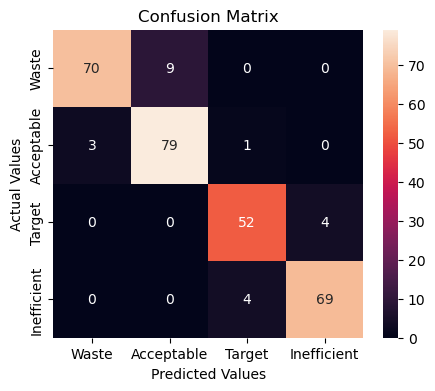

Standardized Data without not important features
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best: 0.935725 using {'criterion': 'poisson', 'max_depth': 6}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.89      0.92        79
         2.0       0.90      0.95      0.92        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.93       291
   macro avg       0.93      0.93      0.93       291
weighted avg       0.93      0.93      0.93       291

Accuracy score: 
0.9278350515463918
Confusion Matrix: 


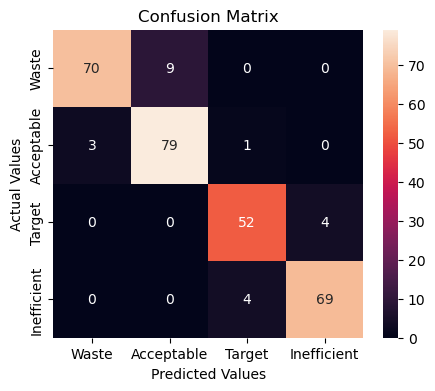

Normalized Data without not important features
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best: 0.935172 using {'criterion': 'poisson', 'max_depth': 8}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.87      0.91        79
         2.0       0.86      0.95      0.90        83
         3.0       0.89      0.88      0.88        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.91       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9106529209621993
Confusion Matrix: 


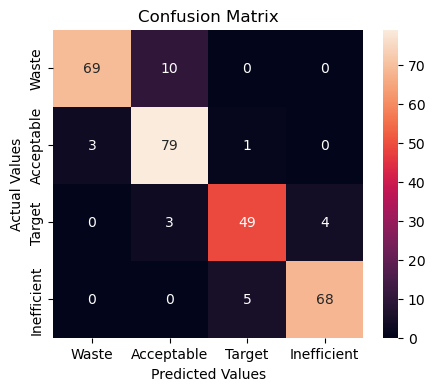

Fully Clean Standardized data
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best: 0.934684 using {'criterion': 'poisson', 'max_depth': 6}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.90      0.93        79
         2.0       0.91      0.95      0.93        83
         3.0       0.94      0.91      0.93        56
         4.0       0.93      0.97      0.95        73

    accuracy                           0.93       291
   macro avg       0.94      0.93      0.93       291
weighted avg       0.94      0.93      0.93       291

Accuracy score: 
0.9347079037800687
Confusion Matrix: 


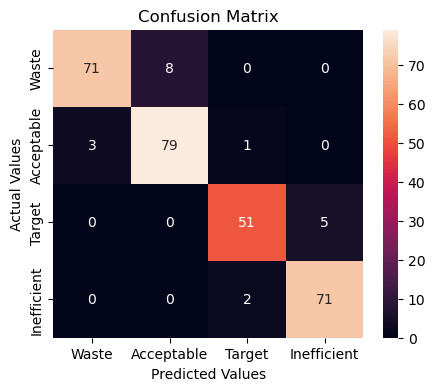

Fully Clean Normalized data
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best: 0.930495 using {'criterion': 'friedman_mse', 'max_depth': 6}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.90      0.89      0.89        79
         2.0       0.87      0.89      0.88        83
         3.0       0.92      0.88      0.90        56
         4.0       0.93      0.96      0.95        73

    accuracy                           0.90       291
   macro avg       0.91      0.90      0.90       291
weighted avg       0.90      0.90      0.90       291

Accuracy score: 
0.9037800687285223
Confusion Matrix: 


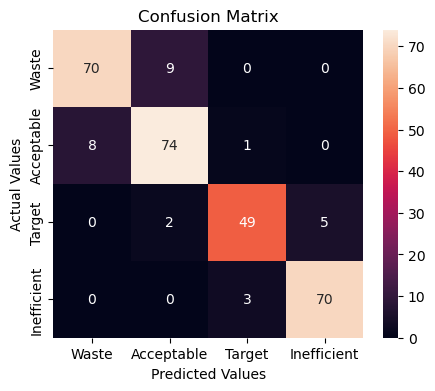

In [62]:
for key, X_data in datasets.items():
    print(key)
    dc = decision_tree_regressor(X_data[0], y_train)
    y_pred = np.round(dc.predict(X_data[1]))
    score, _ = score_of_model(y_test, y_pred)
    result = np.append(result, [str(dc.__class__.__name__), str(key), score])

## Random Forest

In [63]:
def scores_plot(n_estimators, train_results, test_results):
    line1, = plt.plot(n_estimators, train_results, color="r", label="Training Score")
    line2, = plt.plot(n_estimators, test_results, color="g", label="Testing Score")
    from matplotlib.legend_handler import HandlerLine2D
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.legend(handler_map={line2: HandlerLine2D(numpoints=2)})
    plt.ylabel('Accuracy')
    plt.xlabel('n_estimators')
    plt.show()

#Feature importance based on mean decrease in impurity
def feature_importance_impurity(rand_forest, X_train, y_train):
    importances = rand_forest.feature_importances_
    forest_importances = pd.Series(importances, index=X_train.columns.array)
    std = np.std([tree.feature_importances_ for tree in rand_forest.estimators_], axis=0)

    fig, ax = plt.subplots()
    forest_importances.plot.bar(yerr=std, ax=ax)
    ax.set_title("Feature importances using MDI")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    plt.show()

#Feature importance based on feature permutation
def feature_importance_permutations(rand_forest,X_train, y_train):
    result = permutation_importance(
        rand_forest, X_train, y_train, n_repeats=10, random_state=42, n_jobs=2
    )
    forest_importances = pd.Series(result.importances_mean, index=X_train.columns.array)
    fig, ax = plt.subplots()
    forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
    ax.set_title("Feature importances using permutation on full model")
    ax.set_ylabel("Mean accuracy decrease")
    fig.tight_layout()
    plt.show()

def random_forest_regressor(X_train, y_train, X_test):
    n_estimators = [10, 100, 1000]
    max_features = ['sqrt', 'log2']
    max_depth = [10, 50, 110]
    grid = dict(n_estimators=n_estimators, max_features=max_features, max_depth = max_depth)

    best_params, best_model = hyper_param_tuning(RandomForestRegressor(), grid, X_train, y_train)
    y_pred = np.round(best_model.predict(X_test))

    # Plot results for different number of n_estimators
    train_results = []
    test_results = []
    for nb_trees in n_estimators:
        rf = RandomForestRegressor(n_estimators=nb_trees, 
                                    max_features=best_params['max_features'],
                                    max_depth= best_params['max_depth']).fit(X_train, y_train)
        pr_tr = np.around(rf.predict(X_train))
        pr_te = np.around(rf.predict(X_test))
        train_results.append(accuracy_score(y_train, pr_tr))
        test_results.append(accuracy_score(y_test, pr_te))
    scores_plot(n_estimators, train_results, test_results)
    feature_importance_impurity(best_model, X_train, y_train)
    feature_importance_permutations(best_model, X_train, y_train)
    return y_pred, best_model
    

Standardized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.957227 using {'max_depth': 110, 'max_features': 'sqrt', 'n_estimators': 1000}


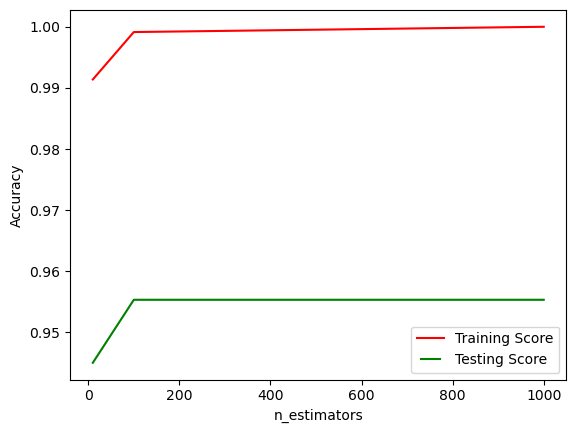

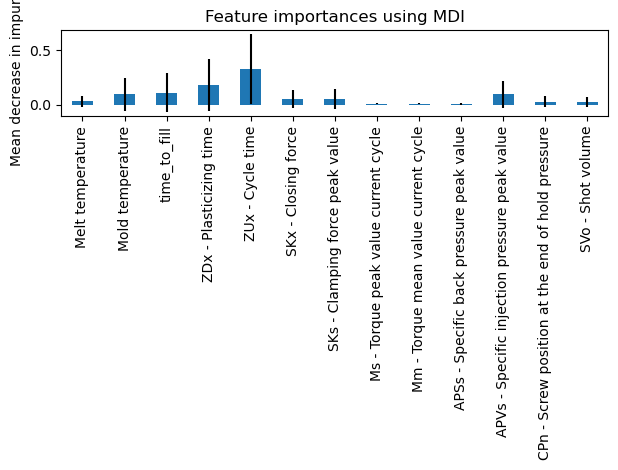

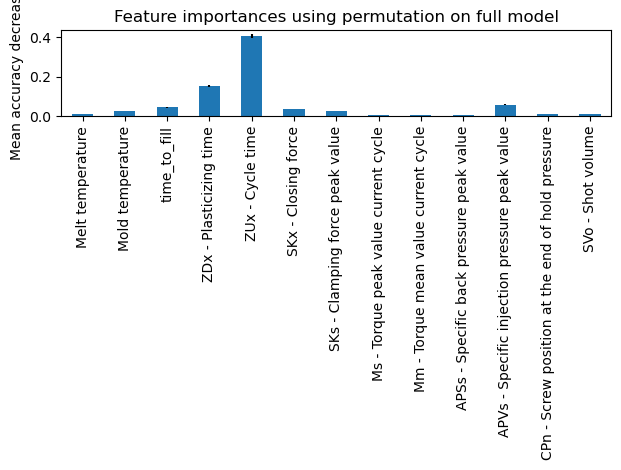

Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9553264604810997
Confusion Matrix: 


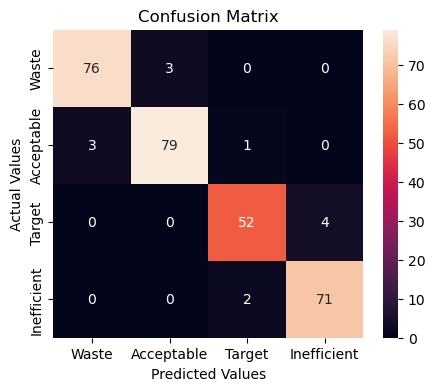

Normalized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.957174 using {'max_depth': 50, 'max_features': 'log2', 'n_estimators': 100}


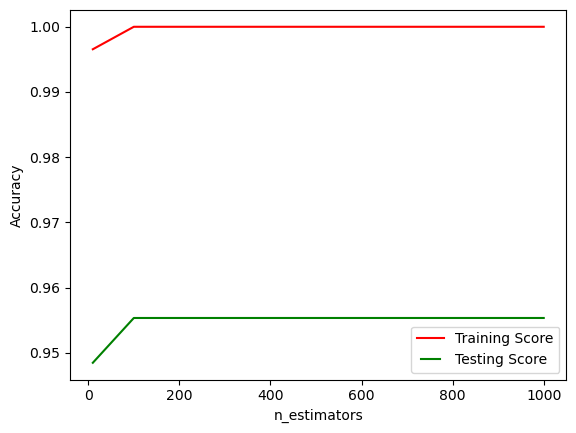

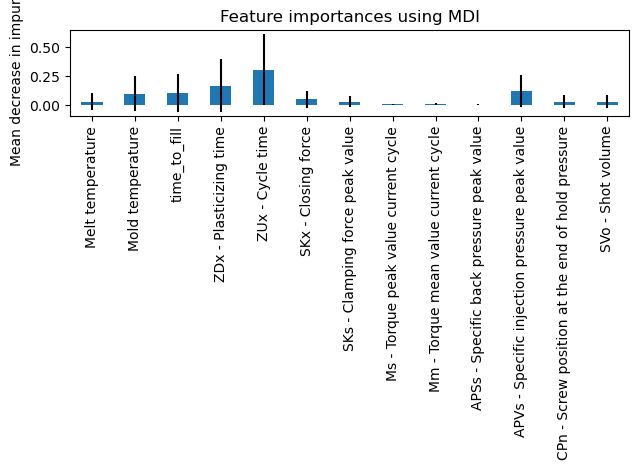

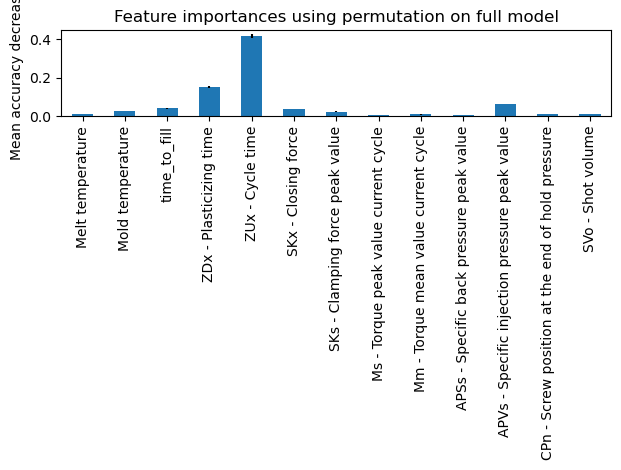

Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.97      0.97        79
         2.0       0.98      0.95      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.96      0.96      0.96       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9587628865979382
Confusion Matrix: 


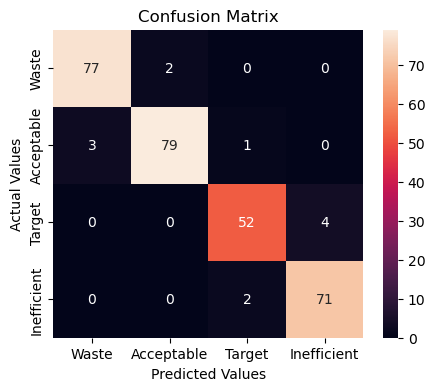

Standardized Data without strong correlations
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.956556 using {'max_depth': 110, 'max_features': 'sqrt', 'n_estimators': 100}


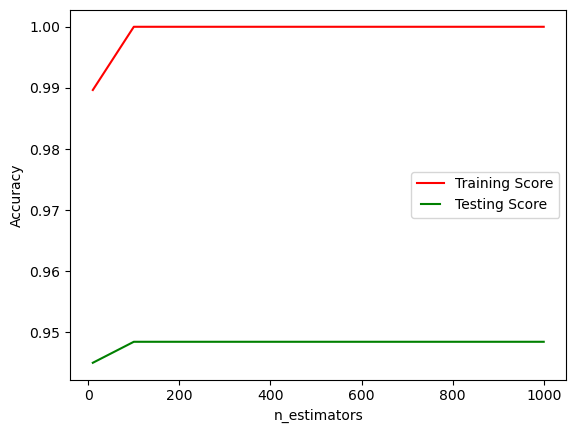

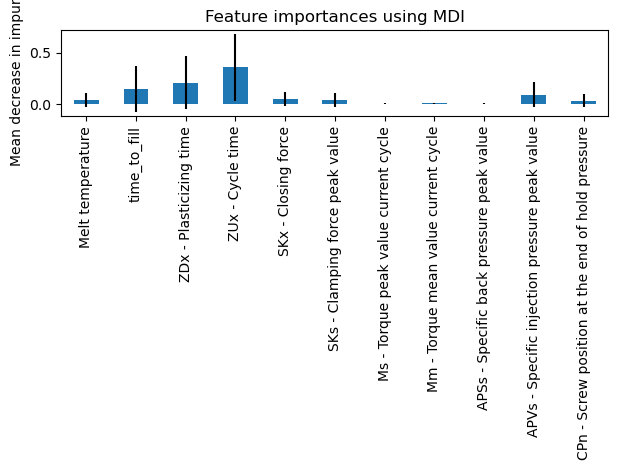

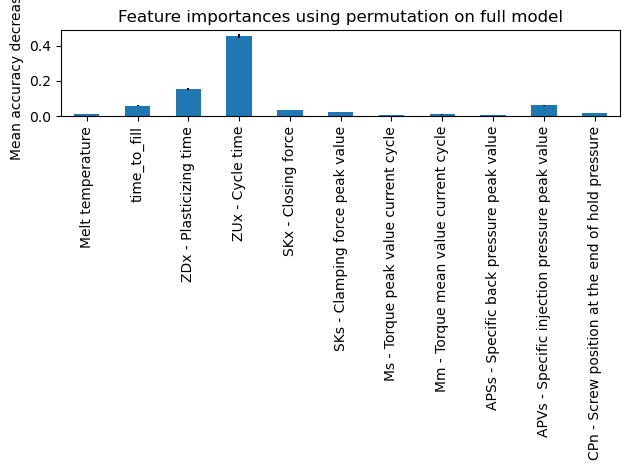

Classification report: 
              precision    recall  f1-score   support

         1.0       0.94      0.95      0.94        79
         2.0       0.95      0.93      0.94        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9415807560137457
Confusion Matrix: 


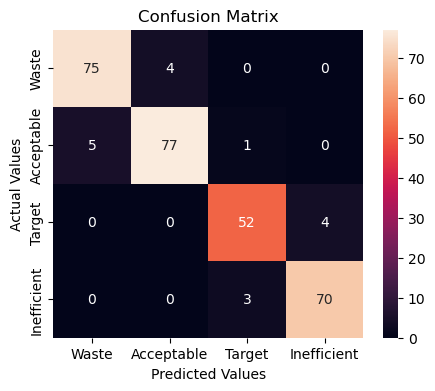

Normalized Data without strong correlations
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.956347 using {'max_depth': 110, 'max_features': 'sqrt', 'n_estimators': 1000}


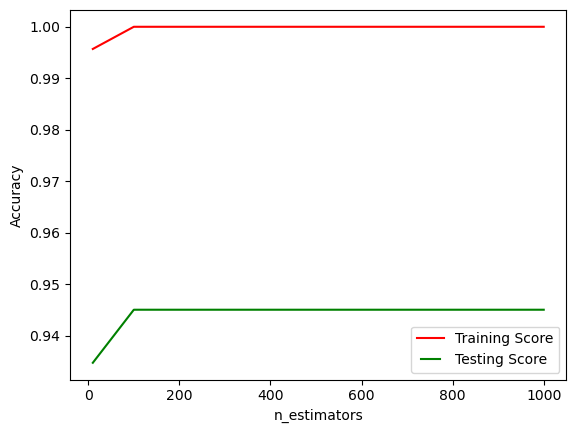

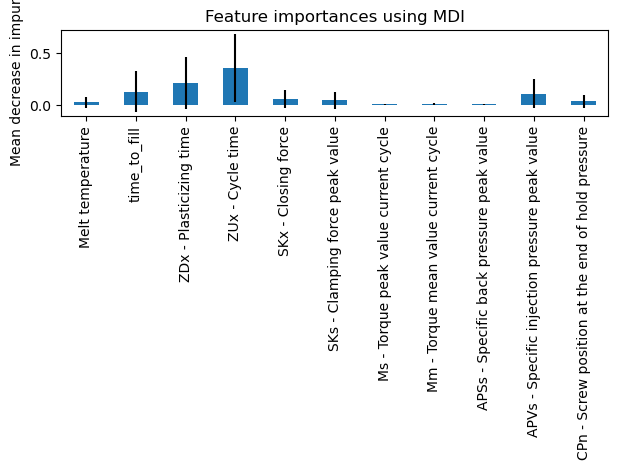

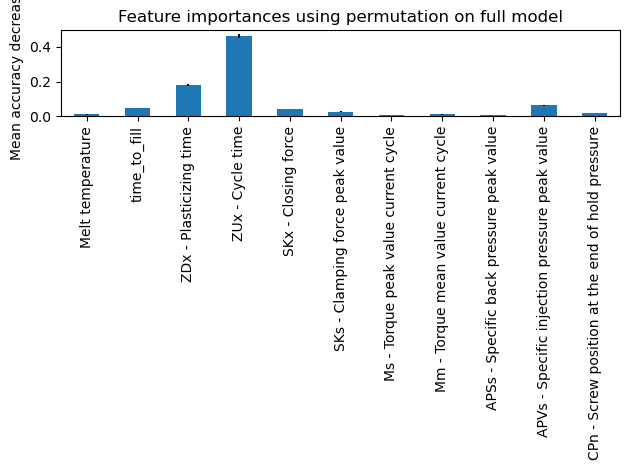

Classification report: 
              precision    recall  f1-score   support

         1.0       0.95      0.95      0.95        79
         2.0       0.95      0.94      0.95        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9450171821305842
Confusion Matrix: 


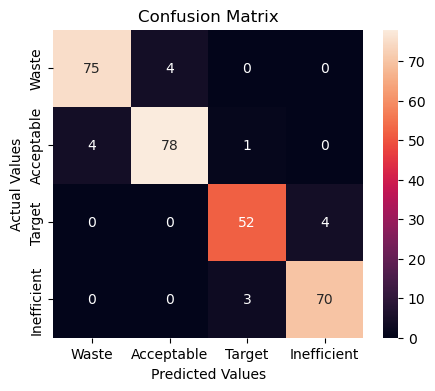

Standardized Data without not important features
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.957117 using {'max_depth': 110, 'max_features': 'sqrt', 'n_estimators': 1000}


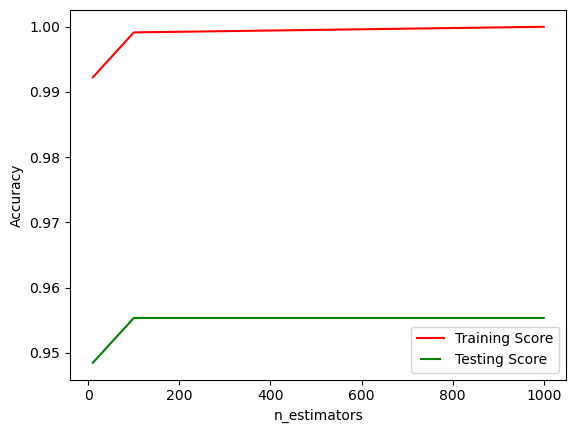

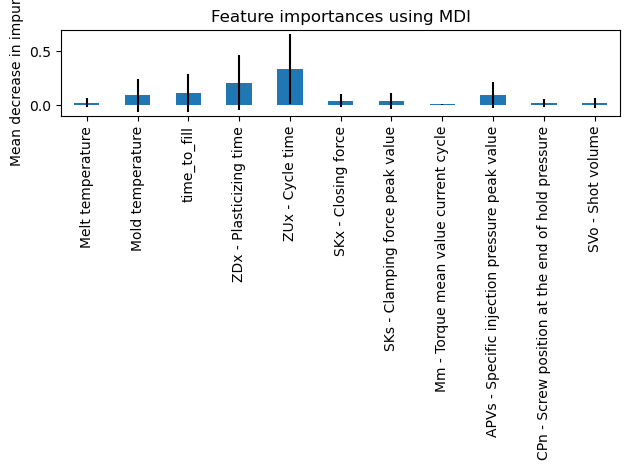

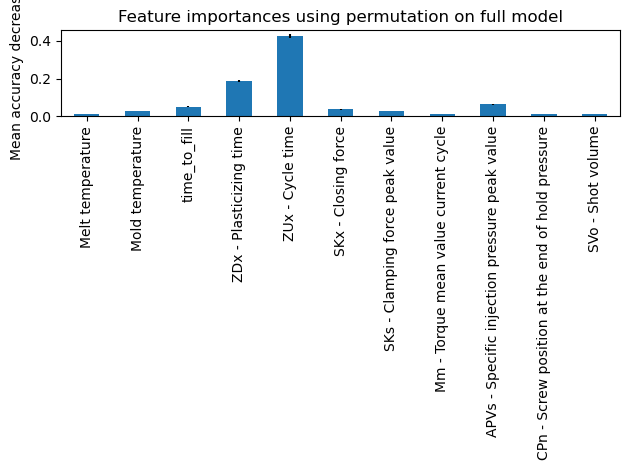

Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9553264604810997
Confusion Matrix: 


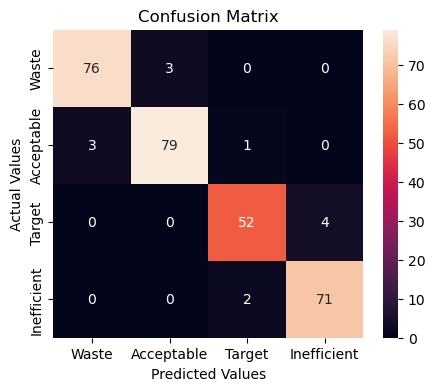

Normalized Data without not important features
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.956875 using {'max_depth': 50, 'max_features': 'sqrt', 'n_estimators': 1000}


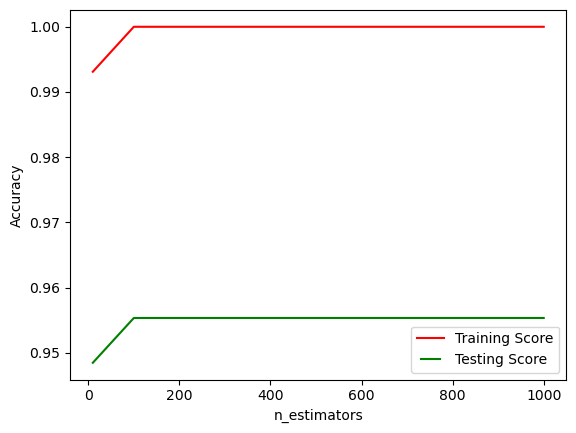

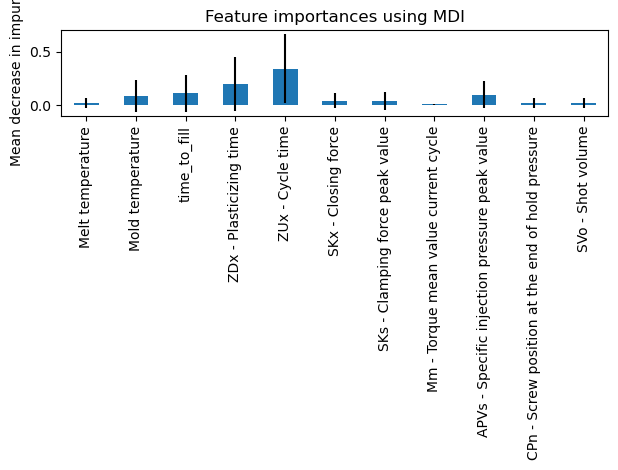

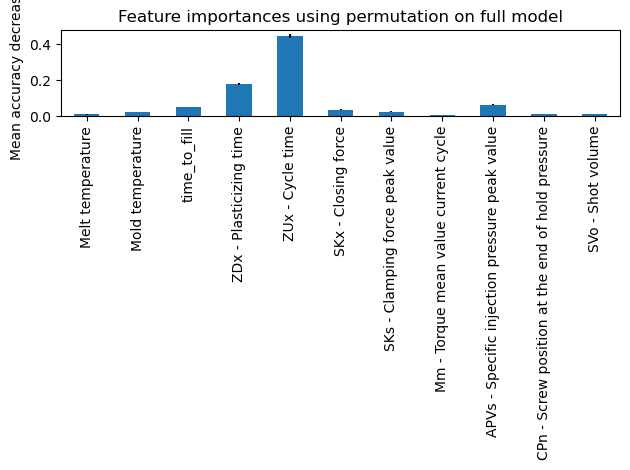

Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9553264604810997
Confusion Matrix: 


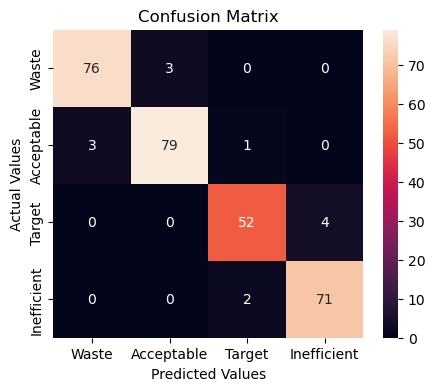

Fully Clean Standardized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.955797 using {'max_depth': 110, 'max_features': 'log2', 'n_estimators': 1000}


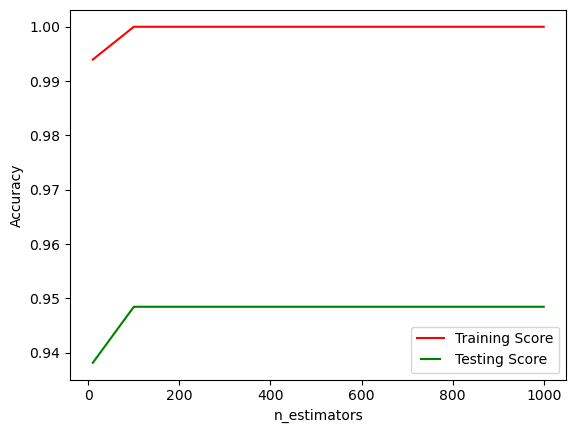

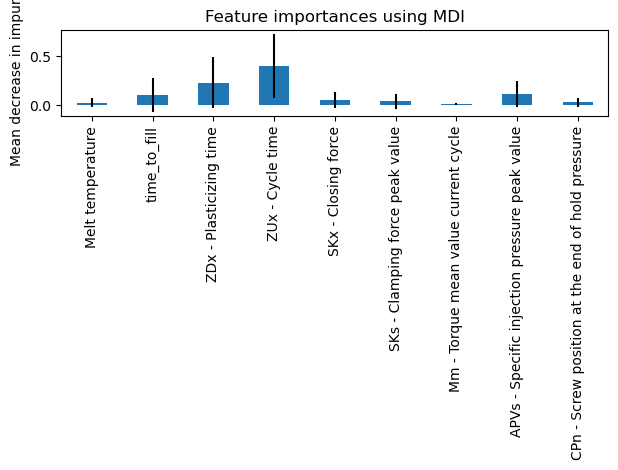

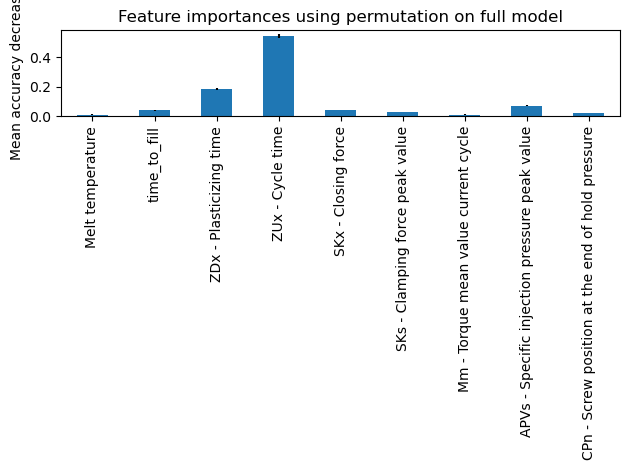

Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96        79
         2.0       0.95      0.95      0.95        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9484536082474226
Confusion Matrix: 


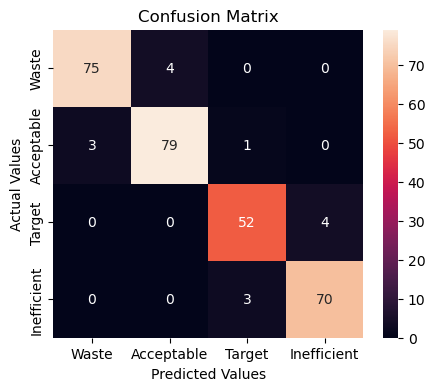

Fully Clean Normalized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.955740 using {'max_depth': 110, 'max_features': 'log2', 'n_estimators': 1000}


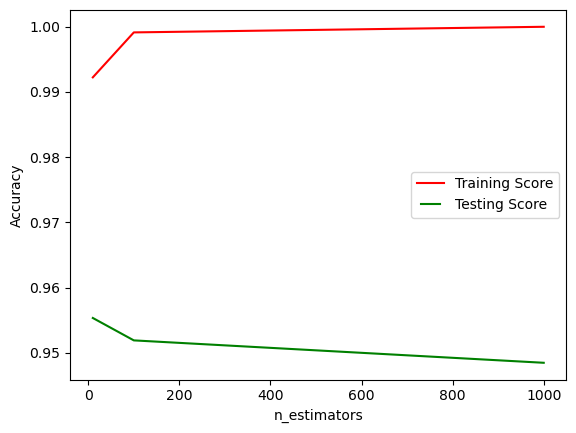

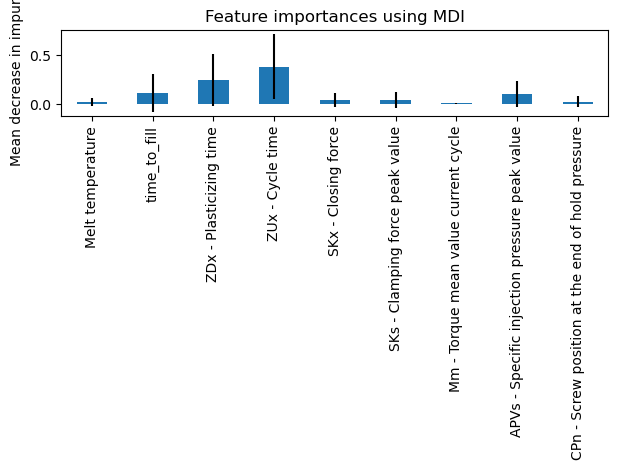

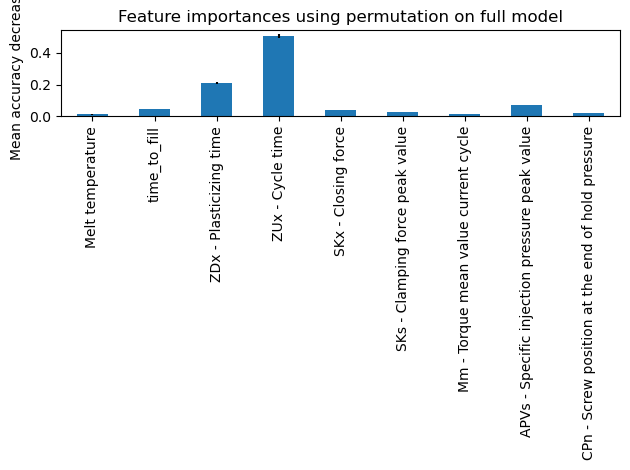

Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96        79
         2.0       0.95      0.95      0.95        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9484536082474226
Confusion Matrix: 


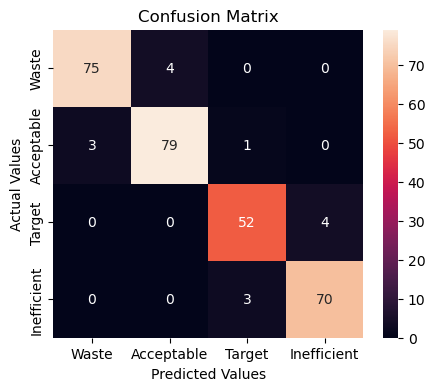

In [64]:
for key, X_data in datasets.items():
    print(key)
    y_pred, model = random_forest_regressor(X_data[0], y_train, X_data[1])
    score, _ = score_of_model(y_test, y_pred)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

## XGBoost

In [65]:
def xgboost_regressor(X_train, y_train, X_test, y_test):
  xgb_model = xgb.XGBRegressor()
  param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300]
  }
  best_params, best_model = hyper_param_tuning(xgb_model, param_grid, X_train, y_train)
  # Make predictions with the best model
  y_pred = np.around(best_model.predict(X_test))
  score, _ = score_of_model(y_test, y_pred)
  return score, best_model
  

Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.951663 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.96      0.97        79
         2.0       0.96      0.96      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.96      0.96      0.96       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9587628865979382
Confusion Matrix: 


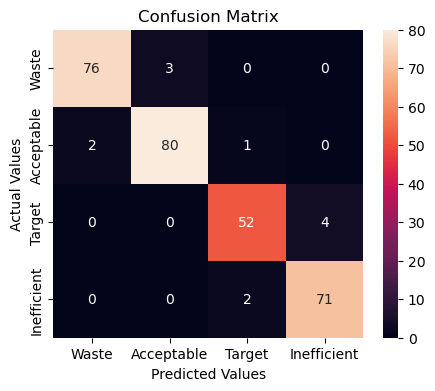

Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.951878 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.96      0.97        79
         2.0       0.96      0.96      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.96      0.96      0.96       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9587628865979382
Confusion Matrix: 


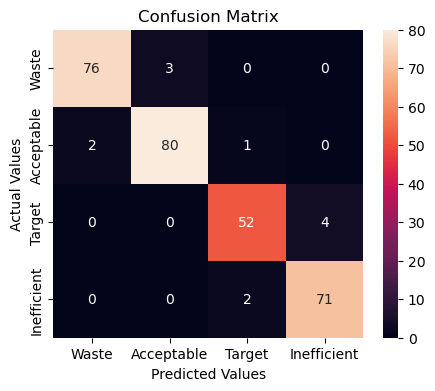

Standardized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950525 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96        79
         2.0       0.95      0.95      0.95        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9450171821305842
Confusion Matrix: 


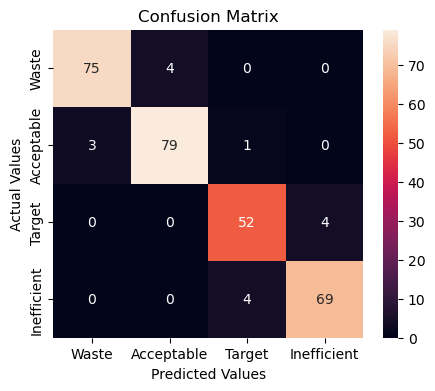

Normalized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950670 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96        79
         2.0       0.95      0.95      0.95        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9450171821305842
Confusion Matrix: 


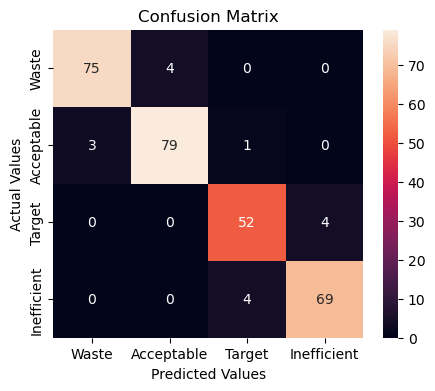

Standardized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950918 using {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96        79
         2.0       0.95      0.95      0.95        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9450171821305842
Confusion Matrix: 


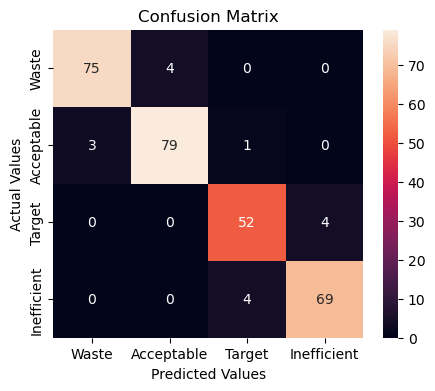

Normalized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.951029 using {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96        79
         2.0       0.95      0.95      0.95        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9450171821305842
Confusion Matrix: 


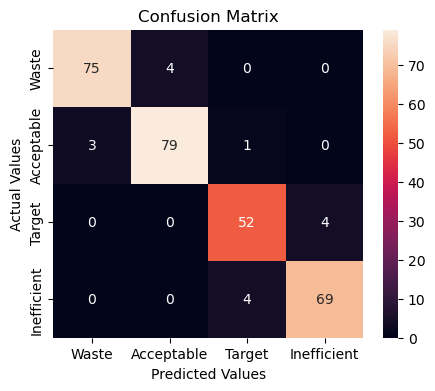

Fully Clean Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950170 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.96      0.97        79
         2.0       0.96      0.96      0.96        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


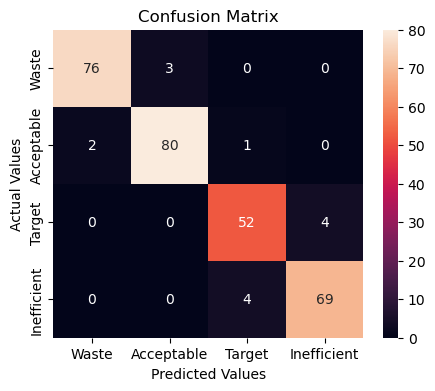

Fully Clean Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950351 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.96      0.97        79
         2.0       0.96      0.96      0.96        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


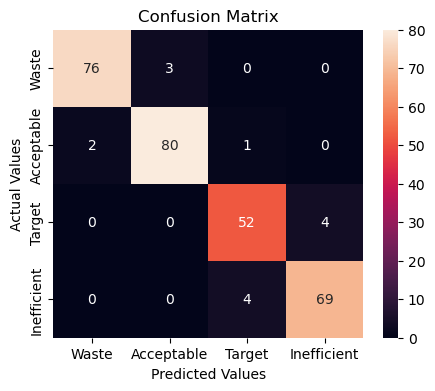

In [66]:
for key, X_data in datasets.items():
    print(key)
    score, model = xgboost_regressor(X_data[0], y_train, X_data[1], y_test)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

## Gradient Boosting

In [67]:
def gradient_boosting_regressor(X_train, y_train, X_test, y_test):
  grad = GradientBoostingRegressor()
  param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300]
  }
  best_params, best_model = hyper_param_tuning(grad, param_grid, X_train, y_train)
  # Make predictions with the best model
  y_pred = np.around(best_model.predict(X_test))
  score, _ = score_of_model(y_test, y_pred)
  return score, best_model

Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950603 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.96      0.97        79
         2.0       0.96      0.96      0.96        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9553264604810997
Confusion Matrix: 


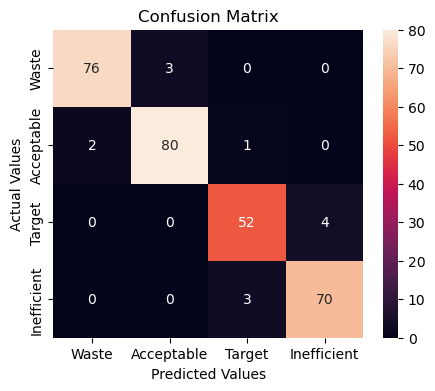

Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950598 using {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.93      0.95      0.94        79
         2.0       0.95      0.92      0.93        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9381443298969072
Confusion Matrix: 


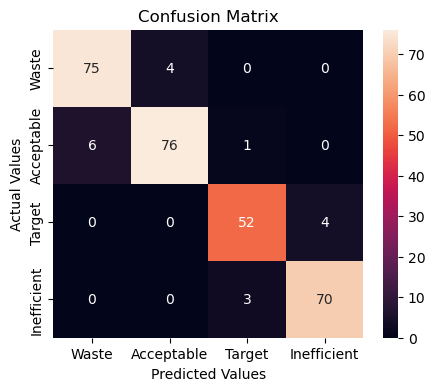

Standardized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950680 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


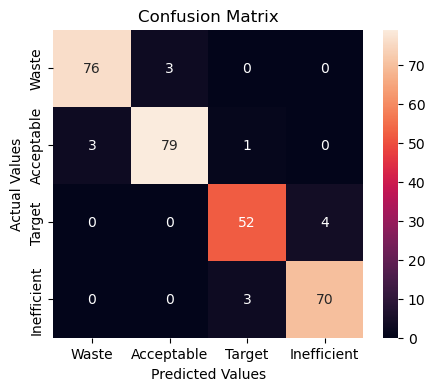

Normalized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950609 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.96      0.97        79
         2.0       0.96      0.96      0.96        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


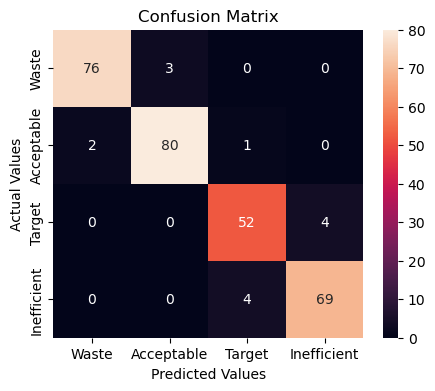

Standardized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950306 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.96      0.97        79
         2.0       0.96      0.96      0.96        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9553264604810997
Confusion Matrix: 


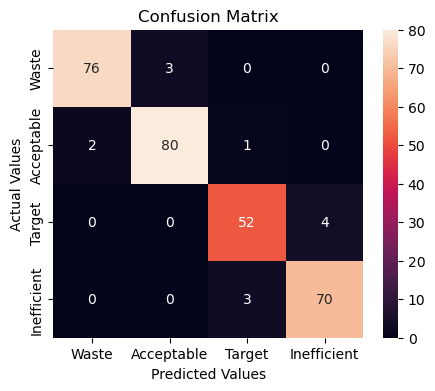

Normalized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.950099 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.96      0.97        79
         2.0       0.96      0.96      0.96        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


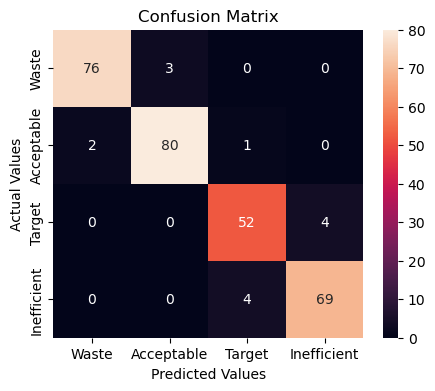

Fully Clean Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.949449 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.94      0.95        79
         2.0       0.94      0.95      0.95        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9415807560137457
Confusion Matrix: 


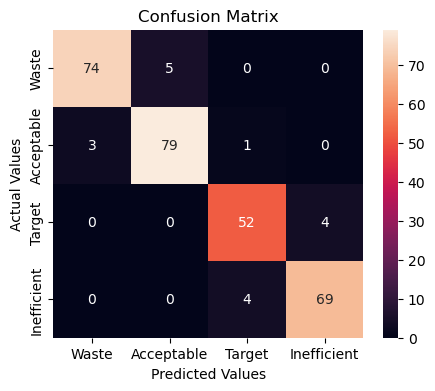

Fully Clean Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.949270 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.94      0.95        79
         2.0       0.94      0.95      0.95        83
         3.0       0.90      0.93      0.91        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9381443298969072
Confusion Matrix: 


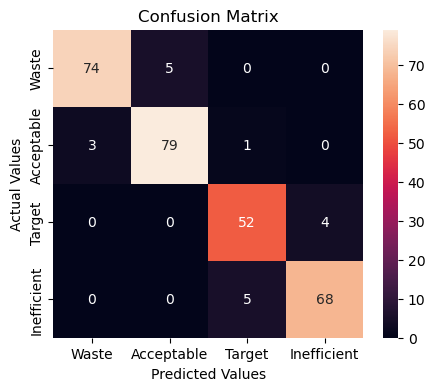

In [68]:
for key, X_data in datasets.items():
    print(key)
    score, model = gradient_boosting_regressor(X_data[0], y_train, X_data[1], y_test)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

### SVM

In [69]:
def svm_reg(X_train, y_train, X_test, y_test):
    param_grid = {'C': [0.1, 1, 10],
                'epsilon': [0.1, 0.01, 0.001],
                'kernel': ['poly', 'rbf', 'sigmoid']
    }
    best_params, best_model = hyper_param_tuning(SVR(), param_grid, X_train, y_train)
    y_pred = pd.DataFrame(np.around(best_model.predict(X_test))).apply(lambda x: [1 if y <= 1 else y for y in x]).apply(lambda x: [4 if y >= 4 else y for y in x])
    score,_ = score_of_model(y_test, y_pred)
    return score, best_model
    

Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.930771 using {'C': 10, 'epsilon': 0.001, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.91      0.81      0.86        79
         2.0       0.83      0.92      0.87        83
         3.0       0.91      0.91      0.91        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.89       291
   macro avg       0.90      0.90      0.90       291
weighted avg       0.90      0.89      0.89       291

Accuracy score: 
0.8934707903780069
Confusion Matrix: 


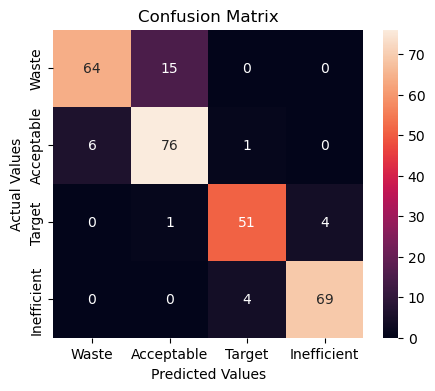

Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.927270 using {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.91      0.86      0.88        79
         2.0       0.87      0.90      0.89        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.91       291
   macro avg       0.92      0.92      0.92       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9140893470790378
Confusion Matrix: 


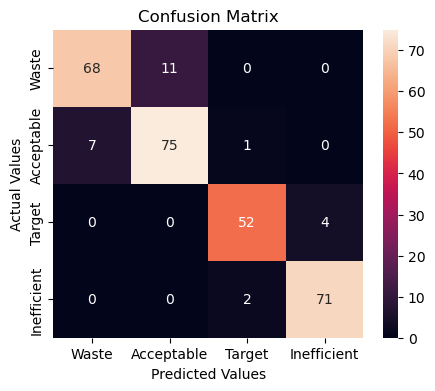

Standardized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.933274 using {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.93      0.82      0.87        79
         2.0       0.85      0.93      0.89        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.90       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.90      0.90       291

Accuracy score: 
0.9037800687285223
Confusion Matrix: 


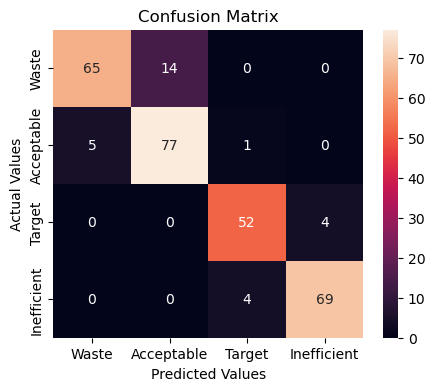

Normalized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.925754 using {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.91      0.86      0.88        79
         2.0       0.87      0.90      0.89        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.91       291
   macro avg       0.92      0.92      0.92       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9140893470790378
Confusion Matrix: 


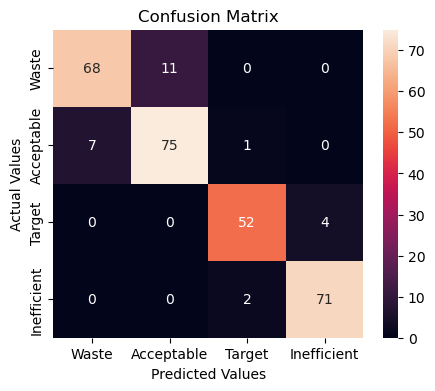

Standardized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.935415 using {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.93      0.86      0.89        79
         2.0       0.86      0.93      0.89        83
         3.0       0.93      0.89      0.91        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.91       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9106529209621993
Confusion Matrix: 


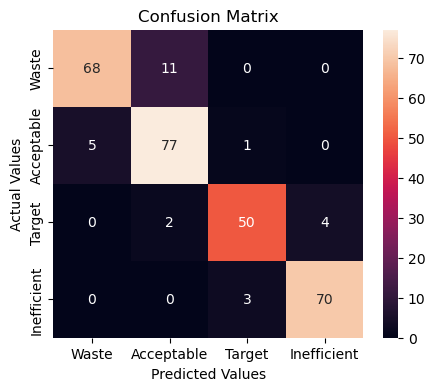

Normalized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.926572 using {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.89      0.85      0.87        79
         2.0       0.86      0.89      0.88        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.91       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9072164948453608
Confusion Matrix: 


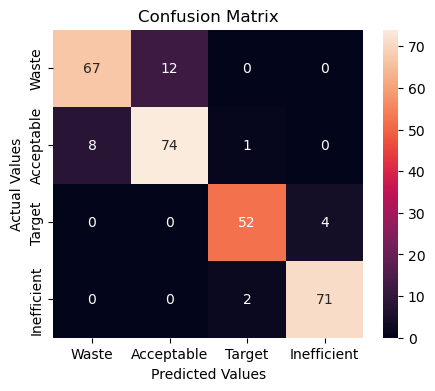

Fully Clean Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.937500 using {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.93      0.89      0.91        79
         2.0       0.89      0.93      0.91        83
         3.0       0.93      0.91      0.92        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.92       291
   macro avg       0.92      0.92      0.92       291
weighted avg       0.92      0.92      0.92       291

Accuracy score: 
0.9209621993127147
Confusion Matrix: 


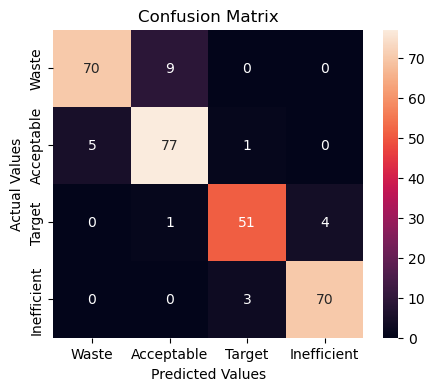

Fully Clean Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.925814 using {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.89      0.85      0.87        79
         2.0       0.86      0.89      0.88        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.91       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9072164948453608
Confusion Matrix: 


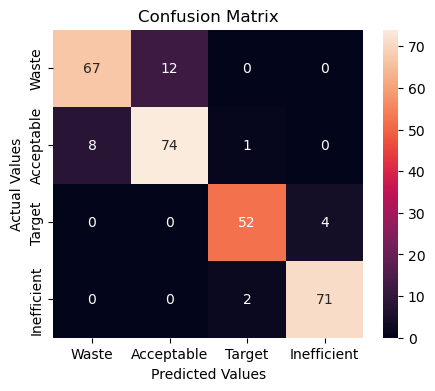

In [70]:
for key, X_data in datasets.items():
    print(key)
    score, model = svm_reg(X_data[0], y_train, X_data[1], y_test)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

# Classification models

## Logister regression one-vs-all

In [71]:
def log_reg_one_vs_all(X_train, y_train, X_test, y_test):
    param_grid = {'solver' : ['newton-cg', 'lbfgs', 'liblinear'],
                'C': [0.1, 1, 10],
                'penalty': ['l1', 'l2']
    }   
    best_params, best_model = hyper_param_tuning(LogisticRegression(max_iter=15000), param_grid, X_train, y_train)
    y_pred = best_model.predict(X_test)
    score, _ = score_of_model(y_test, y_pred)
    return score, best_model


Standardized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solve

Best: 0.854310 using {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.84      0.71      0.77        79
         2.0       0.76      0.86      0.80        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.86       291
   macro avg       0.87      0.87      0.87       291
weighted avg       0.86      0.86      0.86       291

Accuracy score: 
0.8591065292096219
Confusion Matrix: 


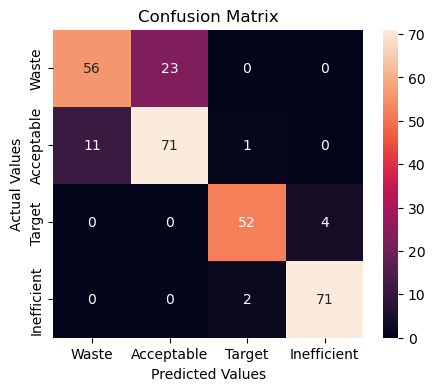

Normalized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solve

Best: 0.853448 using {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.84      0.72      0.78        79
         2.0       0.76      0.86      0.81        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.86       291
   macro avg       0.87      0.87      0.87       291
weighted avg       0.86      0.86      0.86       291

Accuracy score: 
0.8625429553264605
Confusion Matrix: 


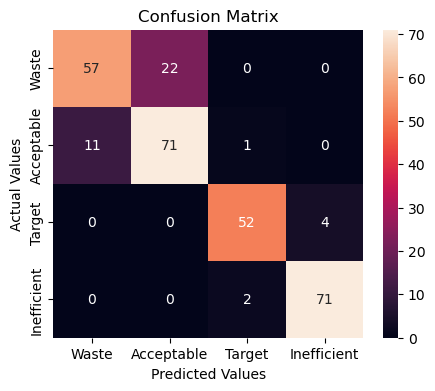

Standardized Data without strong correlations
Fitting 5 folds for each of 18 candidates, totalling 90 fits


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solve

Best: 0.853448 using {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.87      0.70      0.77        79
         2.0       0.76      0.89      0.82        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.87       291
   macro avg       0.88      0.87      0.87       291
weighted avg       0.87      0.87      0.86       291

Accuracy score: 
0.865979381443299
Confusion Matrix: 


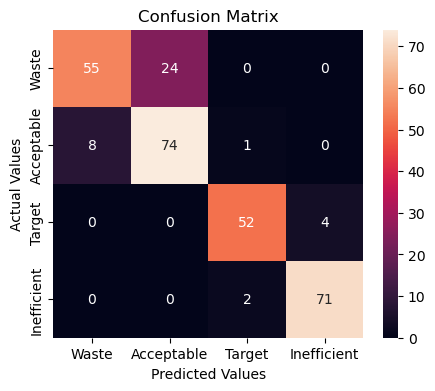

Normalized Data without strong correlations
Fitting 5 folds for each of 18 candidates, totalling 90 fits


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solve

Best: 0.849138 using {'C': 1, 'penalty': 'l2', 'solver': 'newton-cg'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.68      0.76        79
         2.0       0.74      0.88      0.81        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.86       291
   macro avg       0.87      0.87      0.87       291
weighted avg       0.86      0.86      0.86       291

Accuracy score: 
0.8591065292096219
Confusion Matrix: 


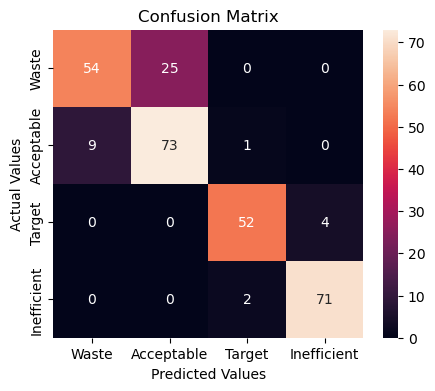

Standardized Data without not important features
Fitting 5 folds for each of 18 candidates, totalling 90 fits


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solve

Best: 0.852586 using {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.85      0.73      0.79        79
         2.0       0.77      0.87      0.82        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.87       291
   macro avg       0.88      0.88      0.88       291
weighted avg       0.87      0.87      0.87       291

Accuracy score: 
0.8694158075601375
Confusion Matrix: 


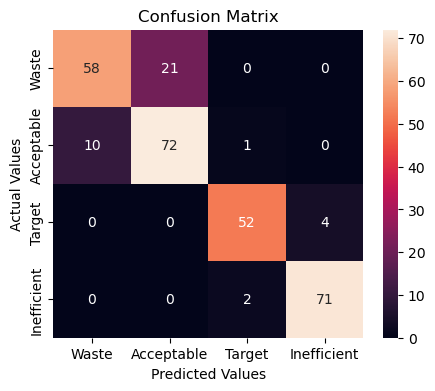

Normalized Data without not important features
Fitting 5 folds for each of 18 candidates, totalling 90 fits


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solve

Best: 0.849138 using {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.85      0.76      0.80        79
         2.0       0.79      0.86      0.82        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.87       291
   macro avg       0.88      0.88      0.88       291
weighted avg       0.87      0.87      0.87       291

Accuracy score: 
0.872852233676976
Confusion Matrix: 


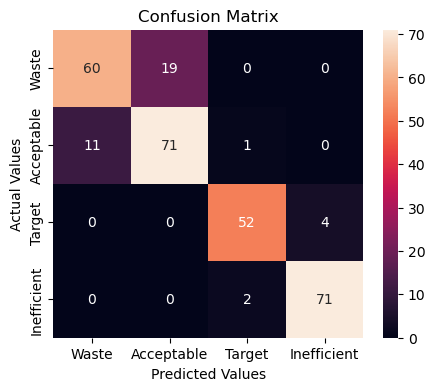

Fully Clean Standardized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solve

Best: 0.850862 using {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.85      0.66      0.74        79
         2.0       0.73      0.88      0.80        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.85       291
   macro avg       0.87      0.86      0.86       291
weighted avg       0.86      0.85      0.85       291

Accuracy score: 
0.852233676975945
Confusion Matrix: 


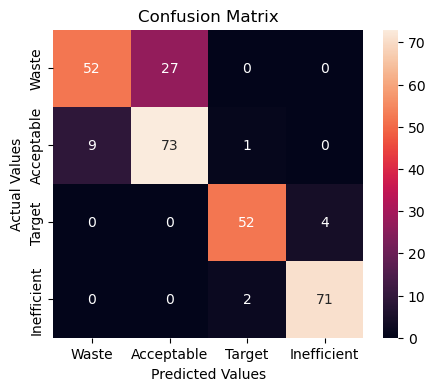

Fully Clean Normalized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits


/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 90.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solve

Best: 0.850000 using {'C': 1, 'penalty': 'l2', 'solver': 'newton-cg'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.85      0.66      0.74        79
         2.0       0.73      0.88      0.80        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.85       291
   macro avg       0.87      0.86      0.86       291
weighted avg       0.86      0.85      0.85       291

Accuracy score: 
0.852233676975945
Confusion Matrix: 


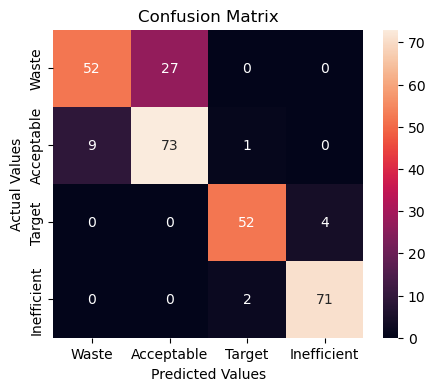

In [72]:
for key, X_data in datasets.items():
    print(key)
    score, model = log_reg_one_vs_all(X_data[0], y_train, X_data[1], y_test)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

## Ridge Classifier

In [73]:
def ridge_classifier(X_train, y_train, X_test, y_test):
    param_grid = {
                'alpha': [0.1, 1, 10],
                'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
    }   
    best_params, best_model = hyper_param_tuning(RidgeClassifier(max_iter=10000), param_grid, X_train, y_train)
    y_pred = best_model.predict(X_test)
    score, _ = score_of_model(y_test, y_pred)
    return score, best_model

Standardized data
Fitting 5 folds for each of 21 candidates, totalling 105 fits
Best: 0.848276 using {'alpha': 10, 'solver': 'lsqr'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.84      0.66      0.74        79
         2.0       0.74      0.87      0.80        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.85       291
   macro avg       0.86      0.86      0.85       291
weighted avg       0.85      0.85      0.85       291

Accuracy score: 
0.8487972508591065
Confusion Matrix: 


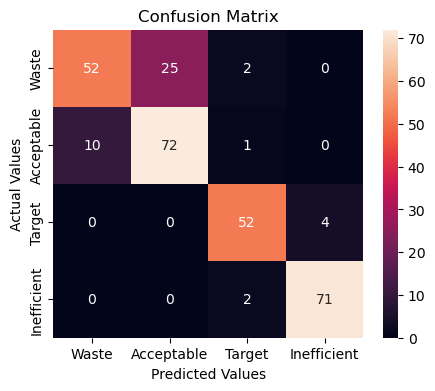

Normalized data
Fitting 5 folds for each of 21 candidates, totalling 105 fits
Best: 0.848276 using {'alpha': 1, 'solver': 'auto'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.84      0.68      0.76        79
         2.0       0.75      0.87      0.80        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.85       291
   macro avg       0.86      0.86      0.86       291
weighted avg       0.86      0.85      0.85       291

Accuracy score: 
0.852233676975945
Confusion Matrix: 


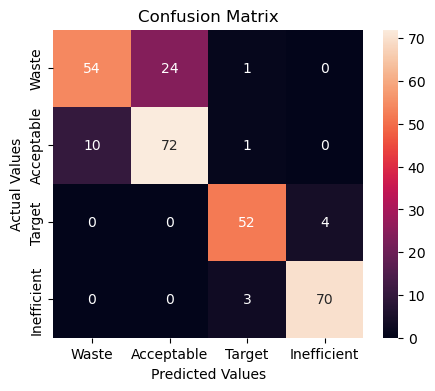

Standardized Data without strong correlations
Fitting 5 folds for each of 21 candidates, totalling 105 fits
Best: 0.850000 using {'alpha': 10, 'solver': 'auto'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.66      0.75        79
         2.0       0.75      0.90      0.82        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.86       291
   macro avg       0.87      0.87      0.86       291
weighted avg       0.87      0.86      0.86       291

Accuracy score: 
0.8591065292096219
Confusion Matrix: 


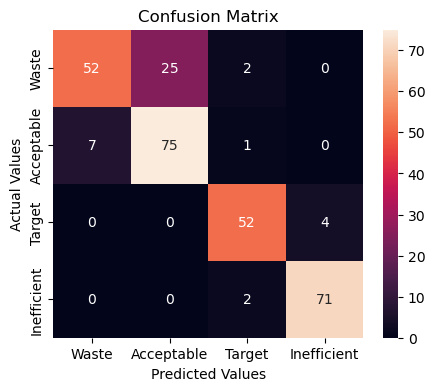

Normalized Data without strong correlations
Fitting 5 folds for each of 21 candidates, totalling 105 fits
Best: 0.849138 using {'alpha': 0.1, 'solver': 'auto'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.66      0.75        79
         2.0       0.75      0.90      0.82        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.86       291
   macro avg       0.87      0.87      0.86       291
weighted avg       0.87      0.86      0.86       291

Accuracy score: 
0.8591065292096219
Confusion Matrix: 


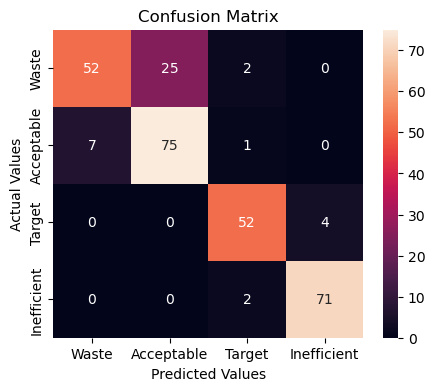

Standardized Data without not important features
Fitting 5 folds for each of 21 candidates, totalling 105 fits
Best: 0.847414 using {'alpha': 10, 'solver': 'auto'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.68      0.76        79
         2.0       0.76      0.88      0.82        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.86       291
   macro avg       0.87      0.87      0.86       291
weighted avg       0.86      0.86      0.86       291

Accuracy score: 
0.8591065292096219
Confusion Matrix: 


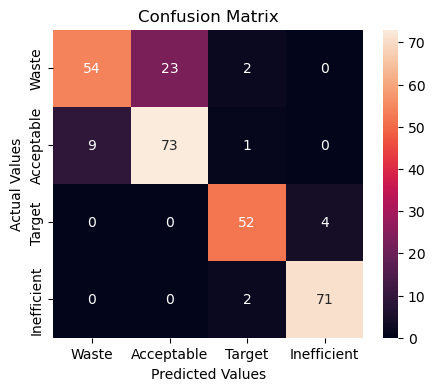

Normalized Data without not important features
Fitting 5 folds for each of 21 candidates, totalling 105 fits
Best: 0.848276 using {'alpha': 1, 'solver': 'auto'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.85      0.67      0.75        79
         2.0       0.75      0.88      0.81        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.86       291
   macro avg       0.87      0.86      0.86       291
weighted avg       0.86      0.86      0.85       291

Accuracy score: 
0.8556701030927835
Confusion Matrix: 


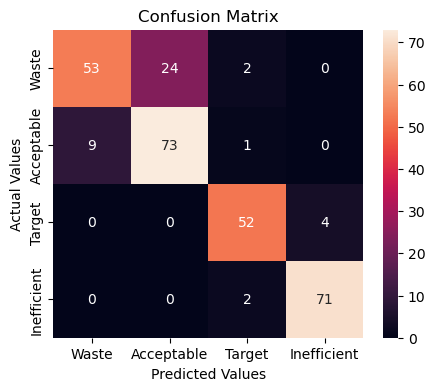

Fully Clean Standardized data
Fitting 5 folds for each of 21 candidates, totalling 105 fits
Best: 0.845690 using {'alpha': 0.1, 'solver': 'auto'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.63      0.73        79
         2.0       0.73      0.89      0.80        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.85       291
   macro avg       0.87      0.86      0.85       291
weighted avg       0.86      0.85      0.85       291

Accuracy score: 
0.8487972508591065
Confusion Matrix: 


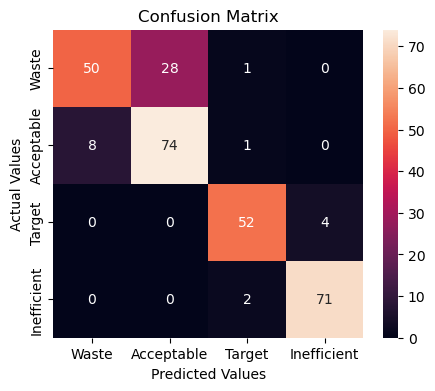

Fully Clean Normalized data
Fitting 5 folds for each of 21 candidates, totalling 105 fits
Best: 0.846552 using {'alpha': 0.1, 'solver': 'auto'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.63      0.73        79
         2.0       0.73      0.89      0.80        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.85       291
   macro avg       0.87      0.86      0.85       291
weighted avg       0.86      0.85      0.85       291

Accuracy score: 
0.8487972508591065
Confusion Matrix: 


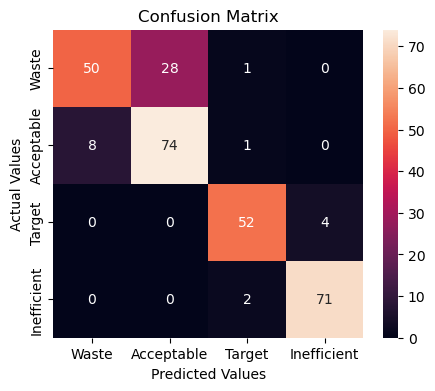

In [74]:
for key, X_data in datasets.items():
    print(key)
    score, model = ridge_classifier(X_data[0], y_train, X_data[1], y_test)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

## KNN

In [75]:
def knn(X_train, y_train, X_test, y_test):
    param_grid = {
                'n_neighbors': [3, 5, 7, 9, 11, 13, 15],
                'weights': ['uniform', 'distance'],
                'metric': ['euclidean', 'manhattan', 'minkowski'],
                'p': [1, 2]
    }
    best_params, best_model = hyper_param_tuning(KNeighborsClassifier(), param_grid, X_train, y_train)
    y_pred = best_model.predict(X_test)
    score, _ = score_of_model(y_test, y_pred)
    return score, best_model

Standardized data
Fitting 5 folds for each of 84 candidates, totalling 420 fits
Best: 0.910345 using {'metric': 'manhattan', 'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.90      0.84      0.87        79
         2.0       0.87      0.90      0.89        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.91       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9072164948453608
Confusion Matrix: 


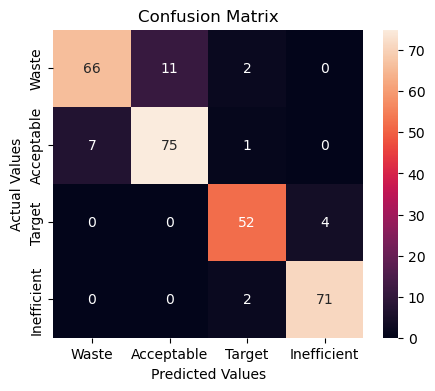

Normalized data
Fitting 5 folds for each of 84 candidates, totalling 420 fits
Best: 0.907759 using {'metric': 'manhattan', 'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.91      0.85      0.88        79
         2.0       0.86      0.90      0.88        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.91       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9106529209621993
Confusion Matrix: 


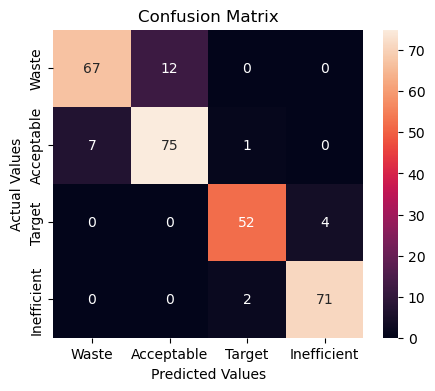

Standardized Data without strong correlations
Fitting 5 folds for each of 84 candidates, totalling 420 fits
Best: 0.918966 using {'metric': 'manhattan', 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.87      0.78      0.83        79
         2.0       0.83      0.88      0.85        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.89       291
   macro avg       0.89      0.89      0.89       291
weighted avg       0.89      0.89      0.89       291

Accuracy score: 
0.8865979381443299
Confusion Matrix: 


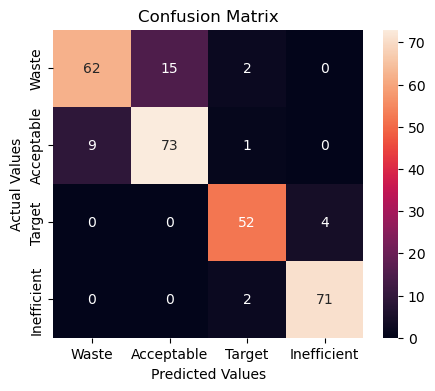

Normalized Data without strong correlations
Fitting 5 folds for each of 84 candidates, totalling 420 fits
Best: 0.906897 using {'metric': 'manhattan', 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.89      0.85      0.87        79
         2.0       0.86      0.89      0.88        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.91       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9072164948453608
Confusion Matrix: 


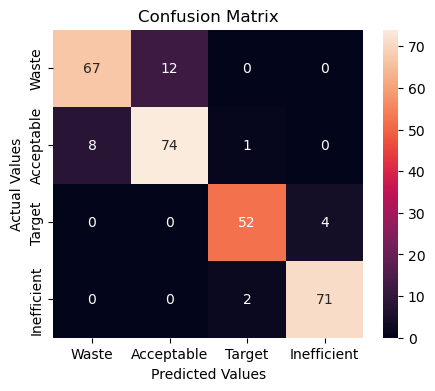

Standardized Data without not important features
Fitting 5 folds for each of 84 candidates, totalling 420 fits
Best: 0.924138 using {'metric': 'manhattan', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.92      0.89      0.90        79
         2.0       0.88      0.92      0.90        83
         3.0       0.94      0.91      0.93        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.92       291
   macro avg       0.92      0.92      0.92       291
weighted avg       0.92      0.92      0.92       291

Accuracy score: 
0.9209621993127147
Confusion Matrix: 


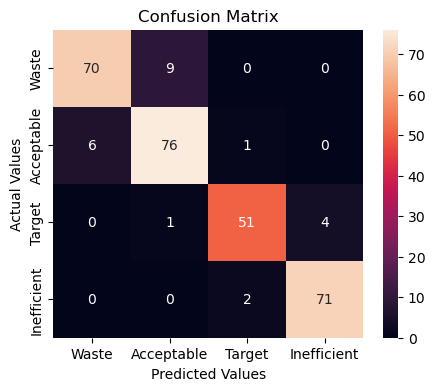

Normalized Data without not important features
Fitting 5 folds for each of 84 candidates, totalling 420 fits
Best: 0.918966 using {'metric': 'manhattan', 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.95      0.91      0.93        79
         2.0       0.92      0.94      0.93        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9381443298969072
Confusion Matrix: 


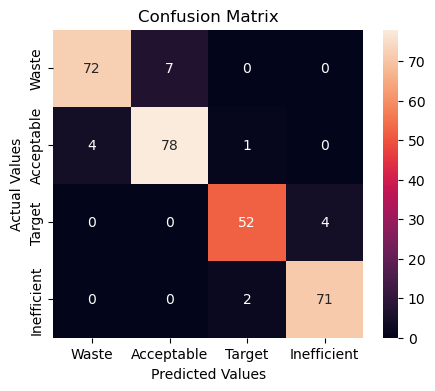

Fully Clean Standardized data
Fitting 5 folds for each of 84 candidates, totalling 420 fits
Best: 0.927586 using {'metric': 'manhattan', 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.93      0.90      0.92        79
         2.0       0.92      0.93      0.92        83
         3.0       0.91      0.91      0.91        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.93       291
   macro avg       0.93      0.93      0.93       291
weighted avg       0.93      0.93      0.93       291

Accuracy score: 
0.9278350515463918
Confusion Matrix: 


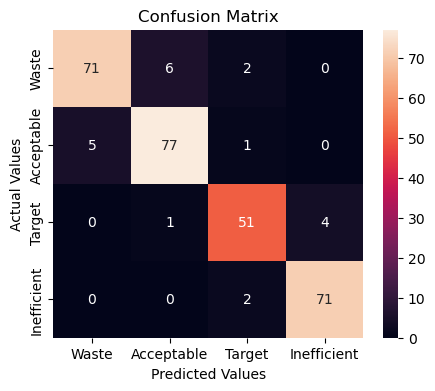

Fully Clean Normalized data
Fitting 5 folds for each of 84 candidates, totalling 420 fits
Best: 0.921552 using {'metric': 'manhattan', 'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.92      0.92      0.92        79
         2.0       0.93      0.92      0.92        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.93       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.93      0.93      0.93       291

Accuracy score: 
0.9347079037800687
Confusion Matrix: 


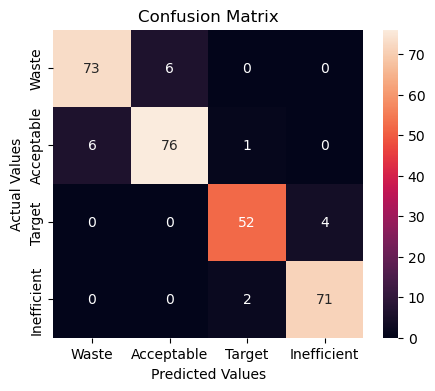

In [76]:
for key, X_data in datasets.items():
    print(key)
    score, model = knn(X_data[0], y_train, X_data[1], y_test)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

## SVM

In [77]:
def svm(X_train, y_train, X_test, y_test):
    param_grid = {
                'C': [0.1, 1, 10],
                'gamma': [0.1, 1, 10],
                'kernel': ['linear', 'rbf', 'poly']
    }
    best_params, best_model = hyper_param_tuning(SVC(), param_grid, X_train, y_train)
    y_pred = best_model.predict(X_test) 
    sc,_ = score_of_model(y_test, y_pred)
    return score, best_model
    

Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.920690 using {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.92      0.86      0.89        79
         2.0       0.88      0.90      0.89        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.91       291
   macro avg       0.92      0.92      0.92       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9140893470790378
Confusion Matrix: 


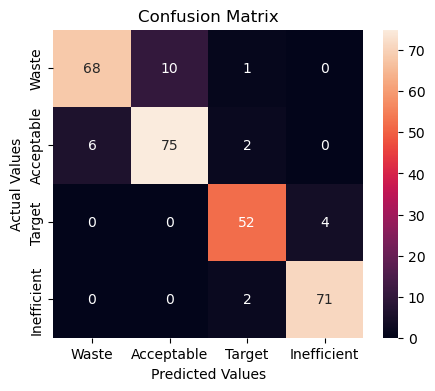

Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.916379 using {'C': 10, 'gamma': 10, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.88      0.90      0.89        79
         2.0       0.90      0.89      0.90        83
         3.0       0.94      0.88      0.91        56
         4.0       0.93      0.97      0.95        73

    accuracy                           0.91       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9106529209621993
Confusion Matrix: 


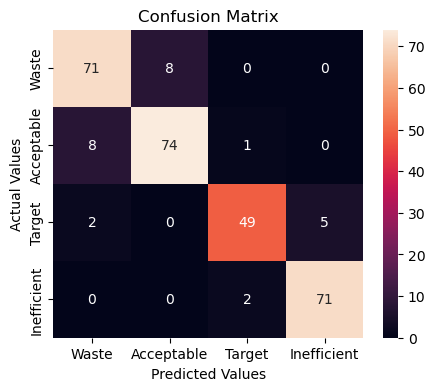

Standardized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.920690 using {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.91      0.86      0.88        79
         2.0       0.88      0.90      0.89        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.91       291
   macro avg       0.92      0.92      0.92       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9140893470790378
Confusion Matrix: 


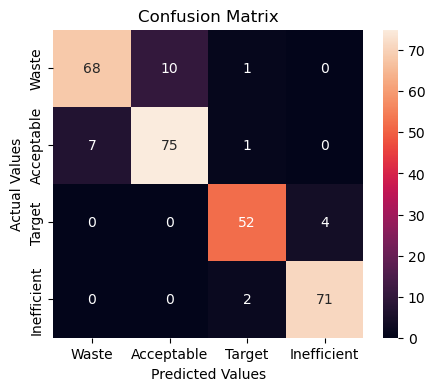

Normalized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.912931 using {'C': 10, 'gamma': 10, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.86      0.89      0.87        79
         2.0       0.89      0.86      0.87        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.90       291
   macro avg       0.90      0.90      0.90       291
weighted avg       0.90      0.90      0.90       291

Accuracy score: 
0.9003436426116839
Confusion Matrix: 


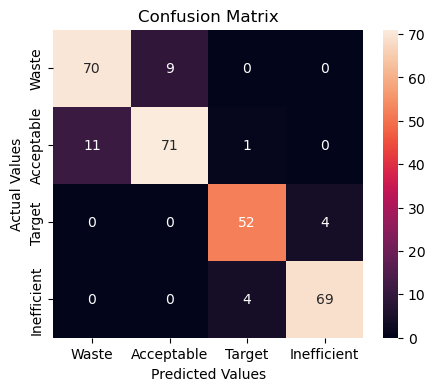

Standardized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.922414 using {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.94      0.92      0.93        79
         2.0       0.95      0.92      0.93        83
         3.0       0.90      0.93      0.91        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.93       291
   macro avg       0.93      0.94      0.93       291
weighted avg       0.94      0.93      0.93       291

Accuracy score: 
0.9347079037800687
Confusion Matrix: 


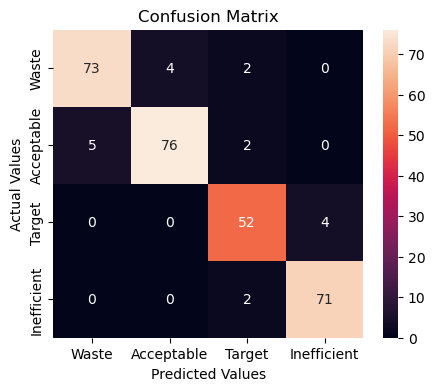

Normalized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.924138 using {'C': 1, 'gamma': 10, 'kernel': 'poly'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.91      0.94        79
         2.0       0.92      0.95      0.93        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9381443298969072
Confusion Matrix: 


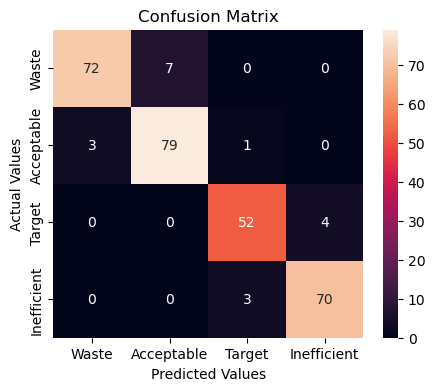

Fully Clean Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.919828 using {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.93      0.89      0.91        79
         2.0       0.92      0.93      0.92        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.93       291
   macro avg       0.93      0.93      0.93       291
weighted avg       0.93      0.93      0.93       291

Accuracy score: 
0.9278350515463918
Confusion Matrix: 


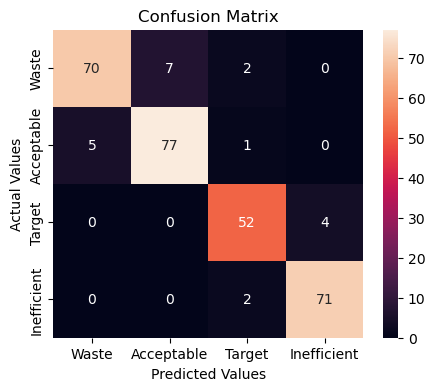

Fully Clean Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.924138 using {'C': 10, 'gamma': 10, 'kernel': 'rbf'}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.95      0.92      0.94        79
         2.0       0.93      0.94      0.93        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9415807560137457
Confusion Matrix: 


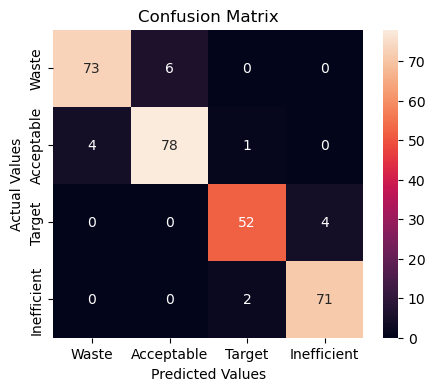

In [78]:
for key, X_data in datasets.items():
    if key != 'Raw data': # because for Raw Data it doesnt work
        print(key)
        score, model = svm(X_data[0], y_train, X_data[1], y_test)
        result = np.append(result, [str(model.__class__.__name__), str(key), score])

## Decision Trees

In [79]:
def decision_tree_classifier(X_train, y_train, X_test, y_test):
    param_grid = {
                'criterion': ['gini', 'entropy'],
                'max_depth': [None, 5, 10, 20],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4]
    }
    best_params, best_model = hyper_param_tuning(DecisionTreeClassifier(), param_grid, X_train, y_train)
    y_pred = best_model.predict(X_test)
    score,_ = score_of_model(y_test, y_pred)
    return score, best_model


Standardized data
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best: 0.907759 using {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.94      0.91      0.92        79
         2.0       0.90      0.93      0.91        83
         3.0       0.89      0.91      0.90        56
         4.0       0.96      0.93      0.94        73

    accuracy                           0.92       291
   macro avg       0.92      0.92      0.92       291
weighted avg       0.92      0.92      0.92       291

Accuracy score: 
0.9209621993127147
Confusion Matrix: 


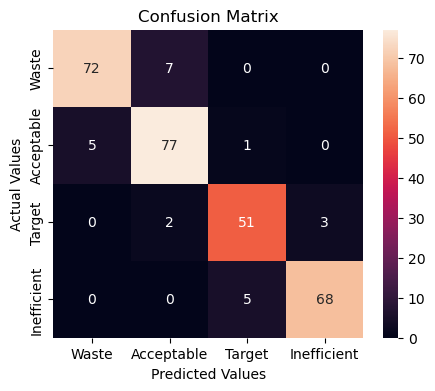

Normalized data
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best: 0.909483 using {'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 10}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.92      0.92      0.92        79
         2.0       0.93      0.92      0.92        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.93       291
   macro avg       0.93      0.93      0.93       291
weighted avg       0.93      0.93      0.93       291

Accuracy score: 
0.9312714776632303
Confusion Matrix: 


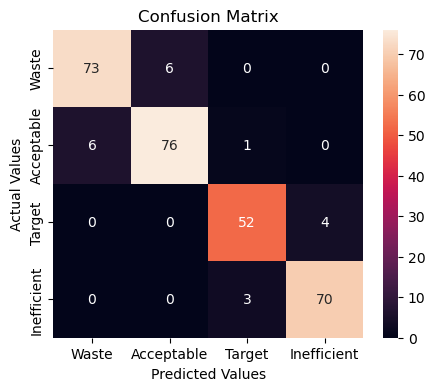

Standardized Data without strong correlations
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best: 0.907759 using {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.91      0.87      0.89        79
         2.0       0.88      0.90      0.89        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.92       291
   macro avg       0.92      0.92      0.92       291
weighted avg       0.92      0.92      0.92       291

Accuracy score: 
0.9175257731958762
Confusion Matrix: 


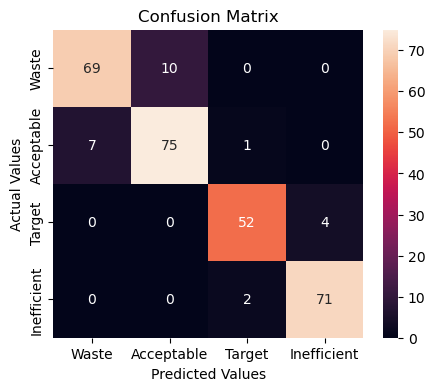

Normalized Data without strong correlations
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best: 0.907759 using {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 10}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.91      0.90      0.90        79
         2.0       0.90      0.90      0.90        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.92       291
   macro avg       0.92      0.92      0.92       291
weighted avg       0.92      0.92      0.92       291

Accuracy score: 
0.9209621993127147
Confusion Matrix: 


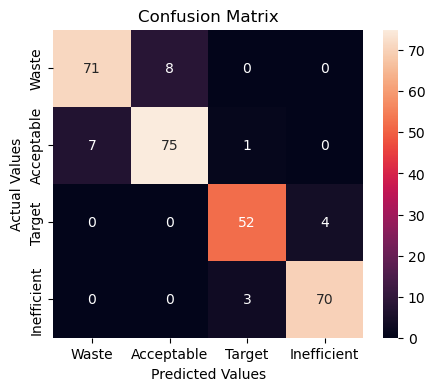

Standardized Data without not important features
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best: 0.915517 using {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.94      0.94      0.94        79
         2.0       0.94      0.93      0.93        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9415807560137457
Confusion Matrix: 


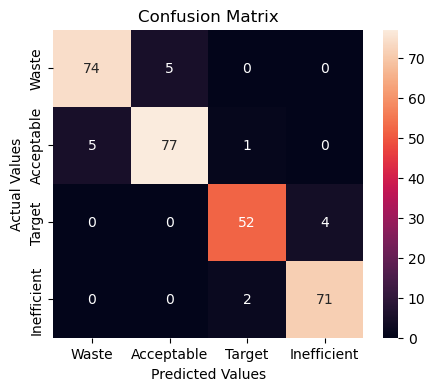

Normalized Data without not important features
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best: 0.912931 using {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 10}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.93      0.94      0.93        79
         2.0       0.94      0.92      0.93        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9381443298969072
Confusion Matrix: 


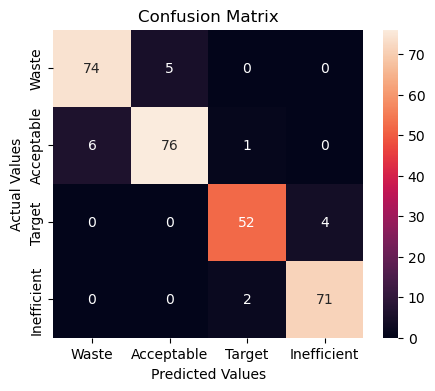

Fully Clean Standardized data
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best: 0.912069 using {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.87      0.91      0.89        79
         2.0       0.91      0.86      0.88        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.91       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9106529209621993
Confusion Matrix: 


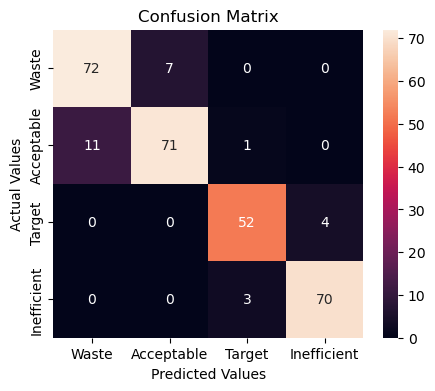

Fully Clean Normalized data
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best: 0.912069 using {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.87      0.91      0.89        79
         2.0       0.91      0.86      0.88        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.91       291
   macro avg       0.91      0.91      0.91       291
weighted avg       0.91      0.91      0.91       291

Accuracy score: 
0.9106529209621993
Confusion Matrix: 


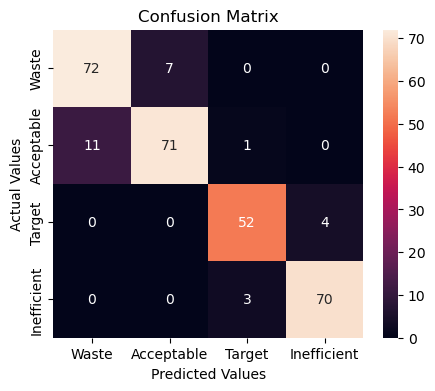

In [80]:
for key, X_data in datasets.items():
    print(key)
    score, model = decision_tree_classifier(X_data[0], y_train, X_data[1], y_test)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

## Random Forest

In [81]:
def random_forest_classifier(X_train, y_train, X_test, y_test):
    n_estimators = [10, 100, 1000]
    max_features = ['sqrt', 'log2']
    max_depth = [10, 50, 110]
    grid = dict(n_estimators=n_estimators, max_features=max_features, max_depth = max_depth)

    best_params, best_model = hyper_param_tuning(RandomForestClassifier(), grid, X_train, y_train)

    y_pred = best_model.predict(X_test)
    score,_ = score_of_model(y_test, y_pred)

    # Plot results for different number of n_estimators
    train_results = []
    test_results = []
    for nb_trees in n_estimators:
        rf = RandomForestClassifier(n_estimators=nb_trees, 
                                    max_features=best_params['max_features'],
                                    max_depth= best_params['max_depth']).fit(X_train, y_train)
        pr_tr = np.around(rf.predict(X_train))
        pr_te = np.around(rf.predict(X_test))
        train_results.append(accuracy_score(y_train, pr_tr))
        test_results.append(accuracy_score(y_test, pr_te))
    scores_plot(n_estimators, train_results, test_results)
    feature_importance_impurity(best_model, X_train, y_train)
    feature_importance_permutations(best_model, X_train, y_train)
    return score, best_model

Standardized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.945690 using {'max_depth': 110, 'max_features': 'sqrt', 'n_estimators': 1000}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96        79
         2.0       0.95      0.95      0.95        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


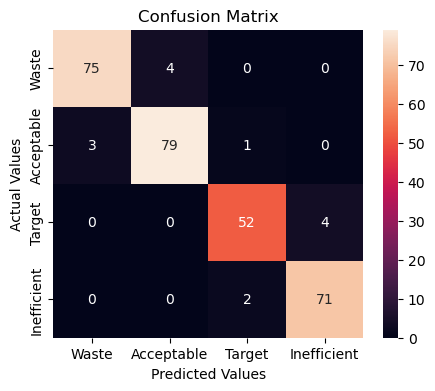

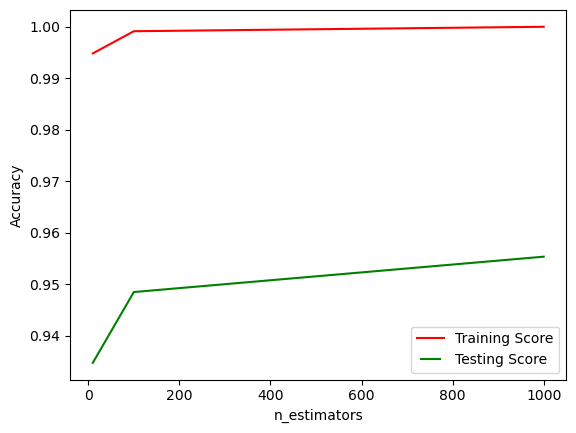

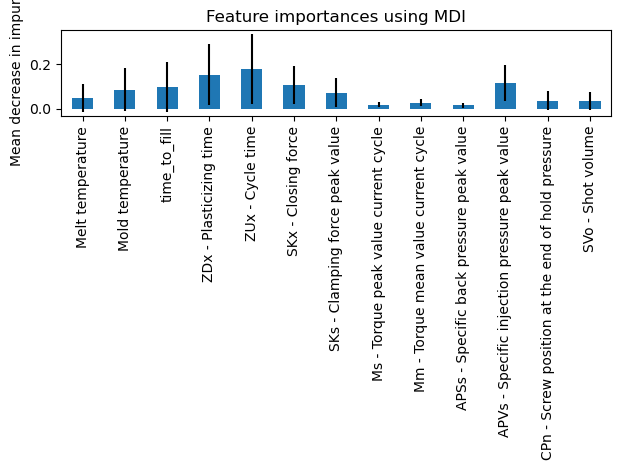

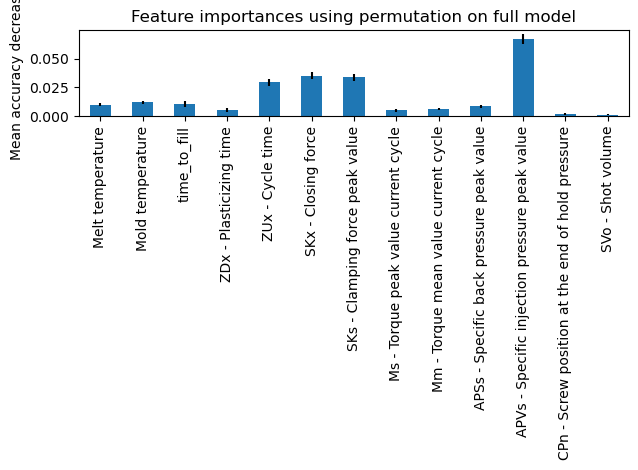

Normalized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.945690 using {'max_depth': 50, 'max_features': 'sqrt', 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.95      0.96      0.96        79
         2.0       0.96      0.94      0.95        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


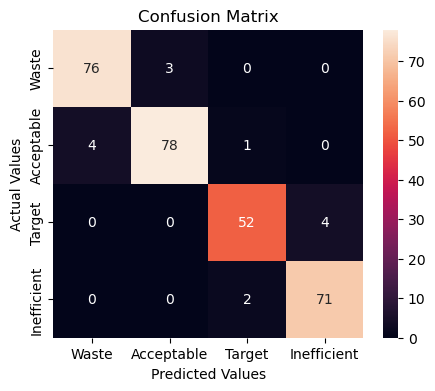

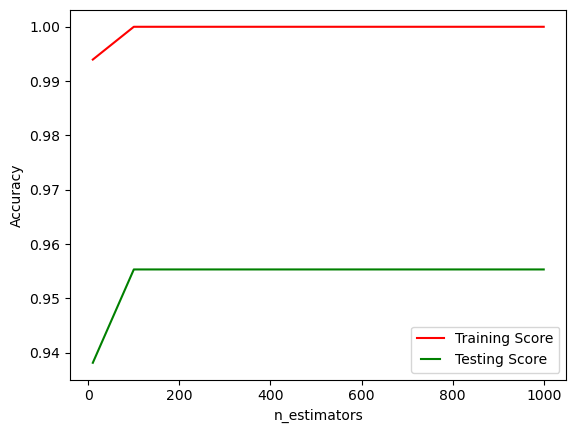

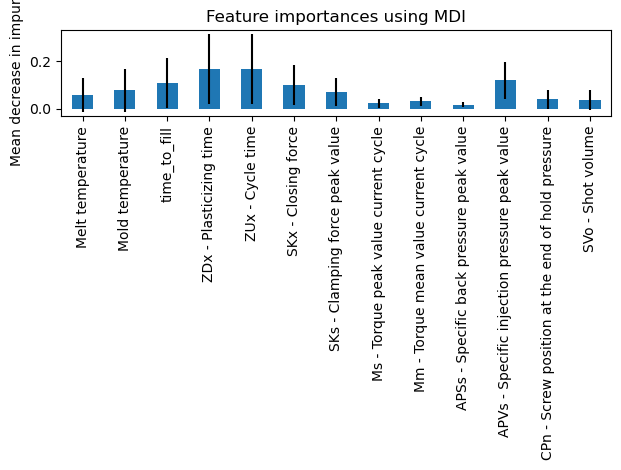

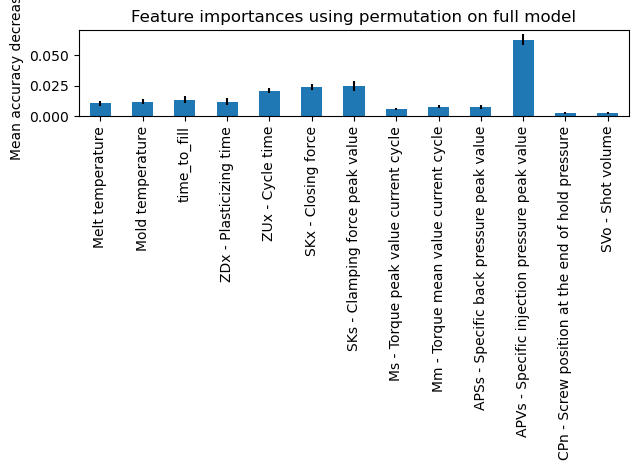

Standardized Data without strong correlations
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.943103 using {'max_depth': 10, 'max_features': 'log2', 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.95      0.96      0.96        79
         2.0       0.96      0.94      0.95        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9484536082474226
Confusion Matrix: 


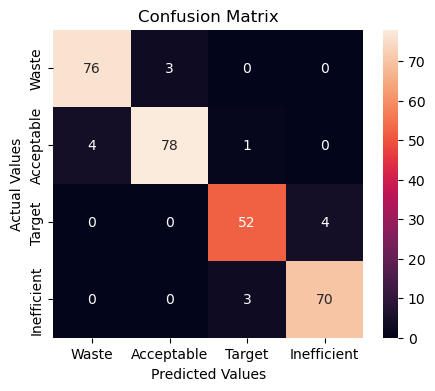

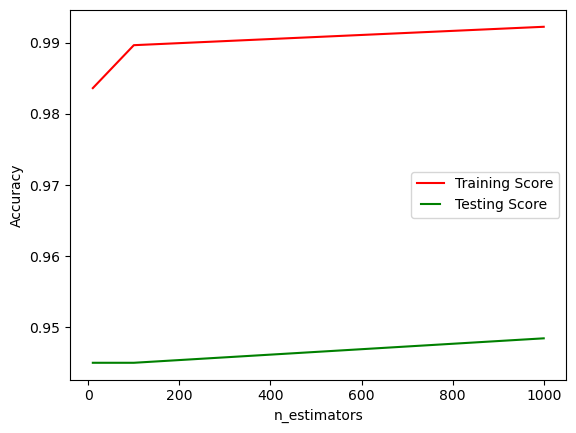

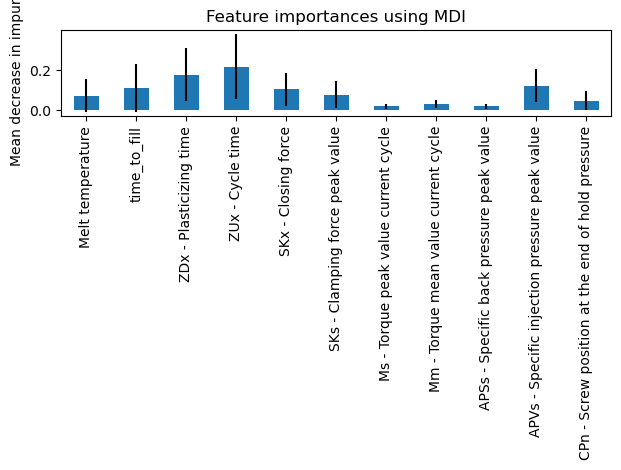

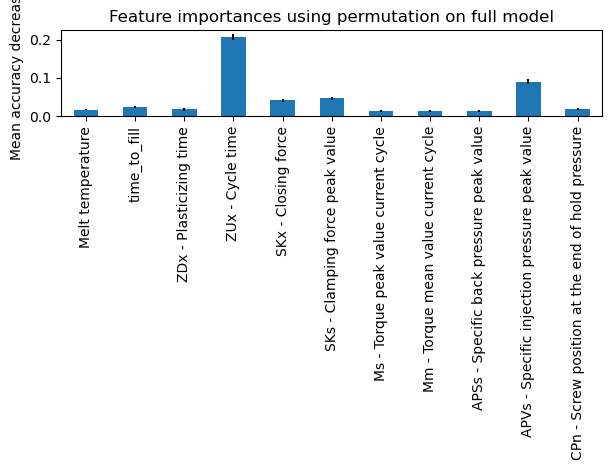

Normalized Data without strong correlations
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.943103 using {'max_depth': 50, 'max_features': 'sqrt', 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.94      0.97      0.96        79
         2.0       0.97      0.93      0.95        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9484536082474226
Confusion Matrix: 


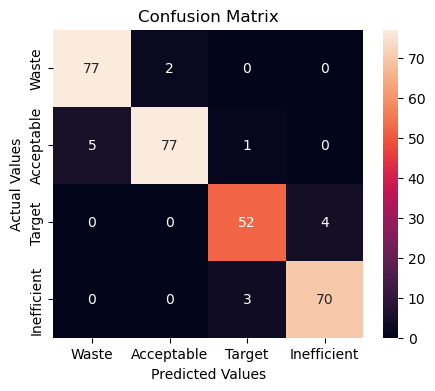

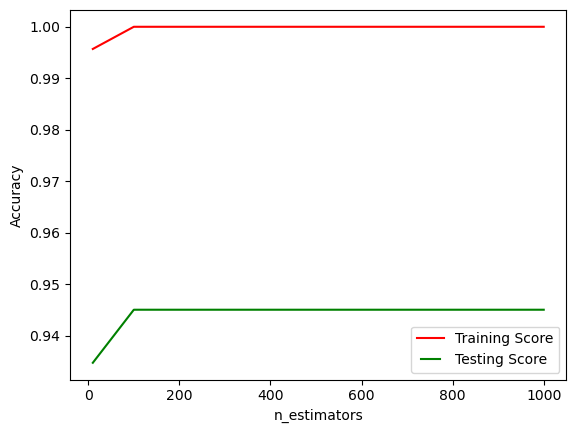

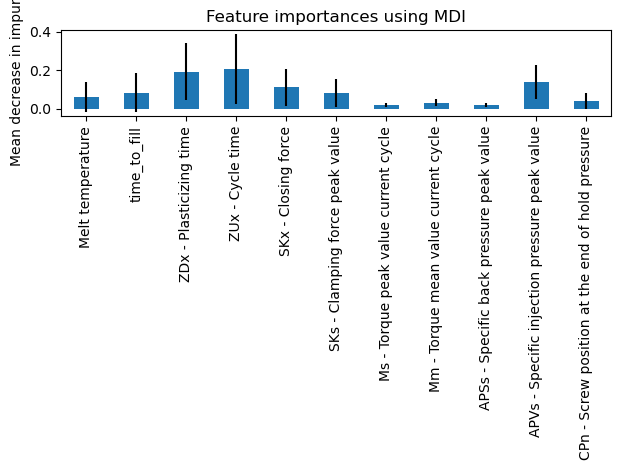

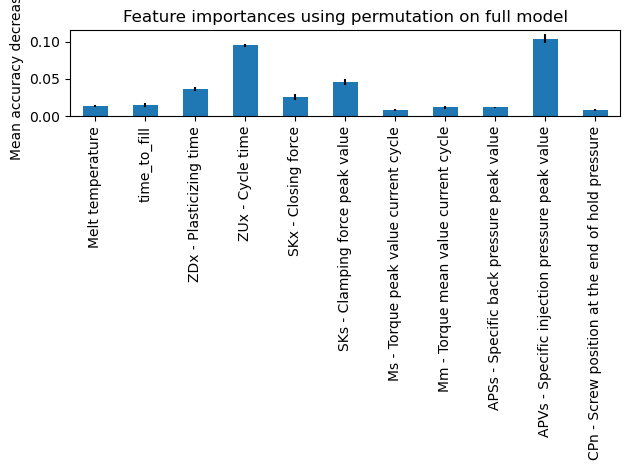

Standardized Data without not important features
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.946552 using {'max_depth': 50, 'max_features': 'sqrt', 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9553264604810997
Confusion Matrix: 


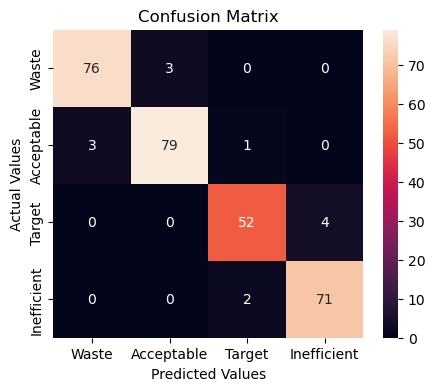

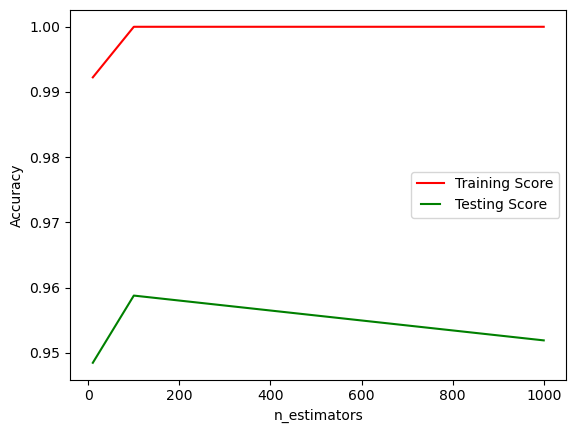

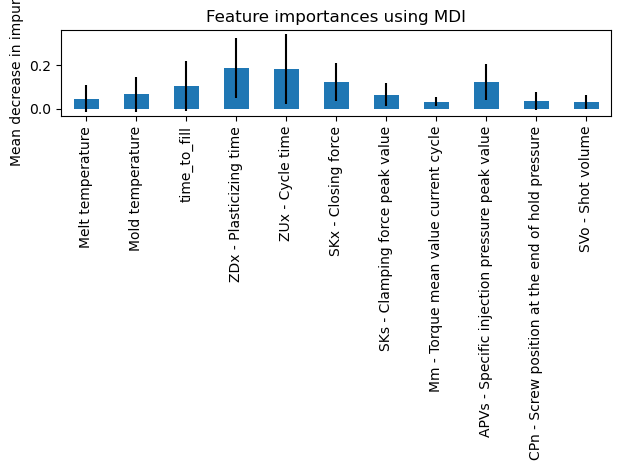

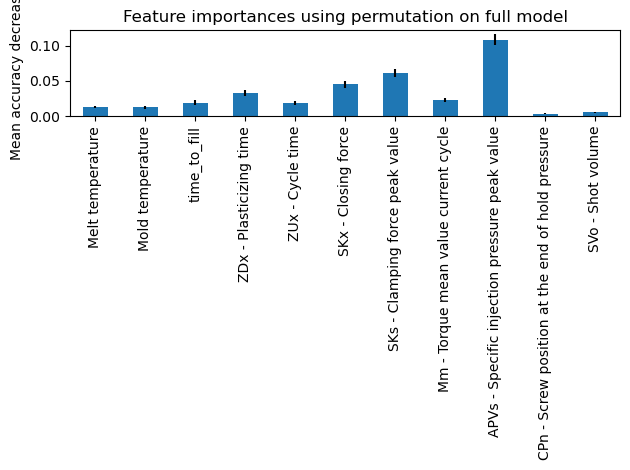

Normalized Data without not important features
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.946552 using {'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 1000}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96        79
         2.0       0.95      0.95      0.95        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


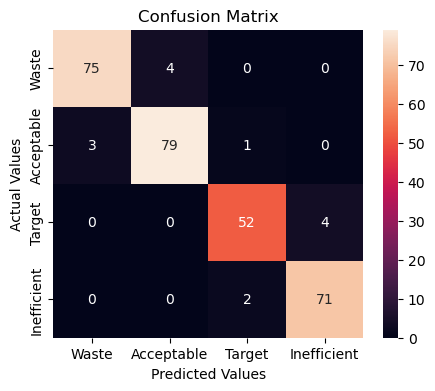

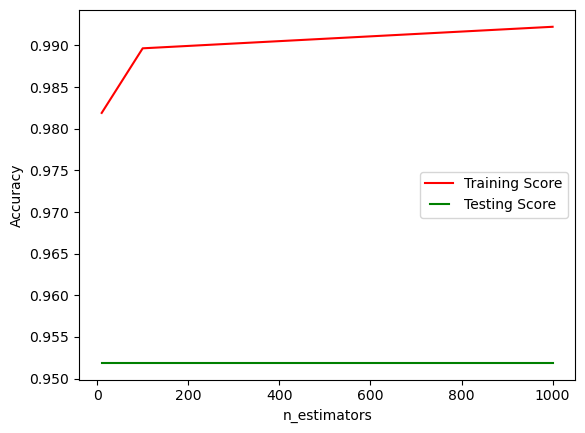

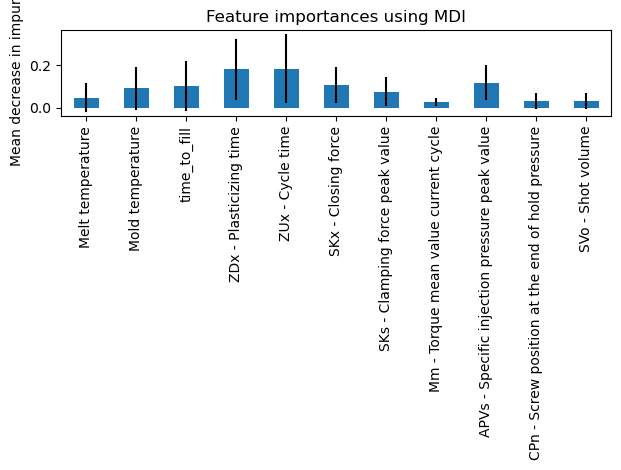

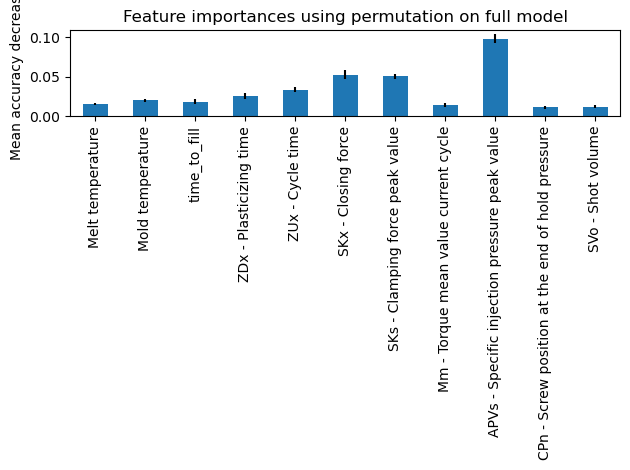

Fully Clean Standardized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.944828 using {'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.94      0.95      0.94        79
         2.0       0.95      0.93      0.94        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9415807560137457
Confusion Matrix: 


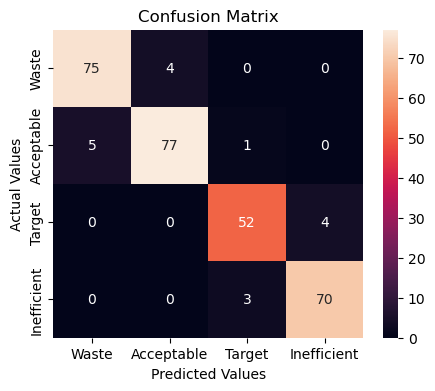

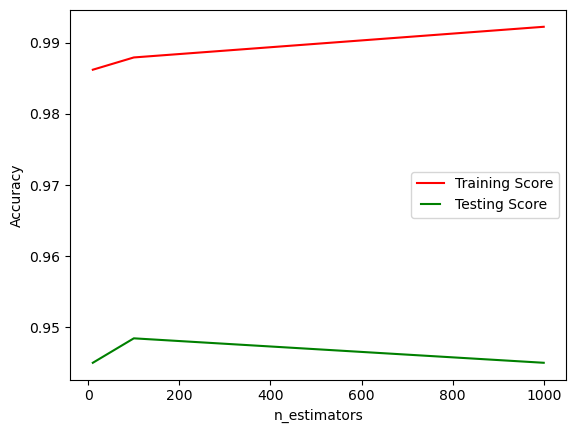

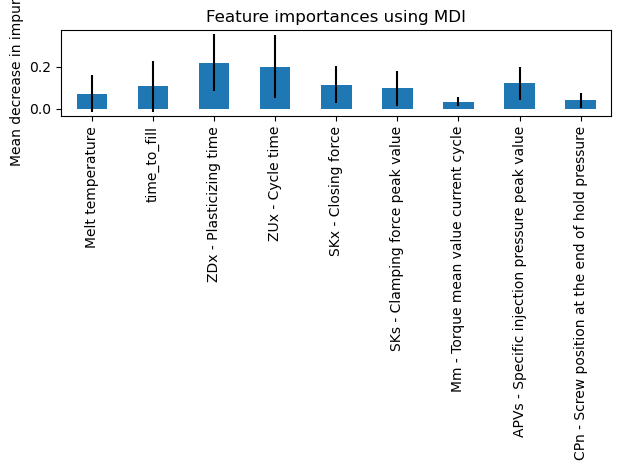

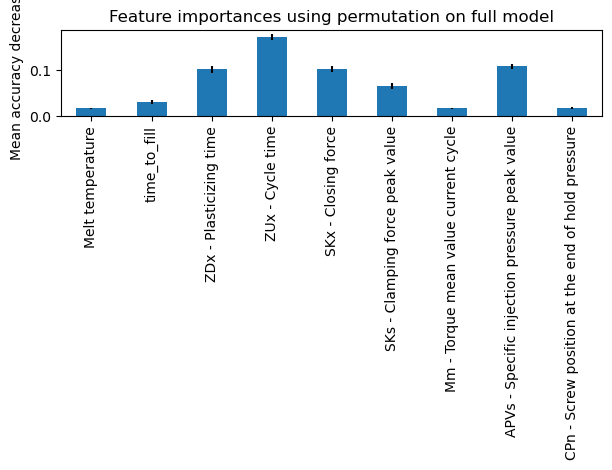

Fully Clean Normalized data
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best: 0.945690 using {'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.95      0.96        79
         2.0       0.95      0.95      0.95        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9450171821305842
Confusion Matrix: 


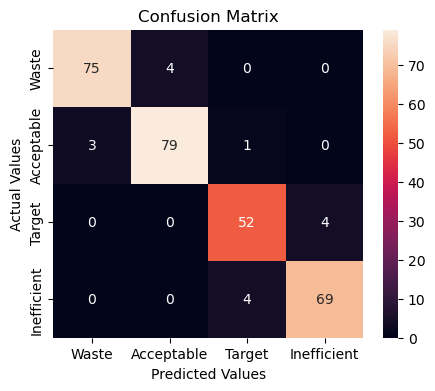

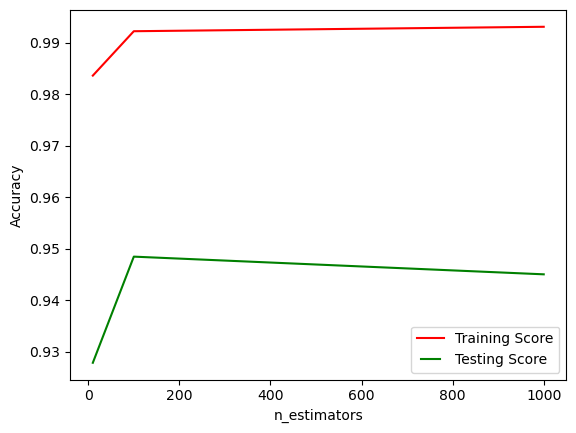

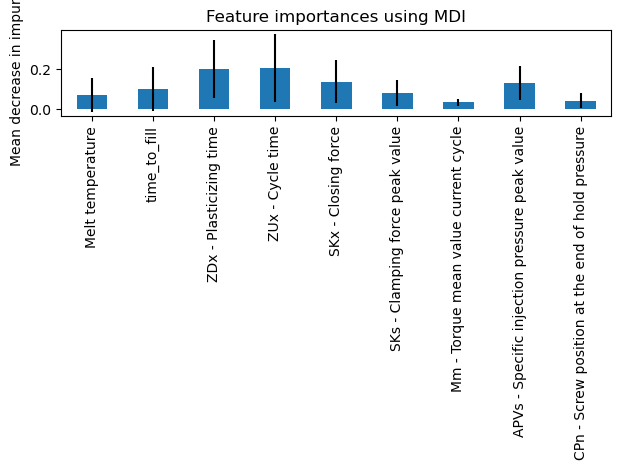

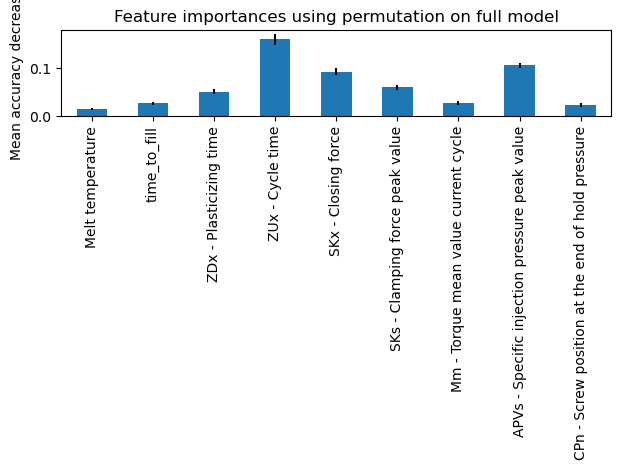

In [82]:
for key, X_data in datasets.items():
    print(key)
    score, model = random_forest_classifier(X_data[0], y_train, X_data[1], y_test)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

## XgBoost


In [83]:
def xgboost_classifier(X_train, y_train, X_test, y_test):
  xgb_model = xgb.XGBClassifier()
  param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300]
  }
  best_params, best_model = hyper_param_tuning(xgb_model, param_grid, X_train, y_train)
  # Make predictions with the best model
  y_pred = best_model.predict(X_test)
  score, _ = score_of_model(y_test, y_pred)
  return score, best_model
  

Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.941379 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.97      0.95      0.96        79
         1.0       0.94      0.96      0.95        83
         2.0       0.95      0.93      0.94        56
         3.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


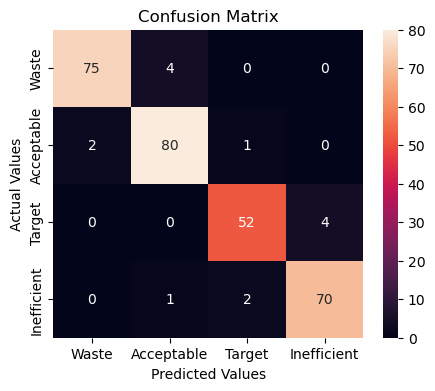

Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.941379 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.97      0.95      0.96        79
         1.0       0.94      0.96      0.95        83
         2.0       0.95      0.93      0.94        56
         3.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


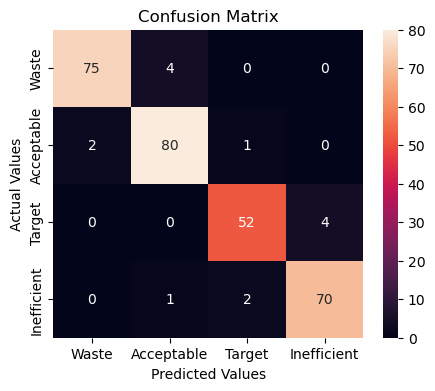

Standardized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.936207 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.96      0.95      0.96        79
         1.0       0.95      0.95      0.95        83
         2.0       0.93      0.93      0.93        56
         3.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9484536082474226
Confusion Matrix: 


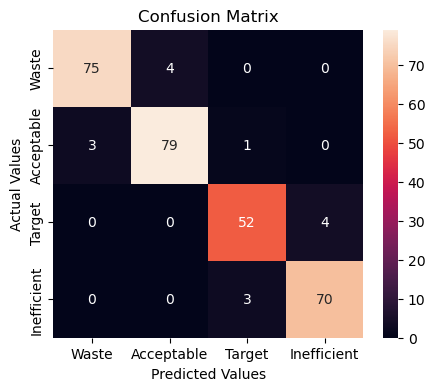

Normalized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.936207 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.96      0.95      0.96        79
         1.0       0.95      0.95      0.95        83
         2.0       0.93      0.93      0.93        56
         3.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9484536082474226
Confusion Matrix: 


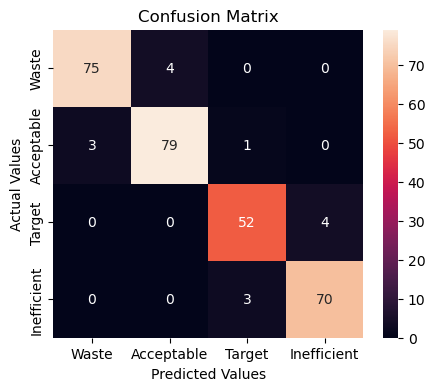

Standardized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.941379 using {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.96      0.89      0.92        79
         1.0       0.92      0.95      0.93        83
         2.0       0.91      0.93      0.92        56
         3.0       0.95      0.97      0.96        73

    accuracy                           0.93       291
   macro avg       0.93      0.93      0.93       291
weighted avg       0.94      0.93      0.93       291

Accuracy score: 
0.9347079037800687
Confusion Matrix: 


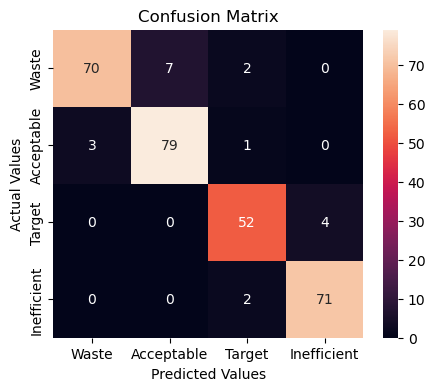

Normalized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.941379 using {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.96      0.89      0.92        79
         1.0       0.92      0.95      0.93        83
         2.0       0.91      0.93      0.92        56
         3.0       0.95      0.97      0.96        73

    accuracy                           0.93       291
   macro avg       0.93      0.93      0.93       291
weighted avg       0.94      0.93      0.93       291

Accuracy score: 
0.9347079037800687
Confusion Matrix: 


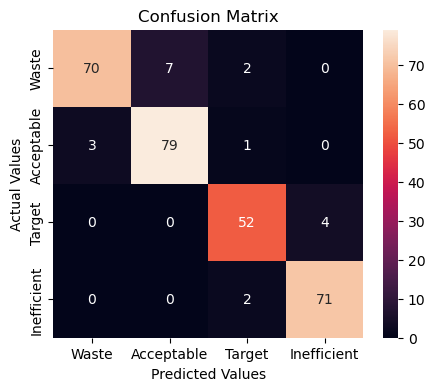

Fully Clean Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.940517 using {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 300}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.96      0.92      0.94        79
         1.0       0.93      0.95      0.94        83
         2.0       0.93      0.93      0.93        56
         3.0       0.95      0.96      0.95        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9415807560137457
Confusion Matrix: 


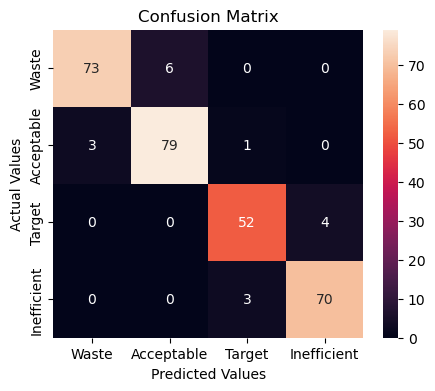

Fully Clean Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.940517 using {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 300}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.96      0.92      0.94        79
         1.0       0.93      0.95      0.94        83
         2.0       0.93      0.93      0.93        56
         3.0       0.95      0.96      0.95        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9415807560137457
Confusion Matrix: 


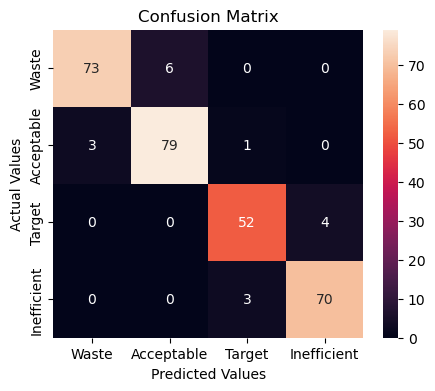

In [84]:
for key, X_data in datasets.items():
    print(key)
    y_train_c = y_train.copy() - 1
    y_test_c = y_test.copy() - 1
    score, model = xgboost_classifier(X_data[0], y_train_c, X_data[1], y_test_c)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

## Gradient Boosting

In [85]:
def gradient_boosting_classifier(X_train, y_train, X_test, y_test):
  grad = GradientBoostingClassifier()
  param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300],
  }
  best_params, best_model = hyper_param_tuning(grad, param_grid, X_train, y_train)
  # Make predictions with the best model
  y_pred = best_model.predict(X_test)
  score, _ = score_of_model(y_test, y_pred)
  return score, best_model

Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.940517 using {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.94      0.97      0.96        79
         2.0       0.97      0.93      0.95        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9450171821305842
Confusion Matrix: 


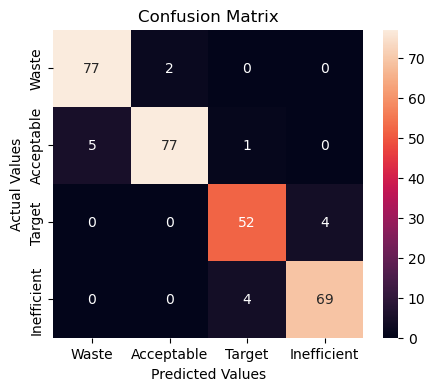

Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.940517 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.93      0.93      0.93        56
         4.0       0.95      0.96      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9518900343642611
Confusion Matrix: 


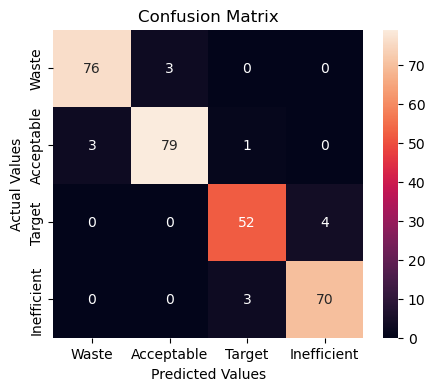

Standardized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.936207 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.95      0.96        79
         2.0       0.95      0.96      0.96        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9484536082474226
Confusion Matrix: 


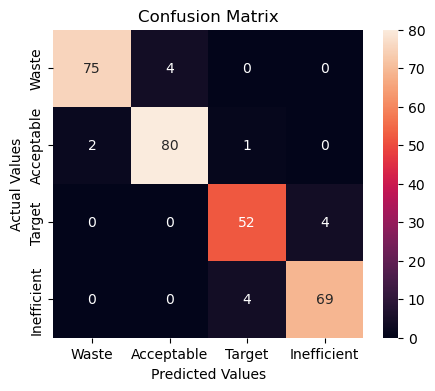

Normalized Data without strong correlations
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.939655 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.95      0.96        79
         2.0       0.95      0.96      0.96        83
         3.0       0.91      0.93      0.92        56
         4.0       0.95      0.95      0.95        73

    accuracy                           0.95       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9484536082474226
Confusion Matrix: 


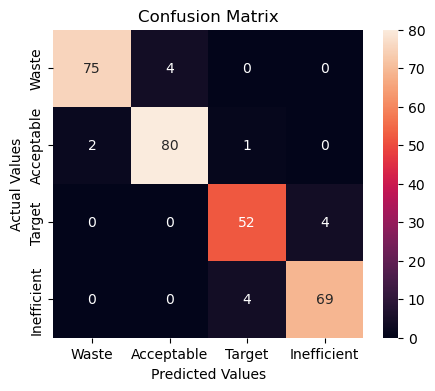

Standardized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.940517 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9553264604810997
Confusion Matrix: 


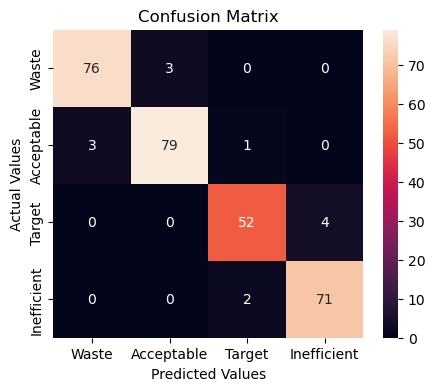

Normalized Data without not important features
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.941379 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.95      0.93      0.94        56
         4.0       0.95      0.97      0.96        73

    accuracy                           0.96       291
   macro avg       0.95      0.95      0.95       291
weighted avg       0.96      0.96      0.96       291

Accuracy score: 
0.9553264604810997
Confusion Matrix: 


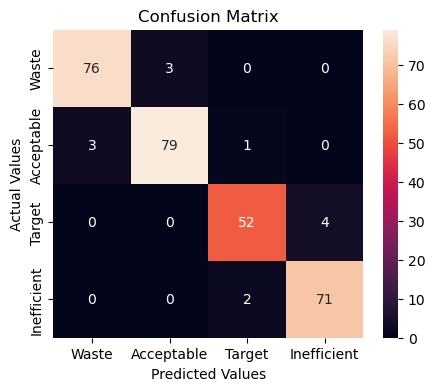

Fully Clean Standardized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.933621 using {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96        79
         2.0       0.96      0.95      0.96        83
         3.0       0.90      0.93      0.91        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.95       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.95      0.95      0.95       291

Accuracy score: 
0.9450171821305842
Confusion Matrix: 


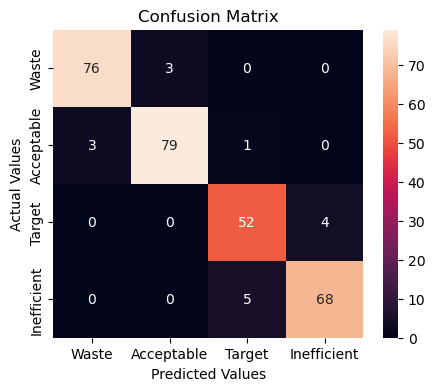

Fully Clean Normalized data
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best: 0.933621 using {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 300}
Classification report: 
              precision    recall  f1-score   support

         1.0       0.97      0.94      0.95        79
         2.0       0.94      0.96      0.95        83
         3.0       0.90      0.93      0.91        56
         4.0       0.94      0.93      0.94        73

    accuracy                           0.94       291
   macro avg       0.94      0.94      0.94       291
weighted avg       0.94      0.94      0.94       291

Accuracy score: 
0.9415807560137457
Confusion Matrix: 


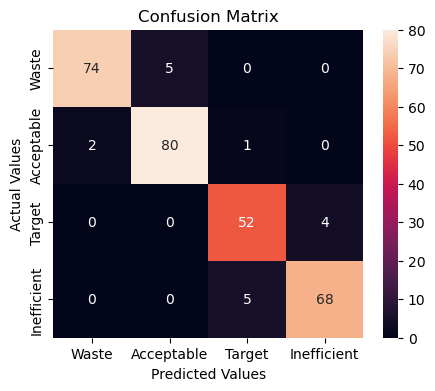

In [86]:
for key, X_data in datasets.items():
    print(key)
    score, model = gradient_boosting_classifier(X_data[0], y_train, X_data[1], y_test)
    result = np.append(result, [str(model.__class__.__name__), str(key), score])

In [87]:
result1 = result.copy()


In [88]:
models = result1[::3]
data_type = result1[1::3]
accuracy = result1[2::3]
res_df = pd.DataFrame({'Model': models, 'Name of data': data_type, 'Accuracy': accuracy.flatten()})
res_df.reset_index(drop=True, inplace=True)
res_df['Accuracy']=res_df['Accuracy'].astype(float)
res_df['Accuracy'] = res_df['Accuracy'].apply(lambda x: f"{x*100:.2f}%")
res_df = res_df.sort_values('Accuracy', ascending=False)
res_df.reset_index(drop=True, inplace=True)
res_df

,Model,Name of data,Accuracy
0,RandomForestRegressor,Normalized data,95.88%
1,XGBRegressor,Normalized data,95.88%
2,XGBRegressor,Standardized data,95.88%
3,RandomForestRegressor,Normalized Data without not important features,95.53%
4,GradientBoostingRegressor,Standardized Data without not important features,95.53%
...,...,...,...
139,LinearRegression,Normalized Data without strong correlations,83.85%
140,LinearRegression,Standardized Data without strong correlations,83.85%
141,Lasso,Standardized Data without strong correlations,83.85%
142,LinearRegression,Standardized data,81.44%


In [89]:
res_df.head()

,Model,Name of data,Accuracy
0,RandomForestRegressor,Normalized data,95.88%
1,XGBRegressor,Normalized data,95.88%
2,XGBRegressor,Standardized data,95.88%
3,RandomForestRegressor,Normalized Data without not important features,95.53%
4,GradientBoostingRegressor,Standardized Data without not important features,95.53%
